# Introduction

In this data preprocessing phase, we will proceed with caution, avoiding excessive removal of data or columns due to missing values and outliers. We will only drop data or columns that have more than 60% missing values, as we consider these features to be insignificant. Additionally, we will remove certain outliers that we identify as anomalies and features that has no correlation or weak correlation because the features is too many and likely be curse of dimensionality.

# Application Train

## Data Preprocessing

Before we predicting using machine learning, we will use **aplication_train** dataset only because the limitation of computer to process all datasets given. 

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import boxcox, yeojohnson

In [2]:
train = pd.read_csv(r'C:\Users\aldiv\Downloads\Data Analyst\Project based intern\Home Credit\Final Tasks\application_train.csv')

In [3]:
train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [4]:
from autoviz import data_cleaning_suggestions
data_cleaning_suggestions(train)

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_CURR,int64,0.000000,100,100002.000000,456255.000000,Possible ID column: drop before modeling step.
TARGET,int64,0.000000,0,0.000000,1.000000,No issue
NAME_CONTRACT_TYPE,object,0.000000,0,,,No issue
CODE_GENDER,object,0.000000,0,,,1 rare categories: ['XNA']. Group them into a single category or drop the categories.
FLAG_OWN_CAR,object,0.000000,0,,,No issue
FLAG_OWN_REALTY,object,0.000000,0,,,No issue
CNT_CHILDREN,int64,0.000000,0,0.000000,19.000000,"Column has 4272 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them., Column has a high correlation with ['CNT_FAM_MEMBERS']. Consider dropping one of them."
AMT_INCOME_TOTAL,float64,0.000000,NA,25650.000000,117000000.000000,Column has 14035 outliers greater than upper bound (337500.00) or lower than lower bound(-22500.00). Cap them or remove them.
AMT_CREDIT,float64,0.000000,NA,45000.000000,4050000.000000,Column has 6562 outliers greater than upper bound (1616625.00) or lower than lower bound(-537975.00). Cap them or remove them.
AMT_ANNUITY,float64,0.003902,NA,1615.500000,258025.500000,"12 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 7504 outliers greater than upper bound (61704.00) or lower than lower bound(-10584.00). Cap them or remove them."


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_CURR,int64,0.000000,100,100002.0,456255.0,Possible ID column: drop before modeling step.
TARGET,int64,0.000000,0,0.0,1.0,No issue
NAME_CONTRACT_TYPE,object,0.000000,0,,,No issue
CODE_GENDER,object,0.000000,0,,,1 rare categories: ['XNA']. Group them into a single category or drop the categories.
FLAG_OWN_CAR,object,0.000000,0,,,No issue
FLAG_OWN_REALTY,object,0.000000,0,,,No issue
CNT_CHILDREN,int64,0.000000,0,0.0,19.0,"Column has 4272 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them., Column has a high correlation with ['CNT_FAM_MEMBERS']. Consider dropping one of them."
AMT_INCOME_TOTAL,float64,0.000000,NA,25650.0,117000000.0,Column has 14035 outliers greater than upper bound (337500.00) or lower than lower bound(-22500.00). Cap them or remove them.
AMT_CREDIT,float64,0.000000,NA,45000.0,4050000.0,Column has 6562 outliers greater than upper bound (1616625.00) or lower than lower bound(-537975.00). Cap them or remove them.
AMT_ANNUITY,float64,0.003902,NA,1615.5,258025.5,"12 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 7504 outliers greater than upper bound (61704.00) or lower than lower bound(-10584.00). Cap them or remove them."


## Feature Selection
Using Autoviz, we can quickly checking the characteristics of features such as missing values, unique values, minimum and maximum values, outliers, and correlation between features and target. Before cleaning the data, we will select feature who has correlation with the label "TARGET" and drop feature with high correlation (above 0.7) and considering drop feature with missing values (%) above 60% because those features might be not giving any insight for learning.

Features Drop:
- SK_ID_CURR: beacuse this feature is primary key and must be drop before preprocessing
- CNT_CHILDREN: We drop this feature because has a high correlation with CNT_FAM_MEMBERS and CNT_FAM_MEMBERS will give more insight about client's family members.
- AMT_GOODS_PRICE: We drop feature because it is has a high correlation with AMT_CREDIT. AMT_GOODS_PRICE is the price of the goods for which the loan is given and since client's not only loan for goods, AMT_CREDIT is more general to representated the amount of client loans.
- OWN_CAR_AGE: This feature has missing value above 60%
- REGION_RATING_CLIENT: We considering to drop this feature because this feature has a high correlation with REGION_RATING_CLIENT_w_CITY and this feature is more detail because considering the city where client lives.
- YEARS_BUILD_AVG: This feature has missing values above 60%
- COMMONAREA_AVG: This feature has missing values above 60%
- ELEVATORS_AVG: This feature has a high correlation with APRTEMENTS_AVG and we choose to drop this feature
- FLOORSMAX_AVG: This feature has a high correlation with APARTMENTS_AVG
- FLOORSMIN_AVG: This feature has missing values above 60%
- LIVINGAPARTMENTS_AVG: This feature has missing values above 60%
- LIVINGAREA_AVG: This feature has a high correlation with APRTEMENTS_AVG, ELEVATORS_AVG, and LIVINGAPARTMENTS_AVG
- NONLIVINGAPARTMENTS_AVG: This feature has missing values above 60%
- APARTMENTS_MODE: We drop this feature because has a high correlation with APARTMENTS_AVG, ELEVATORS_AVG, LIVINGAPARTMENTS_AVG, and LIVINGAREA_AVG
- BASEMENTAREA_MODE: We drop this feature because has a high correlation with BASEMENTAREA_AVG
- YEARS_BEGINEXPLUATATION_MODE: We drop this feature because has a high correlation with YEARS_BEGINEXPLUATATION_AVG
- YEARS_BUILD_MODE: We drop this feature because has a high correlation with YEARS_BUILD_AVG
- COMMONAREA_MODE: We drop this feature because has a high correlation with COMMONAREA_AVG
- ELEVATORS_MODE: We drop this feature because has a high correlation with APARTMENTS_AVG, ELEVATORS_AVG, and LIVINGAREA_AVG
- ENTRANCES_MODE: We drop this feature because has a high correlation with ENTRANCES_AVG
- FLOORSMAX_MODE: We drop this feature because has a high correlation with FLOORSMAX_AVG
- FLOORSMIN_MODE: We drop this feature because has a high correlation with FLOORSMIN_AVG
- LANDAREA_MODE: We drop this feature because has a high correlation with LANDAREA_AVG
- LIVINGAPARTMENTS_MODE: We drop this feature because has a high correlation with FLOORSMIN_AVG
- LIVINGAREA_MODE: We drop this feature because has a high correlation with APARTMENTS_AVG, ELEVATORS_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, APARTMENTS_MODE, ELEVATORS_MODE, LIVINGAPARTMENTS_MODE
- NONLIVINGAPARTMENTS_MODE: This feature has missing values above 60%
- NONLIVINGAREA_MODE: We drop this feature because has a high correlation with NONLIVINGAREA_AVG
- APARTMENTS_MEDI: We drop this feature because has a high correlation with APARTMENTS_AVG, ELEVATORS_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, 'APARTMENTS_MODE, ELEVATORS_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE
- BASEMENTAREA_MEDI: We drop this feature because has a high correlation with BASEMENTAREA_AVG, BASEMENTAREA_MODE
- YEARS_BEGINEXPLUATATION_MEDI: We drop this feature because has a high correlation with YEARS_BEGINEXPLUATATION_AVG, YEARS_BEGINEXPLUATATION_MODE
- YEARS_BUILD_MEDI: We drop this feature because has a high correlation with YEARS_BUILD_AVG, YEARS_BUILD_MODE
- COMMONAREA_MEDI: We drop this feature because has a high correlation with COMMONAREA_AVG, COMMONAREA_MODE
- ELEVATORS_MEDI: We drop this feature because has a high correlation with APARTMENTS_AVG, ELEVATORS_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, APARTMENTS_MODE, ELEVATORS_MODE, LIVINGAREA_MODE, APARTMENTS_MEDI
- ENTRANCES_MEDI: We drop this feature because has a high correlation with ENTRANCES_AVG, ENTRANCES_MODE
- FLOORSMAX_MEDI: We drop this feature because has a high correlation with FLOORSMAX_AVG, FLOORSMAX_MODE
- FLOORSMIN_MEDI: We drop this feature because has a high correlation with FLOORSMIN_AVG, FLOORSMIN_MODE
- LANDAREA_MEDI: We drop this feature because has a high correlation with LANDAREA_AVG, LANDAREA_MODE
- LIVINGAPARTMENTS_MEDI: We drop this feature because has a high correlation with APARTMENTS_AVG, ELEVATORS_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, APARTMENTS_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, APARTMENTS_MEDI, ELEVATORS_MEDI
- LIVINGAREA_MEDI: We drop this feature because has a high correlation with APARTMENTS_AVG, ELEVATORS_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, APARTMENTS_MODE, ELEVATORS_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, APARTMENTS_MEDI, ELEVATORS_MEDI, LIVINGAPARTMENTS_MEDI
- NONLIVINGAPARTMENTS_MEDI: We drop this feature because has a high correlation with NONLIVINGAPARTMENTS_AVG, NONLIVINGAPARTMENTS_MODE
- NONLIVINGAREA_MEDI: We drop this feature because has a high correlation with NONLIVINGAREA_AVG, NONLIVINGAREA_MODE 
- FONDKAPREMONT_MODE: This feature has missing value above 60%
- TOTALAREA_MODE: We drop this feature because has a high correlation with APARTMENTS_AVG, ELEVATORS_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, APARTMENTS_MODE, ELEVATORS_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, APARTMENTS_MEDI, ELEVATORS_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI
- OBS_30_CNT_SOCIAL_CIRCLE: This feature has a high correlation with OBS_60_CNT_SOCIAL_CIRCLE and we choose to drop it because OBS_60_CNT_SOCIAL_CIRCLE more broad than OBS_30_CNT_SOCIAL_CIRCLE
- DEF_30_CNT_SOCIAL_CIRCLE: This feature has a high correlation with DEF_60_CNT_SOCIAL_CIRCLE and we choose to drop it because DEF_60_CNT_SOCIAL_CIRCLE more broad than DEF_30_CNT_SOCIAL_CIRCLE

In [5]:
train_feat_select = train.drop(columns=['CNT_CHILDREN', 'AMT_GOODS_PRICE', 'OWN_CAR_AGE', 'REGION_RATING_CLIENT', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
                                        'ELEVATORS_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'APARTMENTS_MODE', 
                                        'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE',
                                        'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE',
                                        'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI',
                                        'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI',
                                        'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI', 'FONDKAPREMONT_MODE',
                                        'TOTALAREA_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE'
                                        ])

In [6]:
from scipy.stats import chi2_contingency

def chi_square_test(df, feature, target='TARGET'):
    contingency_table = pd.crosstab(df[feature], df[target])
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    return feature, chi2, p_value, dof

categorical_features = train_feat_select.select_dtypes(include=['object']).columns.tolist()

# Lakukan uji Chi-Square untuk setiap fitur kategorikal
results = []    
for feature in categorical_features:
    results.append(chi_square_test(train_feat_select, feature))

# Buat DataFrame dari hasil dan urutkan berdasarkan p-value
results_df = pd.DataFrame(results, columns=['Feature', 'Chi-Square', 'p-value', 'DoF'])
results_df = results_df.sort_values('p-value')

# Tampilkan hasil
print("Chi-Square Test Results for Categorical Features vs TARGET:")
print(results_df.to_string(index=False))

Chi-Square Test Results for Categorical Features vs TARGET:
         Feature            Chi-Square     p-value    DoF
         ORGANIZATION_TYPE 1609.240636 5.224541e-299  57 
           OCCUPATION_TYPE 1402.846796 3.784500e-288  17 
          NAME_INCOME_TYPE 1253.470808 1.928146e-266   7 
       NAME_EDUCATION_TYPE 1019.213187 2.447681e-219   4 
               CODE_GENDER  920.791334 1.129022e-200   2 
        NAME_FAMILY_STATUS  504.694083 7.744842e-107   5 
         NAME_HOUSING_TYPE  420.556190  1.099089e-88   5 
        NAME_CONTRACT_TYPE  293.150542  1.023515e-65   1 
              FLAG_OWN_CAR  146.656018  9.330994e-34   1 
        WALLSMATERIAL_MODE  139.235314  1.453180e-27   6 
            HOUSETYPE_MODE   27.632556  9.992328e-07   2 
       EMERGENCYSTATE_MODE   23.678150  1.138680e-06   1 
           NAME_TYPE_SUITE   32.825315  1.132931e-05   6 
           FLAG_OWN_REALTY   11.575827  6.681470e-04   1 
WEEKDAY_APPR_PROCESS_START   15.387557  1.744737e-02   6 


Using chi-squared method, we want to analyze the correlation between categorical features with the target. The result is every categorical features has p-value below 0.05, which means all categorical features has correlation with the TARGET. But, ORGANIZATION_TYPE and OCCUPATION_TYPE have high unique number that highly get curse of dimensionality. We will reduced the by aggregating the values that has same characteristics. Thus, the data still have many features so we will reduced by dropping belom chi-squared under 300.

In [7]:
train_feat_select = train_feat_select.drop(columns=['NAME_CONTRACT_TYPE', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE',
                                        'WEEKDAY_APPR_PROCESS_START', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'
                                        ])

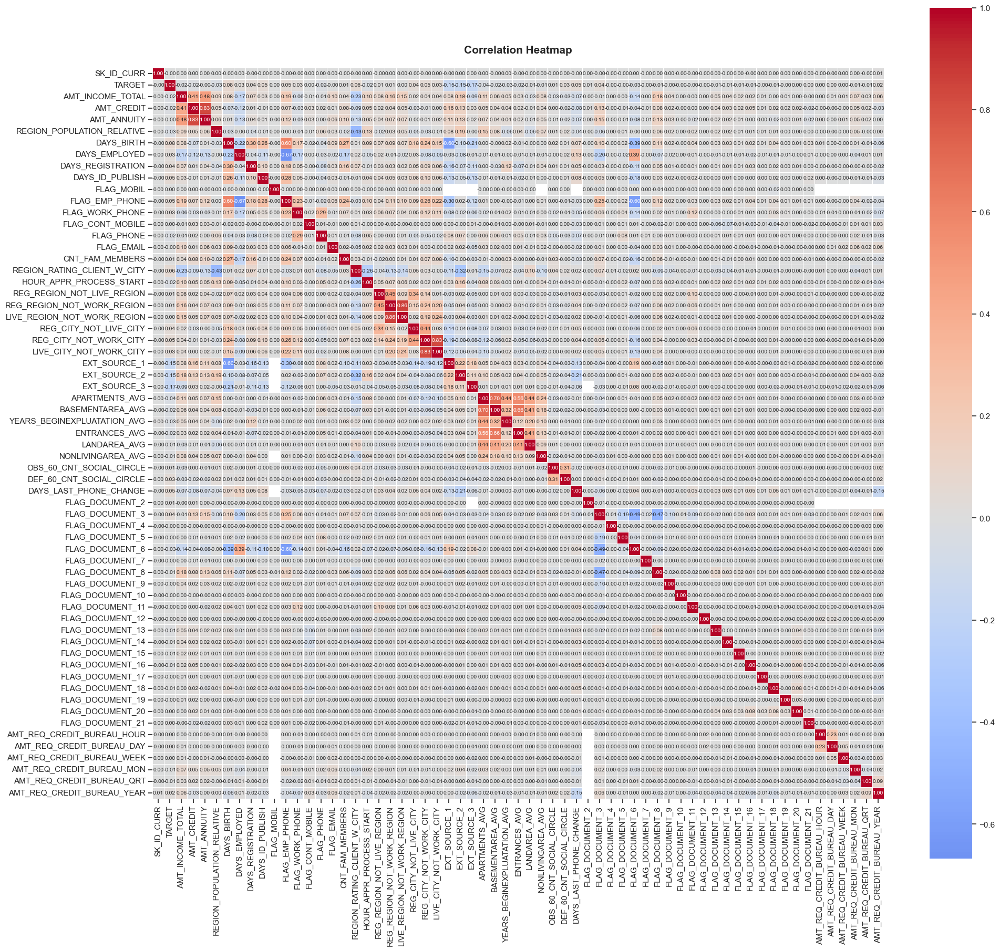


Pasangan fitur dengan korelasi tinggi (>0.7):
AMT_CREDIT - AMT_ANNUITY: 0.83
REG_REGION_NOT_WORK_REGION - LIVE_REGION_NOT_WORK_REGION: 0.86
REG_CITY_NOT_WORK_CITY - LIVE_CITY_NOT_WORK_CITY: 0.83


In [8]:
%matplotlib inline

numerical_cols = train_feat_select.select_dtypes(['float64', 'int64']).columns
plt.figure(figsize=(20, 20))
correlation_matrix = train_feat_select[numerical_cols].corr(method='spearman')
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f', square=True, linewidths=0.5, annot_kws={'size': 7.5},
            xticklabels=correlation_matrix.columns, yticklabels=correlation_matrix.columns)
plt.title('Correlation Heatmap', pad = 20, fontweight='bold', fontsize = 15)
#plt.tight_layout()
plt.show()
plt.close()

threshold = 0.7
high_corr_features = np.where(np.abs(correlation_matrix) > threshold)
high_corr_features = [(correlation_matrix.index[x], correlation_matrix.columns[y], correlation_matrix.iloc[x,y]) 
                      for x, y in zip(*high_corr_features) if x != y and x < y]

print("\nPasangan fitur dengan korelasi tinggi (>0.7):")
for feat1, feat2, corr in high_corr_features:
    print(f"{feat1} - {feat2}: {corr:.2f}")

Based on correlation between TARGET and Features, EXT_SOURCE_1, EXT_SOURCE_2, and EXT_SOURCE_3 has a small negative correlation. While DAYS_BIRTH and CNT_FAM_MEMBERS has slightly positive correlation towards the TARGET. We will use these features and dropping some features by replacing with new features on Step Feature Engineering. 

In [9]:
data = train_feat_select
dataset_name = 'Application Train Dataset (Selected Features)'
print(f'{dataset_name}')
print(f'There are {data.shape[0]} rows data in {dataset_name}')
print(f'There are {data.shape[1]} columns in {dataset_name}')
data.sample(5)

Application Train Dataset (Selected Features)
There are 307511 rows data in Application Train Dataset (Selected Features)
There are 70 columns in Application Train Dataset (Selected Features)


,SK_ID_CURR,TARGET,CODE_GENDER,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
299582,447067,0,M,103500.0,225000.0,13045.5,Pensioner,Secondary / secondary special,Married,House / apartment,0.026392,-23918,365243,-5840.0,-4582,1,0,0,1,1,0,NaN,2.0,2,10,0,0,0,0,0,0,XNA,NaN,0.415361,NaN,0.0021,NaN,0.9841,NaN,NaN,NaN,0.0,0.0,-388.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
8926,110387,0,F,202500.0,1354500.0,56029.5,Working,Higher education,Married,House / apartment,0.028663,-18200,-2006,-6677.0,-1736,1,1,0,1,0,0,Core staff,5.0,2,10,0,0,0,0,0,0,School,0.692936,0.600375,0.700184,0.0371,0.0785,0.9722,0.1034,0.0225,0.0557,0.0,0.0,-1128.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
139695,261979,0,F,180000.0,714154.5,43821.0,Commercial associate,Higher education,Married,House / apartment,0.018801,-11736,-1550,-5010.0,-4299,1,1,0,1,0,0,High skill tech staff,3.0,2,13,0,0,0,0,1,1,Agriculture,0.280208,0.570961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,-391.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
71850,183316,0,M,360000.0,254700.0,30226.5,State servant,Higher education,Married,House / apartment,0.072508,-12815,-2984,-2631.0,-4390,1,1,0,1,0,0,Managers,3.0,1,15,0,0,0,0,0,0,Emergency,0.527301,0.736104,0.651260,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,-222.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
287638,433192,0,F,121500.0,117162.0,12559.5,Working,Higher education,Civil marriage,House / apartment,0.009549,-12287,-232,-1330.0,-3851,1,1,0,1,0,0,Core staff,5.0,2,18,0,0,0,0,0,0,Other,0.466017,0.576293,0.387625,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,-936.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


## Handling Null Value

There are some missing value that counted as string values, so there is a chance that some missing values will not be handled properly. We will replaced some string missing values untuk nan.

In [10]:
train['CODE_GENDER'].value_counts()

CODE_GENDER
F      202448
M      105059
XNA         4
Name: count, dtype: int64

In [11]:
# List of common missing value strings
missing_values_set = [
    'NA', 'N/A', 'null', 'NaN','nan', 'XNA', 'None', 'empty', 'undefined', 'unknown', 'Unknown',
    '--', 'not available', '',' ','  ','   ', 'missing', 'unavailable', 'not applicable',
    'not found', 'no data', 'no value', 'n/a', 'none', 'null value', 'unknown value', 'blank', 'invalid', 'error',
    'unassigned', 'uninitialized', 'void', 'undisclosed', 'unreported', 'empty string',
    'na', 'not recorded', 'unanswered', 'not specified', 'unobserved', 'unpopulated',
    'none of the above', 'does not apply', 'ignored', 'unspecified', 'unfilled', 'inapplicable',
    'unavailable value', 'not entered', 'missing value', 'data not available', 'data missing',
    'not inputted', 'not given', 'unrecorded', 'unfurnished', 'undocumented', 'not listed',
    'unsupplied', 'empty field', 'unfilled field', 'unanswered question', 'no response',
    'not provided', 'not reported', 'unanswered', 'unacknowledged', 'no information',
    'no response recorded', 'no submission', 'no entry', 'not logged', 'unverified',
    'unobserved value', 'data absent', 'absence', 'unfilled cell', 'undefined data',
    'does not exist', 'not found', 'missing data', 'no answer', 'unavailable information',
    'no input', 'data error', 'unseen', 'unviewed', 'not selected', 'irrelevant',
    'skipped', 'no response given', 'no feedback', 'failed', 'discarded', 'no record',
    'unfetched', 'not completed', 'not finished', 'not updated', 'forgotten', 'rejected',
    'unsupplied data', 'data void', 'undetermined', 'not checked', 'not applicable here',
    'unattended', 'data missing', 'nonexistent', 'unsubscribed', 'denied', 'unaccepted',
    'unwitnessed', 'discarded entry', 'rejected data', 'unapplicable', 'non-populated',
    'unapplicable field', 'lost', 'absent data', 'no match', 'no result'
]

# Optimized function to replace missing-like values with NaN
def replace_missing_with_null(df, missing_values_set):
    # Select object type columns
    df_object_columns = df.select_dtypes(include=['object'])

    # Replace missing-like values with NaN
    for col in df_object_columns.columns:
        # Vectorized replacement of missing-like values with NaN
        df[col] = df[col].apply(lambda x: np.nan if str(x).strip() in missing_values_set else x)

    return df

In [12]:
replace_missing_with_null(data, missing_values_set)

,SK_ID_CURR,TARGET,CODE_GENDER,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,M,202500.0,406597.5,24700.5,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.0690,0.0369,0.0000,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,F,270000.0,1293502.5,35698.5,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.0345,0.0130,0.0098,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,M,67500.0,135000.0,6750.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,F,135000.0,312682.5,29686.5,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,M,121500.0,513000.0,21865.5,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,11,0,0,0,0,1,1,Religion,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,M,157500.0,254700.0,27558.0,Working,Secondary / secondary special,Separated,With parents,0.032561,-9327,-236,-8456.0,-1982,1,1,0,1,0,0,Sales staff,1.0,1,15,0,0,0,0,0,0,Services,0.145570,0.681632,NaN,0.2021,0.0887,0.9876,0.1034,0.0594,0.1095,0.0,0.0,-273.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,F,72000.0,269550.0,12001.5,Pensioner,Secondary / secondary special,Widow,House / apartment,0.025164,-20775,365243,-4388.0,-4090,1,0,0,1,1,0,NaN,1.0,2,8,0,0,0,0,0,0,NaN,NaN,0.115992,NaN,0.0247,0.0435,0.9727,0.1034,0.0579,0.0000,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,F,153000.0,677664.0,29979.0,Working,Higher education,Separated,House / apartment,0.005002,-14966,-

In [13]:
data['CODE_GENDER'].unique()

array(['M', 'F', nan], dtype=object)

In [14]:
# Function untuk mengecek persentase null value

def check_null_percentage(df):
    # Hitung total rows
    total_rows = len(df)

    # Hitung null values dan persentasenya
    null_counts = df.isnull().sum()
    null_percentage = (null_counts / total_rows * 100).round(2)

    # Buat dataframe hasil
    null_df = pd.DataFrame({
        'Total_Null': null_counts,
        'Null_Percentage': null_percentage
    })

    # Sorting berdasarkan persentase null terbesar
    null_df = null_df.sort_values('Null_Percentage', ascending=False)

    # Filter hanya kolom yang memiliki null values
    null_df = null_df[null_df['Total_Null'] > 0]

    return null_df

# # Check null value (data) after handling null value
null_analysis = check_null_percentage(data)
print("Total rows in dataset:", len(data))
print("\nNull Value Analysis:")
print(null_analysis)

Total rows in dataset: 307511

Null Value Analysis:
                             Total_Null  Null_Percentage
LANDAREA_AVG                   182590         59.38     
BASEMENTAREA_AVG               179943         58.52     
EXT_SOURCE_1                   173378         56.38     
NONLIVINGAREA_AVG              169682         55.18     
APARTMENTS_AVG                 156061         50.75     
ENTRANCES_AVG                  154828         50.35     
YEARS_BEGINEXPLUATATION_AVG    150007         48.78     
OCCUPATION_TYPE                 96391         31.35     
EXT_SOURCE_3                    60965         19.83     
ORGANIZATION_TYPE               55374         18.01     
AMT_REQ_CREDIT_BUREAU_HOUR      41519         13.50     
AMT_REQ_CREDIT_BUREAU_MON       41519         13.50     
AMT_REQ_CREDIT_BUREAU_WEEK      41519         13.50     
AMT_REQ_CREDIT_BUREAU_QRT       41519         13.50     
AMT_REQ_CREDIT_BUREAU_YEAR      41519         13.50     
AMT_REQ_CREDIT_BUREAU_DAY       4151

Our next step is to handling missing value, As for:
- missing value around 40% - 60%: We will replace the null value to zero because we do not want to lost too much data and do not want replace them with median or modes to avoiding change of all data.
- missing value under 40%: We will replace them with median (for numerical) and modes (for categorical) because by replacing them will not changing a whole data and we still want to keep the data by not dropping them.

In [15]:
def handling_na(data):
    # Handling missing value with zero
    fill_with_zero = data[['LANDAREA_AVG', 'BASEMENTAREA_AVG', 'EXT_SOURCE_1', 'NONLIVINGAREA_AVG', 'APARTMENTS_AVG', 'ENTRANCES_AVG',
                          'ENTRANCES_AVG', 'YEARS_BEGINEXPLUATATION_AVG']].columns
    for col in fill_with_zero:
        if col in data.columns:
            data[col] = data[col].fillna(0)

    # Handling missing value with median
    fill_with_median = data[['EXT_SOURCE_3', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_DAY',
                            'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_QRT', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'EXT_SOURCE_2',
                            'AMT_ANNUITY', 'CNT_FAM_MEMBERS', 'DAYS_LAST_PHONE_CHANGE']].columns
    for col in fill_with_median:
        if col in data.columns:
            data[col] = data[col].fillna(data[col].median())

    # handling missing value with mode
    fill_with_mode = data[['OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'CODE_GENDER', 
                          'NAME_FAMILY_STATUS']].columns
    for col in fill_with_mode:
        if col in data.columns:
            data[col] = data[col].fillna(data[col].mode()[0])

    return data


In [16]:
data_clean = handling_na(data)

In [17]:
null_analysis = check_null_percentage(data_clean)
print("Total rows in dataset:", len(data_clean))
print("\nNull Value Analysis:")
print(null_analysis)

Total rows in dataset: 307511

Null Value Analysis:
Empty DataFrame
Columns: [Total_Null, Null_Percentage]
Index: []


## Handling Duplicated Data

In [18]:
data_clean.duplicated().sum()

np.int64(0)

There is no duplicated data so we can preprocessing to the next step, handlling outliers

## Handling Outliers

Features that have outliers:
- AMT_INCOME_TOTAL : Column has 14035 outliers greater than upper bound (337500.00) or lower than lower bound(-22500.00). Cap them or remove them.
- AMT_CREDIT : Column has 6562 outliers greater than upper bound (1616625.00) or lower than lower bound(-537975.00). Cap them or remove them.
- AMT_ANNUITY : Column has 7504 outliers greater than upper bound (61704.00) or lower than lower bound(-10584.00). Cap them or remove them.
- REGION_POPULATION_RELATIVE : Column has 8412 outliers greater than upper bound (0.06) or lower than lower bound(-0.02). Cap them or remove them.
- DAYS_EMPLOYED : Column has 72217 outliers greater than upper bound (3417.50) or lower than lower bound(-6466.50). Cap them or remove them.
- DAYS_REGISTRATION : Column has 659 outliers greater than upper bound (6194.25) or lower than lower bound(-15683.75). Cap them or remove them.
- CNT_FAM_MEMBERS : Column has 4007 outliers greater than upper bound (4.50) or lower than lower bound(0.50). Cap them or remove them.
- REGION_RATING_CLIENT_W_CITY : Column has 78027 outliers greater than upper bound (2.00) or lower than lower bound(2.00). Cap them or remove them.
- HOUR_APPR_PROCESS_START : Column has 2257 outliers greater than upper bound (20.00) or lower than lower bound(4.00). Cap them or remove them.
- EXT_SOURCE_3 : Column has 4313 outliers greater than upper bound (0.97) or lower than lower bound(0.09). Cap them or remove them.
- APARTMENTS_AVG : Column has 20804 outliers greater than upper bound (0.21) or lower than lower bound(-0.13). Cap them or remove them.
- BASEMENTAREA_AVG : Column has 14800 outliers greater than upper bound (0.16) or lower than lower bound(-0.10). Cap them or remove them.
- ENTRANCES_AVG : Column has 7032 outliers greater than upper bound (0.34) or lower than lower bound(-0.21). Cap them or remove them.
- LANDAREA_AVG : Column has 31914 outliers greater than upper bound (0.08) or lower than lower bound(-0.05). Cap them or remove them.
- NONLIVINGAREA_AVG : Column has 71720 outliers greater than upper bound (0.00) or lower than lower bound(-0.00). Cap them or remove them.
- OBS_60_CNT_SOCIAL_CIRCLE : Column has 19564 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.
- DEF_60_CNT_SOCIAL_CIRCLE : Column has 25769 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
- DAYS_LAST_PHONE_CHANGE : Column has 435 outliers greater than upper bound (1670.00) or lower than lower bound(-3514.00). Cap them or remove them.
- AMT_REQ_CREDIT_BUREAU_HOUR : Column has 1626 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
- AMT_REQ_CREDIT_BUREAU_DAY : Column has 1489 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
- AMT_REQ_CREDIT_BUREAU_WEEK : Column has 8536 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
- AMT_REQ_CREDIT_BUREAU_MON : Column has 43759 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
- AMT_REQ_CREDIT_BUREAU_QRT : Column has 50575 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
- AMT_REQ_CREDIT_BUREAU_YEAR : Column has 7233 outliers greater than upper bound (6.00) or lower than lower bound(-2.00). Cap them or remove them.

In [19]:
data_clean_outliers = data_clean.copy()

### AMT_INCOME_TOTAL

In [20]:
data_clean['AMT_INCOME_TOTAL'].describe()

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

In [21]:
# Adjusting the quantile value
q99 = data_clean['AMT_INCOME_TOTAL'].quantile(0.99)

# Showing the result
data_above_quantile = data_clean[data_clean['AMT_INCOME_TOTAL'] > q99]

data_above_quantile.sort_values(by='AMT_INCOME_TOTAL', ascending=False)


,SK_ID_CURR,TARGET,CODE_GENDER,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
12840,114967,1,F,117000000.0,562491.0,26194.5,Working,Secondary / secondary special,Married,House / apartment,0.010643,-12615,-922,-6762.0,-3643,1,1,0,1,0,0,Laborers,3.0,2,14,0,0,0,0,0,0,Business Entity Type 3,0.460809,0.113161,0.145543,0.1031,0.0947,0.9791,0.2069,0.0688,0.0000,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
203693,336147,0,M,18000090.0,675000.0,69295.5,Commercial associate,Secondary / secondary special,Married,House / apartment,0.030755,-15704,-4961,-3338.0,-4728,1,1,0,1,0,0,Laborers,4.0,2,22,0,0,0,0,0,0,Business Entity Type 3,0.543417,0.788606,0.535276,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0,0.0,-1133.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
246858,385674,0,M,13500000.0,1400503.5,130945.5,Commercial associate,Higher education,Married,House / apartment,0.030755,-13551,-280,-3953.0,-4972,1,1,1,1,0,0,Laborers,2.0,2,12,0,0,0,0,0,0,Business Entity Type 3,0.000000,0.713507,0.535276,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,-13.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
77768,190160,0,F,9000000.0,1431531.0,132601.5,Working,Higher education,Civil marriage,House / apartment,0.010147,-16425,-8476,-7276.0,-1656,1,1,0,1,0,0,Managers,2.0,2,13,0,0,0,0,0,0,Business Entity Type 1,0.652352,0.504086,0.432962,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0,0.0,-3.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
131127,252084,0,M,6750000.0,790830.0,52978.5,Working,Higher education,Married,House / apartment,0.009549,-19341,-443,-7414.0,-2886,1,1,1,1,1,0,Laborers,2.0,2,14,0,1,1,0,1,1,Transport: type 4,0.000000,0.552838,0.495666,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,-695.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,1.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285984,431218,0,F,477000.0,481855.5,47790.0,Pensioner,Higher education,Married,House / apartment,0.025164,-23810,365243,-1675.0,-4676,1,0,0,1,0,0,Laborers,2.0,2,15,0,0,0,0,0,0,Business Entity Type 3,0.000000,0.257288,0.691021,0.1093,0.1228,0.9737,0.2069,0.0935,0.0680,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
206606,339474,0,M,477000.0,454500.0,46570.5,Commercial associate,Higher education,Married,House / apartment,0.010006,-11867,-1762,-1764.0,-4542,1,1,0,1,1,0,Core staff,4.0,2,10,0,0,0,0,0,0,Business Entity Type 3,0.000000,0.704634,0.510090,0.0464,0.0530,0.9851,0.0690,0.0000,0.0161,0.0,0.0,-915.0,0,0,0,1,0,0,0,0,0,0,0,0,0,

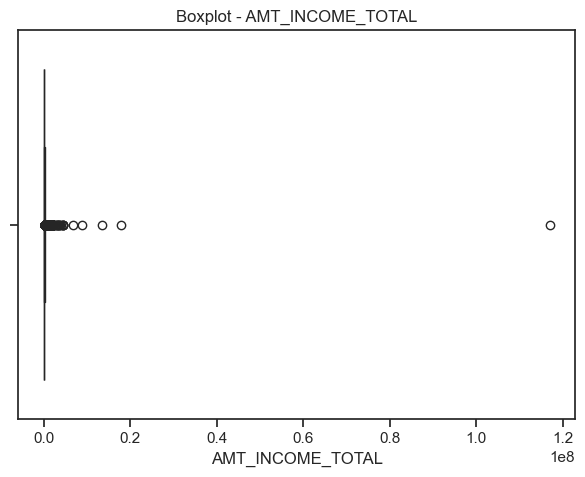

In [22]:
col = 'AMT_INCOME_TOTAL'
sns.boxplot(data_clean[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

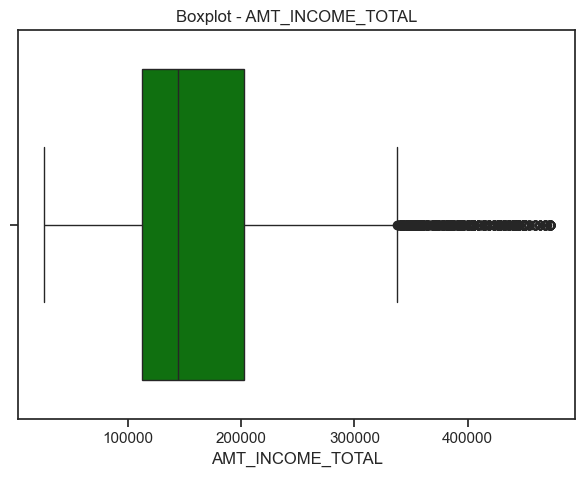

In [23]:
threshold = data_clean['AMT_INCOME_TOTAL'].quantile(0.99)
data_under_quantile = data_clean[data_clean_outliers['AMT_INCOME_TOTAL'] <= threshold]

col = 'AMT_INCOME_TOTAL'
sns.boxplot(data_under_quantile[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

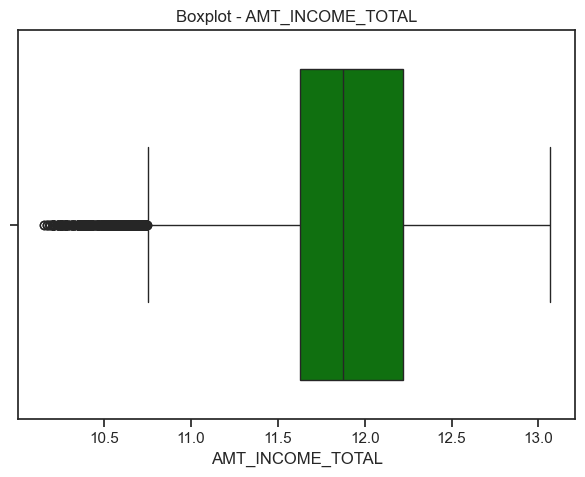

In [24]:
col = 'AMT_INCOME_TOTAL'
sns.boxplot(np.log1p(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

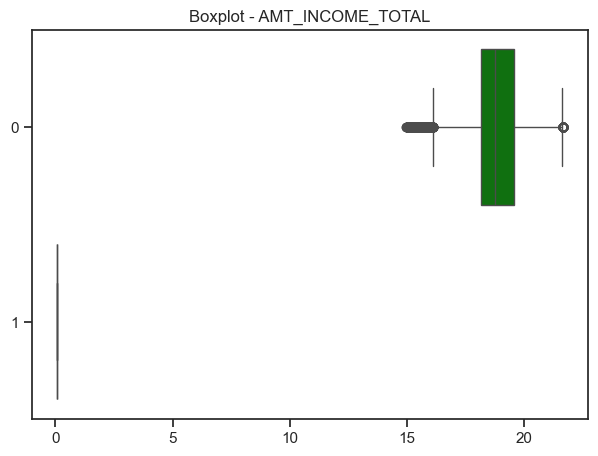

In [25]:
col = 'AMT_INCOME_TOTAL'
sns.boxplot(boxcox(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

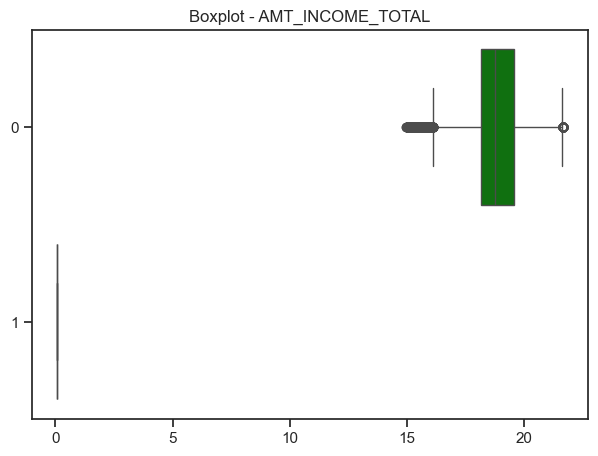

In [26]:
col = 'AMT_INCOME_TOTAL'
sns.boxplot(yeojohnson(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [27]:
def handling_outliers(data):
    data = data.copy()
    # Drop Outliers
    threshold = data['AMT_INCOME_TOTAL'].quantile(0.99)
    data = data[data['AMT_INCOME_TOTAL'] <= threshold]
    # Feature Transform
    data['AMT_INCOME_TOTAL_LOG'] = np.log1p(data['AMT_INCOME_TOTAL'])
    return data

data_clean_outliers = handling_outliers(data_clean)

We handling outliers by removing the data **above percentile 99%** because the amount of income total is too high and we considering this is outliers. To handling the skewness, we try to use log transform, boxcox, and yeo johnson and the result show that **log transform** is more normal distributed than the others.

### AMT_CREDIT

In [28]:
data_clean['AMT_CREDIT'].describe()

count    3.075110e+05
mean     5.990260e+05
std      4.024908e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.135310e+05
75%      8.086500e+05
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64

In [29]:
# Adjusting the quantile value
q95 = data_clean['AMT_CREDIT'].quantile(0.95)

# Showing the result
data_above_quantile = data_clean[data_clean['AMT_CREDIT'] > q95]

data_above_quantile.sort_values(by='AMT_CREDIT', ascending=False)



,SK_ID_CURR,TARGET,CODE_GENDER,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
287732,433294,0,F,405000.0,4050000.0,102514.5,Commercial associate,Higher education,Married,House / apartment,0.035792,-11355,-426,-43.0,-1058,1,1,1,1,0,0,Accountants,3.0,2,17,0,0,0,0,0,0,Business Entity Type 3,0.443685,0.592158,0.535276,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,3.0,0.0,-2.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
14852,117337,0,M,760846.5,4050000.0,146002.5,Commercial associate,Higher education,Married,Office apartment,0.072508,-12796,-1372,-3556.0,-4646,1,1,1,1,1,0,Managers,3.0,1,14,0,0,0,0,0,0,Trade: type 7,0.246776,0.639547,0.805020,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0,-858.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
288455,434170,0,F,450000.0,4050000.0,106839.0,Commercial associate,Higher education,Civil marriage,House / apartment,0.035792,-16609,-3044,-126.0,-134,1,1,1,1,0,0,Managers,3.0,2,11,0,0,0,0,0,0,Business Entity Type 3,0.781929,0.685893,0.758393,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,1.0,0.0,-1.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
110459,228135,0,M,864900.0,4050000.0,102384.0,Commercial associate,Higher education,Married,House / apartment,0.025164,-14940,-632,-1272.0,-1265,1,1,1,1,1,0,Managers,4.0,2,8,0,0,0,0,0,0,Business Entity Type 3,0.335628,0.280597,0.786267,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,3.0,1.0,-4.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,4.0,0.0,0.0
120757,240007,0,M,587250.0,4050000.0,106969.5,Commercial associate,Higher education,Married,House / apartment,0.046220,-19893,-421,-10025.0,-3307,1,1,1,1,1,0,Laborers,2.0,1,20,0,1,1,0,1,1,Industry: type 1,0.000000,0.663432,0.535276,0.2454,0.0315,0.9861,0.1724,0.1791,0.0,0.0,0.0,-1.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213648,347566,0,M,247500.0,1350189.0,39609.0,Working,Secondary / secondary special,Married,Municipal apartment,0.011657,-10096,-747,-9933.0,-2783,1,1,0,1,1,0,Low-skill Laborers,2.0,1,14,0,0,0,0,1,1,Business Entity Type 3,0.000000,0.332162,0.535276,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
175323,303170,0,F,157500.0,1350189.0,43555.5,Pensioner,Secondary / secondary special,Married,House / apartment,0.018850,-22556,365243,-5115.0,-1853,1,0,0,1,0,0,Laborers,2.0,2,13,0,0,0,0,0,0,Business Entity Type 3,0.000000,0.565585,0.706205,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,7.0,0.0,-904.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0

If we look at the client's data (AMT_INCOME_TOTAL, AMT_ANNUITY, education type, occupation_type, etc) with the highest AMT_CREDIT, we can assume this data is normal because their profession are accountant and manager with last education "Higher Education". So, we will not drop this outliers and will handling with log transform instead. 

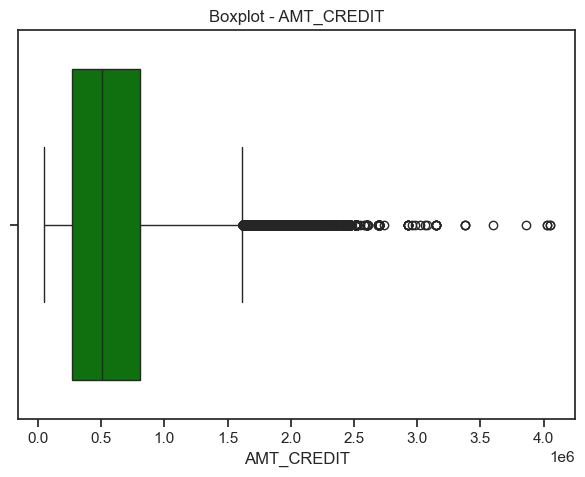

In [30]:
col = 'AMT_CREDIT'
sns.boxplot(data_under_quantile[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

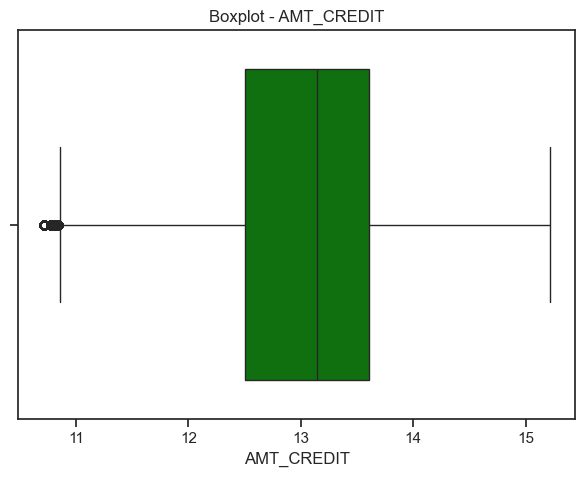

In [31]:
col = 'AMT_CREDIT'
sns.boxplot(np.log1p(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [32]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['AMT_CREDIT_LOG'] = np.log1p(data['AMT_CREDIT'])
    return data

data_clean_outliers = handling_outliers(data_clean_outliers)

### AMT_ANNUITY

In [33]:
data_clean['AMT_ANNUITY'].describe()

count    307511.000000
mean      27108.487841
std       14493.461065
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [34]:
# Adjusting the quantile value
q95 = data_clean['AMT_ANNUITY'].quantile(0.95)

# Showing the result
data_above_quantile = data_clean[data_clean['AMT_ANNUITY'] > q95]

data_above_quantile.sort_values(by='AMT_ANNUITY', ascending=False)



,SK_ID_CURR,TARGET,CODE_GENDER,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
17948,120926,0,M,783000.0,4050000.0,258025.5,Commercial associate,Higher education,Married,House / apartment,0.009549,-15176,-201,-1529.0,-4722,1,1,1,1,0,1,Managers,4.0,2,14,1,1,0,1,1,1,Industry: type 4,0.755408,0.706927,0.553165,0.0464,0.0594,0.9851,0.1034,0.0251,0.0116,0.0,0.0,-5.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
101508,217854,0,F,1575000.0,2303460.0,230161.5,Commercial associate,Higher education,Married,House / apartment,0.002506,-20273,-2334,-2352.0,-3816,1,1,0,1,0,0,Laborers,2.0,2,0,0,0,0,0,0,0,Other,0.000000,0.638760,0.746300,0.0918,0.0000,0.9776,0.2069,0.0000,0.0078,0.0,0.0,-4.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
104938,221773,0,M,900000.0,2250000.0,225000.0,Commercial associate,Higher education,Single / not married,House / apartment,0.032561,-10496,-2495,-4783.0,-3130,1,1,0,1,1,0,Managers,1.0,1,17,0,0,0,0,0,0,Construction,0.265959,0.744595,0.810618,0.1485,0.0000,0.9811,0.0690,0.0199,0.0000,0.0,0.0,-202.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0
145673,268905,0,M,2250000.0,2250000.0,225000.0,Commercial associate,Higher education,Married,House / apartment,0.072508,-14347,-5542,-8423.0,-4984,1,1,0,1,0,0,Managers,2.0,1,12,0,0,0,0,0,0,Business Entity Type 3,0.739337,0.789567,0.535276,0.0990,0.0573,0.9762,0.0690,0.0659,0.0152,0.0,0.0,-3.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
157614,282697,0,M,1125000.0,2250000.0,225000.0,Commercial associate,Higher education,Single / not married,House / apartment,0.010006,-16352,-5523,-3668.0,-4075,1,1,0,1,1,0,Laborers,3.0,1,15,0,0,0,0,0,0,Bank,0.460076,0.594216,0.786267,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,-309.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163811,289893,0,F,180000.0,675000.0,53329.5,Working,Higher education,Married,House / apartment,0.018850,-13581,-270,-4455.0,-2344,1,1,0,1,1,0,Accountants,2.0,2,13,0,0,0,0,0,0,Business Entity Type 3,0.523576,0.708316,0.537070,0.0990,0.0273,0.9925,0.0345,0.0504,0.0000,0.0,0.0,-1056.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
273133,416610,0,F,225000.0,675000.0,53329.5,Working,Higher education,Married,House / apartment,0.018801,-16032,-2566,-2318.0,-2321,1,1,1,1,0,0,Accountants,2.0,2,7,0,0,0,0,1,1,Construction,0.646629,0.497318,0.185202,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.0,0.0,-806.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0

Same with AMT_CREDIT, we do not find any suspicious data and will handling outliers using feature transformation

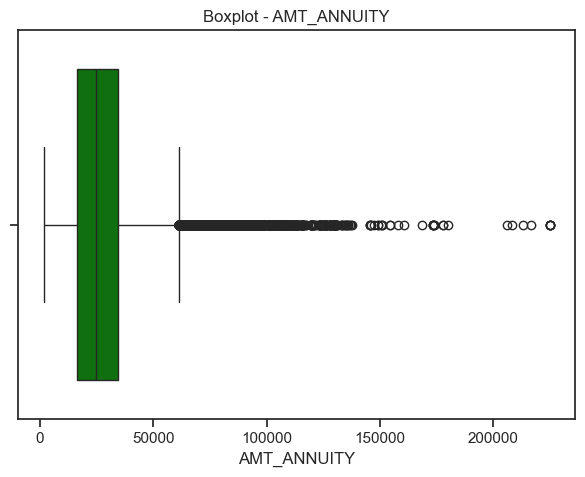

In [35]:
col = 'AMT_ANNUITY'
sns.boxplot(data_under_quantile[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

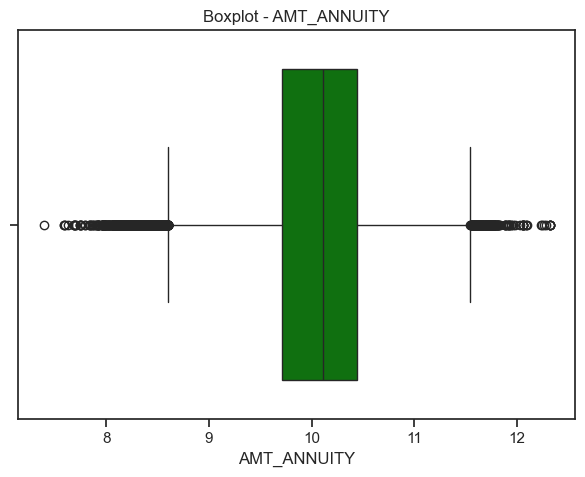

In [36]:
col = 'AMT_ANNUITY'
sns.boxplot(np.log1p(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [37]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['AMT_ANNUITY_LOG'] = np.log1p(data['AMT_ANNUITY'])
    return data

data_clean_outliers = handling_outliers(data_clean_outliers)

In context annuity, the variety of high value still acceptable for business because there might be some client has high loans and some of them not. 

### REGION_POPULATION_RELATIVE

In [38]:
data_clean['REGION_POPULATION_RELATIVE'].describe()

count    307511.000000
mean          0.020868
std           0.013831
min           0.000290
25%           0.010006
50%           0.018850
75%           0.028663
max           0.072508
Name: REGION_POPULATION_RELATIVE, dtype: float64

REGION_POPULATION_RELATIVE's values still acceptable and has no issues. By average, clients lives in Rural areas and some of them lives in Urban areas with high population.

### DAYS_EMPLOYED

In [39]:
data_clean['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [40]:
days_employe = data_clean['DAYS_EMPLOYED'] / 365
days_employe.describe()

count    307511.000000
mean        174.835742
std         387.056895
min         -49.073973
25%          -7.561644
50%          -3.323288
75%          -0.791781
max        1000.665753
Name: DAYS_EMPLOYED, dtype: float64

There is anomaly because the maximum value shows that client's had work over 1.000 years

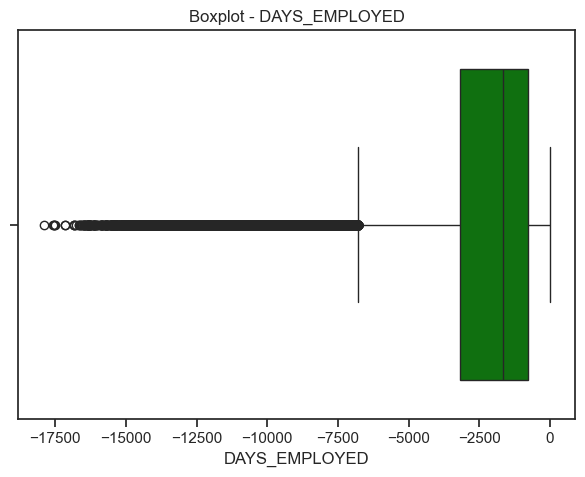

In [41]:
threshold = data_clean['DAYS_EMPLOYED'].quantile(0.81993)
data_under_quantile = data_clean[data_clean['DAYS_EMPLOYED'] <= threshold]

col = 'DAYS_EMPLOYED'
sns.boxplot(data_under_quantile[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

We will drop the anomaly that has values of 365.243 days or 1.000 years working


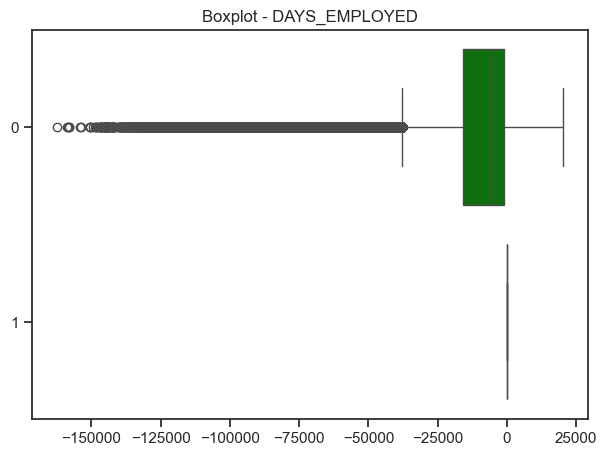

In [42]:
threshold = data_clean_outliers['DAYS_EMPLOYED'].quantile(0.81993)
data_clean_outliers = data_clean_outliers[data_clean_outliers['DAYS_EMPLOYED'] <= threshold]

col = 'DAYS_EMPLOYED'
sns.boxplot(yeojohnson(data_clean_outliers[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [43]:
def handling_outliers(data):
    data = data.copy()
    threshold = data['DAYS_EMPLOYED'].quantile(0.81993)
    data = data[data['DAYS_EMPLOYED'] <= threshold]
    # Feature Transform
    data['DAYS_EMPLOYED_YEOJOHNSON'] = yeojohnson(data['DAYS_EMPLOYED'])[0]
    return data

data_clean_outliers = handling_outliers(data_clean_outliers)

### DAYS_REGISTRATION

In [44]:
data_clean['DAYS_REGISTRATION'].describe()

count    307511.000000
mean      -4986.120328
std        3522.886321
min      -24672.000000
25%       -7479.500000
50%       -4504.000000
75%       -2010.000000
max           0.000000
Name: DAYS_REGISTRATION, dtype: float64

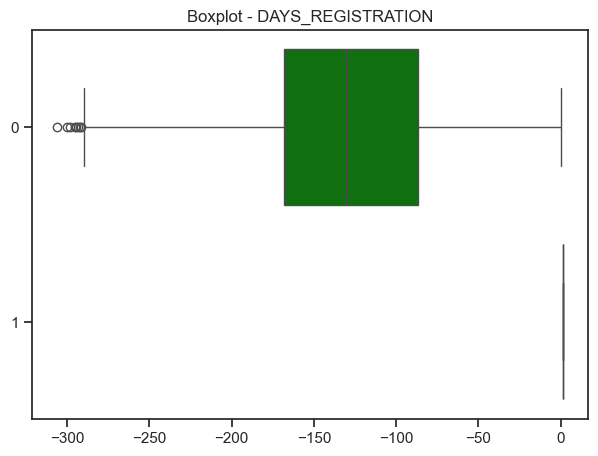

In [45]:
col = 'DAYS_REGISTRATION'
sns.boxplot(yeojohnson(data_clean_outliers[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [46]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['DAYS_REGISTRATION_YEOJOHNSON'] = yeojohnson(data['DAYS_REGISTRATION'])[0]
    data.drop(columns=['DAYS_REGISTRATION'], inplace=True)
    return data

data_clean_outliers = handling_outliers(data_clean_outliers)

### CNT_FAM_MEMBERS

In [47]:
data_clean['CNT_FAM_MEMBERS'].describe()

count    307511.000000
mean          2.152664
std           0.910679
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          20.000000
Name: CNT_FAM_MEMBERS, dtype: float64

In [48]:
# Adjusting the quantile value
q99 = train['CNT_FAM_MEMBERS'].quantile(0.99)

# Showing the result
data_above_quantile = train[train['CNT_FAM_MEMBERS'] > q99]

data_above_quantile.sort_values(by='CNT_FAM_MEMBERS', ascending=False).tail(10)



,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
306297,454877,1,Revolving loans,F,N,Y,4,90000.0,202500.0,10125.0,202500.0,Unaccompanied,Working,Secondary / secondary special,Married,With parents,0.008474,-13271,-653,-12077.0,-46,NaN,1,1,0,1,0,0,Laborers,6.0,2,2,SATURDAY,11,0,0,0,0,0,0,School,NaN,0.447949,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-204.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9858,111472,0,Cash loans,F,N,Y,5,193500.0,441000.0,22644.0,441000.0,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,0.014520,-10838,-350,-990.0,-639,NaN,1,1,0,1,0,0,NaN,6.0,2,2,SATURDAY,10,0,0,0,0,1,1,School,0.257133,0.310045,0.167408,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-56.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,1.0
277963,422090,0,Cash loans,F,N,Y,4,157500.0,299772.0,19647.0,247500.0,Family,State servant,Secondary / secondary special,Married,House / apartment,0.008068,-12202,-1793,-372.0,-1036,NaN,1,1,0,1,0,0,Core staff,6.0,3,3,FRIDAY,8,0,0,0,0,0,0,Transport: type 2,0.347024,0.394911,0.403142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-747.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
278782,422966,0,Cash loans,M,Y,Y,4,301500.0,1156500.0,33943.5,1156500.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.008068,-14869,

If we look at other features such as number of children, clients' income, occupation type, we considering this is anomaly because there is too many children for a client who work as a waitress that has income around 100.000 USD. So, in this step we will drop the outliers.

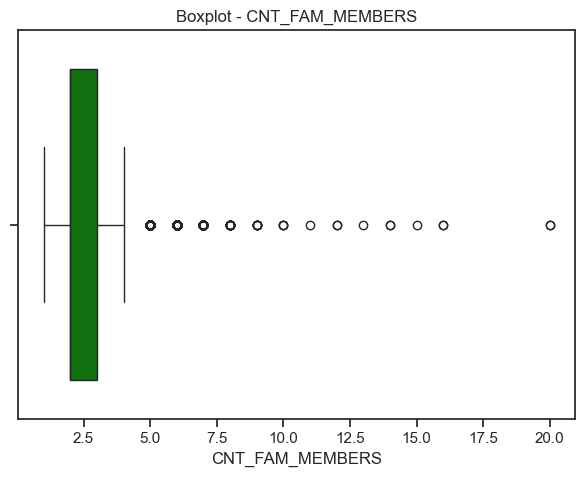

In [49]:
col = 'CNT_FAM_MEMBERS'
sns.boxplot((data_clean[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

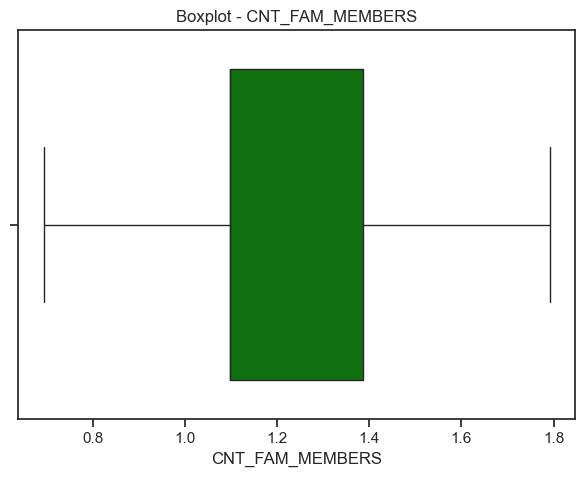

In [50]:
threshold = data_clean_outliers['CNT_FAM_MEMBERS'].quantile(0.99)
data_clean_outliers = data_clean_outliers[data_clean_outliers['CNT_FAM_MEMBERS'] <= threshold]

col = 'CNT_FAM_MEMBERS'
sns.boxplot(np.log1p(data_clean_outliers[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [51]:
def handling_outliers(data):
    data = data.copy()
    # Drop quantile 99%
    threshold = data['CNT_FAM_MEMBERS'].quantile(0.99)
    data = data[data['CNT_FAM_MEMBERS'] <= threshold]
    # Feature Transform
    data['CNT_FAM_MEMBERS_LOG'] = np.log1p(data['CNT_FAM_MEMBERS'])
    data.drop(columns=['CNT_FAM_MEMBERS'], inplace=True)
    return data

data_clean_outliers = handling_outliers(data_clean_outliers)

### REGION_RATING_CLIENT_W_CITY

In [52]:
data_clean['REGION_RATING_CLIENT_W_CITY'].describe()

count    307511.000000
mean          2.031521
std           0.502737
min           1.000000
25%           2.000000
50%           2.000000
75%           2.000000
max           3.000000
Name: REGION_RATING_CLIENT_W_CITY, dtype: float64

There is no anomaly in REGION_RATING_CLIENT_W_CITY

### HOUR_APPR_PROCESS_START

In [53]:
data_clean['HOUR_APPR_PROCESS_START'].describe()

count    307511.000000
mean         12.063419
std           3.265832
min           0.000000
25%          10.000000
50%          12.000000
75%          14.000000
max          23.000000
Name: HOUR_APPR_PROCESS_START, dtype: float64

This is categorical features that explain at what hour did the client apply the loan. So, 23 is not anomaly but it explain that client apply for loan around 23.00 O'clock.

### EXT_SOURCE_3

In [54]:
data_clean['EXT_SOURCE_3'].describe()

count    307511.000000
mean          0.515695
std           0.174736
min           0.000527
25%           0.417100
50%           0.535276
75%           0.636376
max           0.896010
Name: EXT_SOURCE_3, dtype: float64

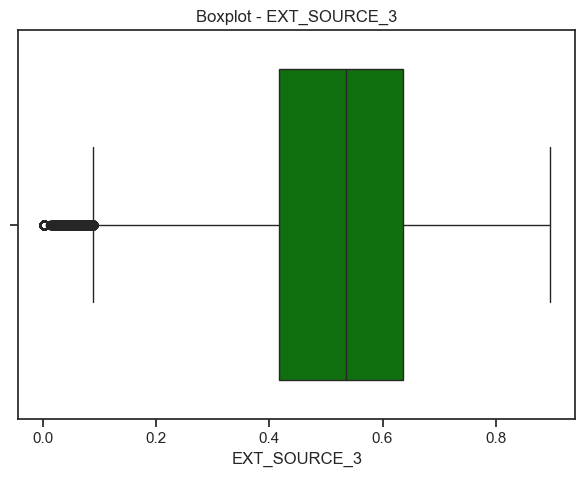

In [55]:
col = 'EXT_SOURCE_3'
sns.boxplot((data_clean[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

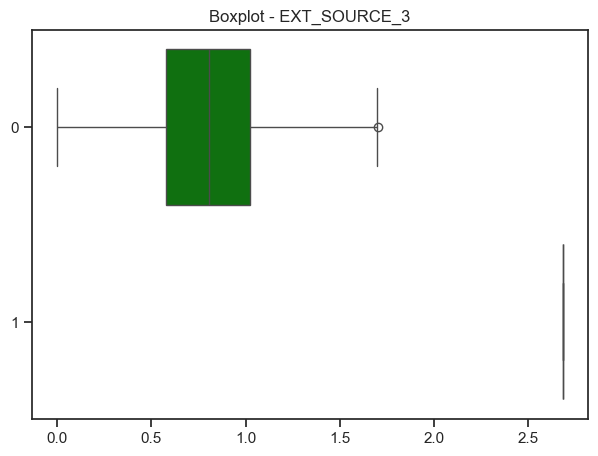

In [56]:
col = 'EXT_SOURCE_3'
sns.boxplot(yeojohnson(data_clean[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [57]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['EXT_SOURCE_3_YEOJOHNSON'] = yeojohnson(data['EXT_SOURCE_3'])[0]
    return data

data_clean_outliers = handling_outliers(data_clean_outliers)

### OBS_60_CNT_SOCIAL_CIRCLE

In [58]:
data_clean['OBS_60_CNT_SOCIAL_CIRCLE'].describe()

count    307511.000000
mean          1.400626
std           2.377224
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         344.000000
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: float64

We believe this data is not an anomaly, as there could be an individual with approximately 300 people in their social circle who are late on payments for over 60 days.

### DEF_60_CNT_SOCIAL_CIRCLE

In [59]:
data_clean['DEF_60_CNT_SOCIAL_CIRCLE'].describe()

count    307511.000000
mean          0.099717
std           0.361735
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          24.000000
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: float64

We believe this data is not an anomaly, as there could be an individual with approximately 24 people in their social circle who are default for over 60 days.

### DAYS_LAST_PHONE_CHANGE

In [60]:
data_clean['DAYS_LAST_PHONE_CHANGE'].describe()

count    307511.000000
mean       -962.858119
std         826.807226
min       -4292.000000
25%       -1570.000000
50%        -757.000000
75%        -274.000000
max           0.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [61]:
year_last_phone = data_clean['DAYS_LAST_PHONE_CHANGE']/ 365
year_last_phone.describe()

count    307511.000000
mean         -2.637967
std           2.265225
min         -11.758904
25%          -4.301370
50%          -2.073973
75%          -0.750685
max           0.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

We believe there is no anomaly in this data

## Feature Encoding

In [62]:
data_clean_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 303976 entries, 0 to 307510
Data columns (total 75 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    303976 non-null  int64  
 1   TARGET                        303976 non-null  int64  
 2   CODE_GENDER                   303976 non-null  object 
 3   AMT_INCOME_TOTAL              303976 non-null  float64
 4   AMT_CREDIT                    303976 non-null  float64
 5   AMT_ANNUITY                   303976 non-null  float64
 6   NAME_INCOME_TYPE              303976 non-null  object 
 7   NAME_EDUCATION_TYPE           303976 non-null  object 
 8   NAME_FAMILY_STATUS            303976 non-null  object 
 9   NAME_HOUSING_TYPE             303976 non-null  object 
 10  REGION_POPULATION_RELATIVE    303976 non-null  float64
 11  DAYS_BIRTH                    303976 non-null  int64  
 12  DAYS_EMPLOYED                 303976 non-null  in

In [63]:
data_encoded = data_clean_outliers.copy()

In [64]:
data_encoded.select_dtypes(['object']).columns.to_list()

['CODE_GENDER',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'ORGANIZATION_TYPE']

### CODE_GENDER

In [65]:
data_encoded['CODE_GENDER'].value_counts()

CODE_GENDER
F    200800
M    103176
Name: count, dtype: int64

We will do label encoding for this feature because simplicity, efficiency and not increasing dimensionality.

In [66]:
data_encoded['CODE_GENDER'] = data_encoded['CODE_GENDER'].map({'F': 0, 'M': 1})

### NAME_INCOME_TYPE

In [67]:
data_encoded['NAME_INCOME_TYPE'].value_counts()

NAME_INCOME_TYPE
Working                 157473
Commercial associate     69867
Pensioner                55157
State servant            21430
Unemployed                  22
Student                     17
Maternity leave              5
Businessman                  5
Name: count, dtype: int64

We will use one hot encoding but aggregating first into:
- Employed: such as Working, Commercial associate, and State servant
- Unemployed: Unemployed, Student, Maternity leave, and Businessman
- Retired: Pensioner

In [68]:
data_encoded['NAME_INCOME_TYPE'] = data_encoded['NAME_INCOME_TYPE'].map({'Working': 'Employed',
                                                                       'Commercial associate': 'Employed',
                                                                       'State servant': 'Employed',
                                                                       'Unemployed': 'Unemployed',
                                                                       'Student': 'Unemployed',
                                                                       'Maternity leave': 'Unemployed',
                                                                       'Businessman': 'Unemployed',
                                                                       'Pensioner': 'Retired',})

data_encoded = pd.get_dummies(data_encoded, columns=['NAME_INCOME_TYPE'], prefix='NAME_INCOME_TYPE')


### NAME_EDUCATION_TYPE

In [69]:
data_encoded['NAME_EDUCATION_TYPE'].value_counts()

NAME_EDUCATION_TYPE
Secondary / secondary special    217084
Higher education                  72811
Incomplete higher                 10133
Lower secondary                    3793
Academic degree                     155
Name: count, dtype: int64

We will use label encoding for this data because data in NAME_EDUCATION_TYPE is an ordinal.

In [70]:
data_encoded['NAME_EDUCATION_TYPE'] = data_encoded['NAME_EDUCATION_TYPE'].map({'Lower secondary': 0, #Sekolah Menengah Pertama
                                                                   'Secondary / secondary special': 1, #Sekolah Menengah Atas
                                                                   'Incomplete higher': 2, # Pendidikan Tinggi yang belum selesai
                                                                   'Higher education': 3, # Pendidikan Tinggi
                                                                   'Academic degree': 4}) # Gelar Akademik 

### NAME_FAMILY_STATUS

In [71]:
data_encoded['NAME_FAMILY_STATUS'].value_counts()

NAME_FAMILY_STATUS
Married                 193903
Single / not married     45005
Civil marriage           29485
Separated                19561
Widow                    16022
Name: count, dtype: int64

We will one hot encoding by aggregating first into:
- Married: such as Married and Civil marriage 
- Previously Married: Separated and Widow
: Single: Single / not married

In [72]:
data_encoded['NAME_FAMILY_STATUS'] = data_encoded['NAME_FAMILY_STATUS'].map({'Married': 'Married',
                                                                             'Civil marriage': 'Married',
                                                                             'Single / not married': 'Single',
                                                                             'Separated': 'Previously Married',
                                                                             'Widow': 'Previously Married'}) 

data_encoded = pd.get_dummies(data_encoded, columns=['NAME_FAMILY_STATUS'], prefix='NAME_FAMILY_STATUS')

### NAME_HOUSING_TYPE

In [73]:
data_encoded['NAME_HOUSING_TYPE'].value_counts()

NAME_HOUSING_TYPE
House / apartment      269633
With parents            14737
Municipal apartment     11096
Rented apartment         4836
Office apartment         2562
Co-op apartment          1112
Name: count, dtype: int64

In [74]:
data_encoded['NAME_HOUSING_TYPE'] = data_encoded['NAME_HOUSING_TYPE'].map({'House / apartment': 'Owned Housing',
                                                                           'Co-op apartment': 'Owned Housing',
                                                                           'With parents': 'Living with Family',
                                                                           'Municipal apartment': 'Rented/Temporary Housing',
                                                                           'Rented apartment': 'Rented/Temporary Housing',
                                                                           'Office apartment': 'Rented/Temporary Housing'})

data_encoded = pd.get_dummies(data_encoded, columns=['NAME_HOUSING_TYPE'], prefix='HOUSING_TYPE')

### OCCUPATION_TYPE

In [75]:
data_encoded['OCCUPATION_TYPE'].value_counts()

OCCUPATION_TYPE
Laborers                 150508
Sales staff               31925
Core staff                27235
Managers                  20043
Drivers                   18469
High skill tech staff     11259
Accountants                9633
Medicine staff             8495
Security staff             6692
Cooking staff              5933
Cleaning staff             4625
Private service staff      2627
Low-skill Laborers         2086
Waiters/barmen staff       1343
Secretaries                1295
Realty agents               747
HR staff                    555
IT staff                    506
Name: count, dtype: int64

To reduce the categories in the OCCUPATION_TYPE column, we can aggregate them into broader groups based on similarities or industry sectors:

- Manual Labor: Combine Laborers, Low-skill Laborers, Drivers, Cleaning staff, and Cooking staff.
- Sales and Service: Combine Sales staff, Waiters/barmen staff, Private service staff, and Realty agents.
- Administrative and Core: Combine Core staff, Accountants, Secretaries, and HR staff.
- Technical and IT: Combine High skill tech staff and IT staff.
- Management: Keep Managers as it is.
- Healthcare and Security: Combine Medicine staff and Security staff.

In [76]:
data_encoded['OCCUPATION_TYPE'] = data_encoded['OCCUPATION_TYPE'].map({'Laborers': 'Manual Labor',
                                                                       'Low-skill Laborers': 'Manual Labor',
                                                                       'Drivers': 'Manual Labor',
                                                                       'Cleaning staff': 'Manual Labor',
                                                                       'Cooking staff': 'Manual Labor',
                                                                       'Sales staff': 'Sales and Service',
                                                                       'Waiters/barmen staff': 'Sales and Service',
                                                                       'Private service staff': 'Sales and Service',
                                                                       'Realty agents': 'Sales and Service',
                                                                       'Core staff': 'Administrative and Core',
                                                                       'Accountants': 'Administrative and Core',
                                                                       'Secretaries': 'Administrative and Core',
                                                                       'HR staff': 'Administrative and Core',
                                                                       'High skill tech staff': 'Technical and IT',
                                                                       'IT staff': 'Technical and IT',
                                                                       'Managers': 'Management',
                                                                       'Medicine staff': 'Healthcare and Security',
                                                                       'Security staff': 'Healthcare and Security'})

data_encoded = pd.get_dummies(data_encoded, columns=['OCCUPATION_TYPE'], prefix='OCCUPATION_TYPE')

### ORGANIZATION_TYPE

In [77]:
data_encoded['ORGANIZATION_TYPE'].value_counts()

ORGANIZATION_TYPE
Business Entity Type 3    121896
Self-employed              38059
Other                      16466
Medicine                   11108
Business Entity Type 2     10444
Government                 10314
School                      8822
Trade: type 7               7742
Kindergarten                6834
Construction                6619
Business Entity Type 1      5881
Transport: type 4           5335
Trade: type 3               3466
Industry: type 9            3303
Industry: type 3            3260
Security                    3223
Housing                     2934
Industry: type 11           2685
Military                    2560
Bank                        2437
Agriculture                 2425
Police                      2311
Transport: type 2           2187
Postal                      2146
Security Ministries         1932
Trade: type 2               1859
Restaurant                  1789
Services                    1553
University                  1306
Industry: type 7         

To reduce the categories in the ORGANIZATION_TYPE column, we can aggregate them into broader groups based on industry sectors or common characteristics:

- Business Entities: Combine Business Entity Type 1, Business Entity Type 2, and Business Entity Type 3.
- Self-Employed: Keep Self-employed as it is.
- Healthcare and Education: Combine Medicine, School, Kindergarten, and University.
- Government and Public Services: Combine Government, Security Ministries, Military, Police, and Postal.
- Trade and Commerce: Combine all Trade types.
- Construction and Industry: Combine all Industry types and Construction.
- Transport and Logistics: Combine all Transport types.
- Finance and Insurance: Combine Bank, Insurance, and Legal Services.
- Utilities and Telecom: Combine Electricity, Telecom, and Mobile.
- Others: Combine remaining categories like Other, Security, Housing, Services, Restaurant, Hotel, Emergency, Advertising, Realtor, Culture, Religion, Cleaning.

In [78]:
data_encoded['ORGANIZATION_TYPE'] = data_encoded['ORGANIZATION_TYPE'].map({
        'Business Entity Type 1': 'Business Entities',
        'Business Entity Type 2': 'Business Entities',
        'Business Entity Type 3': 'Business Entities',
        'Self-employed': 'Self-Employed',
        'Medicine': 'Healthcare and Education',
        'School': 'Healthcare and Education',
        'Kindergarten': 'Healthcare and Education',
        'University': 'Healthcare and Education',
        'Government': 'Government and Public Services',
        'Security Ministries': 'Government and Public Services',
        'Military': 'Government and Public Services',
        'Police': 'Government and Public Services',
        'Postal': 'Government and Public Services',
        'Trade: type 1': 'Trade and Commerce',
        'Trade: type 2': 'Trade and Commerce',
        'Trade: type 3': 'Trade and Commerce',
        'Trade: type 4': 'Trade and Commerce',
        'Trade: type 5': 'Trade and Commerce',
        'Trade: type 6': 'Trade and Commerce',
        'Trade: type 7': 'Trade and Commerce',
        'Construction': 'Construction and Industry',
        'Industry: type 1': 'Construction and Industry',
        'Industry: type 2': 'Construction and Industry',
        'Industry: type 3': 'Construction and Industry',
        'Industry: type 4': 'Construction and Industry',
        'Industry: type 5': 'Construction and Industry',
        'Industry: type 6': 'Construction and Industry',
        'Industry: type 7': 'Construction and Industry',
        'Industry: type 8': 'Construction and Industry',
        'Industry: type 9': 'Construction and Industry',
        'Industry: type 10': 'Construction and Industry',
        'Industry: type 11': 'Construction and Industry',
        'Industry: type 12': 'Construction and Industry',
        'Industry: type 13': 'Construction and Industry',
        'Transport: type 1': 'Transport and Logistics',
        'Transport: type 2': 'Transport and Logistics',
        'Transport: type 3': 'Transport and Logistics',
        'Transport: type 4': 'Transport and Logistics',
        'Bank': 'Finance and Insurance',
        'Insurance': 'Finance and Insurance',
        'Legal Services': 'Finance and Insurance',
        'Electricity': 'Utilities and Telecom',
        'Telecom': 'Utilities and Telecom',
        'Mobile': 'Utilities and Telecom',
        'Other': 'Others',
        'Security': 'Others',
        'Housing': 'Others',
        'Services': 'Others',
        'Restaurant': 'Others',
        'Hotel': 'Others',
        'Emergency': 'Others',
        'Advertising': 'Others',
        'Realtor': 'Others',
        'Culture': 'Others',
        'Religion': 'Others',
        'Cleaning': 'Others',
        'Agriculture': 'Others'
    })

In [79]:
data_encoded['ORGANIZATION_TYPE'].value_counts() / len(data_encoded['ORGANIZATION_TYPE'])*100

ORGANIZATION_TYPE
Business Entities                 45.471024
Self-Employed                     12.520396
Others                            10.335684
Healthcare and Education           9.234282
Construction and Industry          6.831789
Government and Public Services     6.337013
Trade and Commerce                 4.653986
Transport and Logistics            2.926876
Finance and Insurance              1.087915
Utilities and Telecom              0.601034
Name: count, dtype: float64

In [80]:
data_encoded['ORGANIZATION_TYPE'] = data_encoded['ORGANIZATION_TYPE'].map({'Business Entities': 'Business Entities',
                                                                           'Self-Employed': 'Self-Employed',
                                                                           'Healthcare and Education': 'Healthcare and Education',
                                                                           'Construction and Industry': 'Construction and Industry',
                                                                           'Government and Public Services': 'Government and Public Services',
                                                                           'Trade and Commerce': 'Others',
                                                                           'Transport and Logistics': 'Others',
                                                                           'Finance and Insurance': 'Others',
                                                                           'Utilities and Telecom': 'Others'})

data_encoded = pd.get_dummies(data_encoded, columns=['ORGANIZATION_TYPE'], prefix='ORGANIZATION_TYPE')

We considering to aggregate value under 5% into Others to prevent curse of dimenisoanilty.

## Feature Engineering

In [81]:
# Feature Engineering

def feat_engineering(data):
    # Ratio
    data['DEBT_TO_INCOME_RATIO'] = data['AMT_CREDIT'] / data['AMT_INCOME_TOTAL'] # To measure how much a client is able to pay from his/her total income
    data["ANNUITY_TO_INCOME"] = data["AMT_ANNUITY"] / data["AMT_INCOME_TOTAL"] # To measure the ratio of monthly installments to customer income
    
    # Age and Tenure
    data['AGE'] = round(-data['DAYS_BIRTH'] / 365).astype('int64')
    data['TENURE'] = round(-data['DAYS_EMPLOYED'] / 365).astype('int64') # Measuring how many years a client has worked

    # the completeness of document
    data['NUM_DOCUMENTS'] = data.filter(like='FLAG_DOCUMENT').sum(axis=1)

    # External Source Mean
    data['EXT_SOURCE_MEAN'] = data[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis = 1)

    # drop the columns
    data = data.drop(columns=['AMT_CREDIT', 
                              'AMT_INCOME_TOTAL', 
                              'AMT_ANNUITY', 
                              'DAYS_BIRTH', 
                              'DAYS_EMPLOYED', 
                              'EXT_SOURCE_3',
                              'FLAG_DOCUMENT_2', 
                              'FLAG_DOCUMENT_3',
                              'FLAG_DOCUMENT_4',
                              'FLAG_DOCUMENT_5',
                              'FLAG_DOCUMENT_6',
                              'FLAG_DOCUMENT_7',
                              'FLAG_DOCUMENT_8',
                              'FLAG_DOCUMENT_9',
                              'FLAG_DOCUMENT_10',
                              'FLAG_DOCUMENT_11',
                              'FLAG_DOCUMENT_12',
                              'FLAG_DOCUMENT_13',
                              'FLAG_DOCUMENT_14',
                              'FLAG_DOCUMENT_15',
                              'FLAG_DOCUMENT_16',
                              'FLAG_DOCUMENT_17',
                              'FLAG_DOCUMENT_18',
                              'FLAG_DOCUMENT_19',
                              'FLAG_DOCUMENT_20',
                              'FLAG_DOCUMENT_21'])
    
    return data

In [82]:
data_final = feat_engineering(data_encoded)

In [83]:
bool_columns = data_final.select_dtypes('bool').columns
#data_final[bool_columns].isna().any()
data_final[bool_columns] = data_final[bool_columns].fillna(False) # There is non-finite values (NA or inf)
data_final[bool_columns] = data_final[bool_columns].astype(int)

In [84]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 303976 entries, 0 to 307510
Data columns (total 71 columns):
 #   Column                                            Non-Null Count   Dtype  
---  ------                                            --------------   -----  
 0   SK_ID_CURR                                        303976 non-null  int64  
 1   TARGET                                            303976 non-null  int64  
 2   CODE_GENDER                                       303976 non-null  int64  
 3   NAME_EDUCATION_TYPE                               303976 non-null  int64  
 4   REGION_POPULATION_RELATIVE                        303976 non-null  float64
 5   DAYS_ID_PUBLISH                                   303976 non-null  int64  
 6   FLAG_MOBIL                                        303976 non-null  int64  
 7   FLAG_EMP_PHONE                                    303976 non-null  int64  
 8   FLAG_WORK_PHONE                                   303976 non-null  int64  
 9   FLAG_CONT

## Final Feature Selection

Dropping feature with small correlation which is not give a great impact to TARGET to reduce curse of dimensionality.

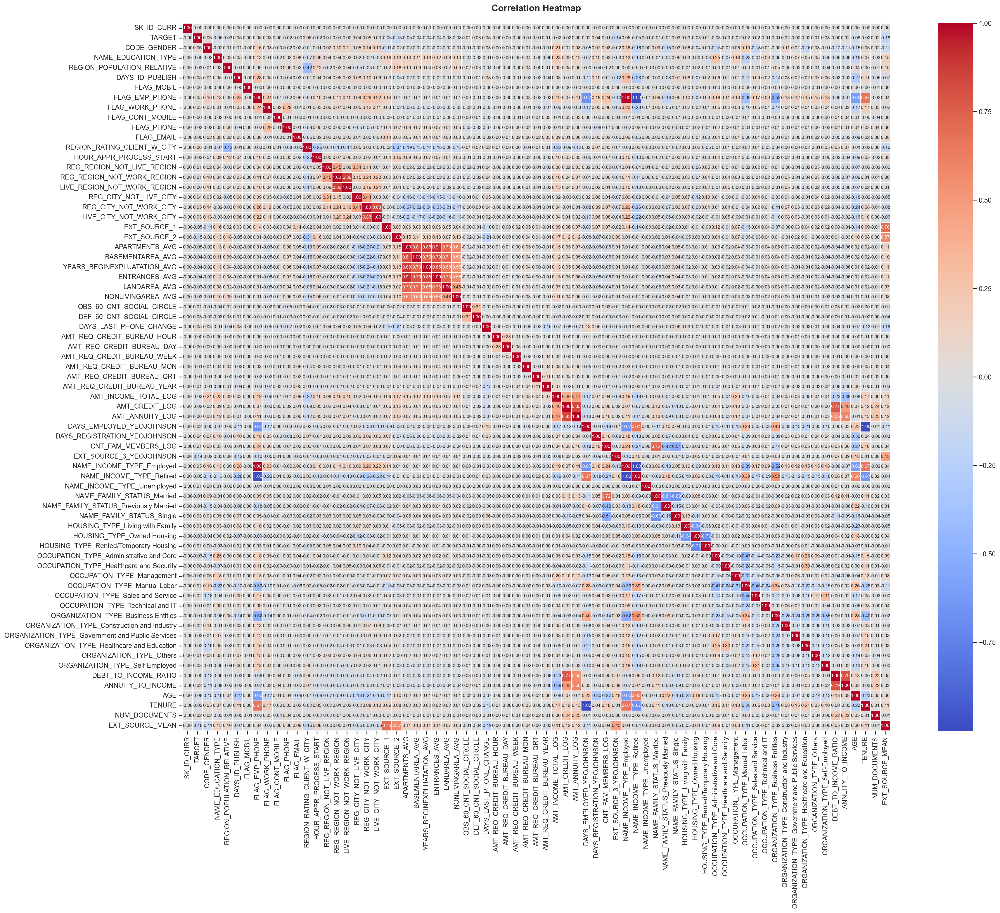


Pasangan fitur dengan korelasi tinggi (>0.7):
FLAG_EMP_PHONE - NAME_INCOME_TYPE_Employed: 1.00
FLAG_EMP_PHONE - NAME_INCOME_TYPE_Retired: -1.00
REG_REGION_NOT_WORK_REGION - LIVE_REGION_NOT_WORK_REGION: 0.86
REG_CITY_NOT_WORK_CITY - LIVE_CITY_NOT_WORK_CITY: 0.83
EXT_SOURCE_1 - EXT_SOURCE_MEAN: 0.70
APARTMENTS_AVG - BASEMENTAREA_AVG: 0.81
APARTMENTS_AVG - YEARS_BEGINEXPLUATATION_AVG: 0.88
APARTMENTS_AVG - ENTRANCES_AVG: 0.91
APARTMENTS_AVG - LANDAREA_AVG: 0.73
BASEMENTAREA_AVG - YEARS_BEGINEXPLUATATION_AVG: 0.73
BASEMENTAREA_AVG - ENTRANCES_AVG: 0.79
BASEMENTAREA_AVG - LANDAREA_AVG: 0.71
YEARS_BEGINEXPLUATATION_AVG - ENTRANCES_AVG: 0.85
ENTRANCES_AVG - LANDAREA_AVG: 0.73
AMT_CREDIT_LOG - AMT_ANNUITY_LOG: 0.83
AMT_CREDIT_LOG - DEBT_TO_INCOME_RATIO: 0.77
DAYS_EMPLOYED_YEOJOHNSON - TENURE: -1.00
CNT_FAM_MEMBERS_LOG - NAME_FAMILY_STATUS_Married: 0.72
NAME_INCOME_TYPE_Employed - NAME_INCOME_TYPE_Retired: -1.00
HOUSING_TYPE_Owned Housing - HOUSING_TYPE_Rented/Temporary Housing: -0.73
DEBT_TO_

In [85]:
%matplotlib inline

numerical_cols = data_final.select_dtypes(['float64', 'int64']).columns
plt.figure(figsize=(25, 20), dpi=200)
correlation_matrix = data_final[numerical_cols].corr(method='spearman')
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f', square=True, linewidths=0.5, annot_kws={'size': 7.5},
            xticklabels=correlation_matrix.columns, yticklabels=correlation_matrix.columns)
plt.title('Correlation Heatmap', pad = 20, fontweight='bold', fontsize = 15)
#plt.tight_layout()
plt.show()
plt.close()

threshold = 0.7
high_corr_features = np.where(np.abs(correlation_matrix) > threshold)
high_corr_features = [(correlation_matrix.index[x], correlation_matrix.columns[y], correlation_matrix.iloc[x,y]) 
                      for x, y in zip(*high_corr_features) if x != y and x < y]

print("\nPasangan fitur dengan korelasi tinggi (>0.7):")
for feat1, feat2, corr in high_corr_features:
    print(f"{feat1} - {feat2}: {corr:.2f}")

In [86]:
def feature_selection(data):
    data = data.copy()

    # Drop highly correlated features
    data = data.drop(columns=['NUM_DOCUMENTS', 'FLAG_EMP_PHONE', 'LIVE_REGION_NOT_WORK_REGION', 'LIVE_CITY_NOT_WORK_CITY', 
                              'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG',
                              'AMT_CREDIT_LOG', 'ENTRANCES_AVG', 'LANDAREA_AVG', 'DAYS_EMPLOYED_YEOJOHNSON', 
                              'NAME_FAMILY_STATUS_Married', 'HOUSING_TYPE_Rented/Temporary Housing'])
    
    # Reduce the number of features by dropping no correlation features
    data = data.drop(columns=['AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'])
                              
    return data

In [87]:
data_final = feature_selection(data_final)

## Export Data

In [88]:
# data_final.to_csv('application_train_final_v1.1.csv.gz', index=False, compression='gzip')

# Bureau Balance

## Data Preprocessing

In [89]:
bureau_balance = pd.read_csv(r'C:\Users\aldiv\Downloads\Data Analyst\Project based intern\Home Credit\Final Tasks\bureau_balance.csv')
bureau_balance.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [90]:
from autoviz import data_cleaning_suggestions
data_cleaning_suggestions(bureau_balance)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_BUREAU,int64,0.000000,2,5001709.000000,6842888.000000,No issue
MONTHS_BALANCE,int64,0.000000,0,-96.000000,0.000000,No issue
STATUS,object,0.000000,0,,,"5 rare categories: ['1', '5', '2', '3', '4']. Group them into a single category or drop the categories."


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_BUREAU,int64,0.0,2,5001709.0,6842888.0,No issue
MONTHS_BALANCE,int64,0.0,0,-96.0,0.0,No issue
STATUS,object,0.0,0,,,"5 rare categories: ['1', '5', '2', '3', '4']. Group them into a single category or drop the categories."


In [91]:
bureau_balance.duplicated().sum()

np.int64(0)

In [92]:
bureau_balance.describe(include='all')

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
count,2.729992e+07,2.729992e+07,27299925
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,13646993
mean,6.036297e+06,-3.074169e+01,NaN
std,4.923489e+05,2.386451e+01,NaN
min,5.001709e+06,-9.600000e+01,NaN
25%,5.730933e+06,-4.600000e+01,NaN
50%,6.070821e+06,-2.500000e+01,NaN
75%,6.431951e+06,-1.100000e+01,NaN


There is no missing values and duplicated data. Next step is checking the outliers wether should be handled or keep it.

## Handling Outliers

### Months Balance

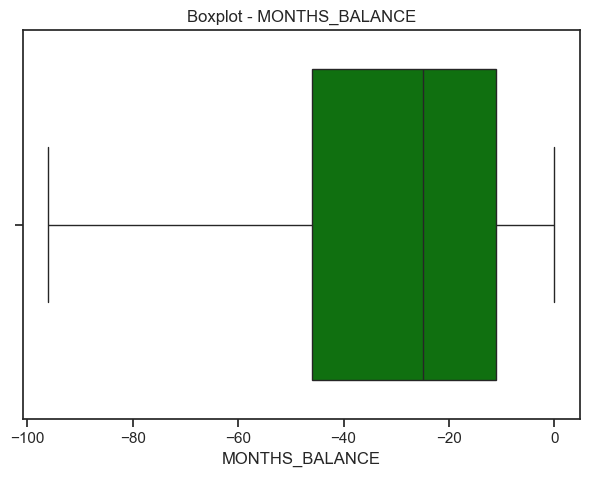

In [93]:
col = 'MONTHS_BALANCE'
sns.boxplot((bureau_balance[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

There is no issue in MONTHS_BALANCE feature.

In [94]:
bureau_balance['STATUS'].value_counts()

STATUS
C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: count, dtype: int64

"STATUS" means Status of Credit Bureau loan during the month where:
- C means closed
- X means status unknown
- 0 means no DPD
- 1 means maximal did during month between 1-30
- 2 means DPD 31-60
- 3 means DPD 61-90
- 4 means DPD 91-120
- 5 means DPD 120+ or sold or written off

The category from 0 to 5 means the loan still active but in different days past due (DPD) status. Since there are C and X the categorized are closed status and unknown, we will use one hot encoding because to avoiding misinterpretation where one value is better than others. But, we will rename the values.

In [95]:
def feature_encode(data):
    data = data.copy()
    # Label Encoding
    data = data.replace({'STATUS': {'C': 'Closed', 
                                    'X': 'Unknown', '0': 'No DPD', 
                                    '1': 'DPD 1-30', 
                                    '2': 'DPD 31-60', 
                                    '3': 'DPD 61-90', 
                                    '4': 'DPD 91-120', 
                                    '5': 'DPD 120+'}})
    # One-Hot Encoding
    data = pd.get_dummies(data, columns=['STATUS'], prefix='STATUS')
    return data

bureau_balance_encoded = feature_encode(bureau_balance)

In [96]:
bureau_balance_encoded.columns

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS_Closed', 'STATUS_DPD 1-30',
       'STATUS_DPD 120+', 'STATUS_DPD 31-60', 'STATUS_DPD 61-90',
       'STATUS_DPD 91-120', 'STATUS_No DPD', 'STATUS_Unknown'],
      dtype='object')

# Bureau

## Data Preprocessing

In [97]:
bureau = pd.read_csv(r'C:\Users\aldiv\Downloads\Data Analyst\Project based intern\Home Credit\Final Tasks\bureau.csv')

In [98]:
bureau.describe(include='all')

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1716428,1716428,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1716428,1.716428e+06,4.896370e+05
unique,NaN,NaN,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,NaN,NaN,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,NaN,NaN,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,2.782149e+05,5.924434e+06,NaN,NaN,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,NaN,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,NaN,NaN,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,NaN,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,NaN,NaN,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,NaN,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,NaN,NaN,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,NaN,NaN,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,NaN,NaN,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,NaN,-3.300000e+01,1.350000e+04


In [99]:
from autoviz import data_cleaning_suggestions
data_cleaning_suggestions(bureau)


    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_CURR,int64,0.000000,17,100001.000000,456255.000000,No issue
SK_ID_BUREAU,int64,0.000000,100,5000000.000000,6843457.000000,Possible ID column: drop before modeling step.
CREDIT_ACTIVE,object,0.000000,0,,,"2 rare categories: ['Sold', 'Bad debt']. Group them into a single category or drop the categories."
CREDIT_CURRENCY,object,0.000000,0,,,"3 rare categories: ['currency 2', 'currency 3', 'currency 4']. Group them into a single category or drop the categories."
DAYS_CREDIT,int64,0.000000,0,-2922.000000,0.000000,Column has a high correlation with ['DAYS_ENDDATE_FACT']. Consider dropping one of them.
CREDIT_DAY_OVERDUE,int64,0.000000,0,0.000000,2792.000000,Column has 4217 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
DAYS_CREDIT_ENDDATE,float64,6.149573,NA,-42060.000000,31199.000000,"105553 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 79340 outliers greater than upper bound (2892.00) or lower than lower bound(-3556.00). Cap them or remove them."
DAYS_ENDDATE_FACT,float64,36.916958,NA,-42023.000000,0.000000,"633653 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 1 outliers greater than upper bound (1171.00) or lower than lower bound(-3085.00). Cap them or remove them."
AMT_CREDIT_MAX_OVERDUE,float64,65.513264,NA,0.000000,115987185.000000,"1124488 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 121290 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them."
CNT_CREDIT_PROLONG,int64,0.000000,0,0.000000,9.000000,Column has 9114 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_CURR,int64,0.000000,17,100001.0,456255.0,No issue
SK_ID_BUREAU,int64,0.000000,100,5000000.0,6843457.0,Possible ID column: drop before modeling step.
CREDIT_ACTIVE,object,0.000000,0,,,"2 rare categories: ['Sold', 'Bad debt']. Group them into a single category or drop the categories."
CREDIT_CURRENCY,object,0.000000,0,,,"3 rare categories: ['currency 2', 'currency 3', 'currency 4']. Group them into a single category or drop the categories."
DAYS_CREDIT,int64,0.000000,0,-2922.0,0.0,Column has a high correlation with ['DAYS_ENDDATE_FACT']. Consider dropping one of them.
CREDIT_DAY_OVERDUE,int64,0.000000,0,0.0,2792.0,Column has 4217 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
DAYS_CREDIT_ENDDATE,float64,6.149573,NA,-42060.0,31199.0,"105553 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 79340 outliers greater than upper bound (2892.00) or lower than lower bound(-3556.00). Cap them or remove them."
DAYS_ENDDATE_FACT,float64,36.916958,NA,-42023.0,0.0,"633653 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 1 outliers greater than upper bound (1171.00) or lower than lower bound(-3085.00). Cap them or remove them."
AMT_CREDIT_MAX_OVERDUE,float64,65.513264,NA,0.0,115987185.0,"1124488 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 121290 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them."
CNT_CREDIT_PROLONG,int64,0.000000,0,0.0,9.0,Column has 9114 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


In [100]:
# List of common missing value strings
missing_values_set = [
    'NA', 'N/A', 'null', 'NaN','nan', 'XNA', 'None', 'empty', 'undefined', 'unknown', 'Unknown',
    '--', 'not available', '',' ','  ','   ', 'missing', 'unavailable', 'not applicable',
    'not found', 'no data', 'no value', 'n/a', 'none', 'null value', 'unknown value', 'blank', 'invalid', 'error',
    'unassigned', 'uninitialized', 'void', 'undisclosed', 'unreported', 'empty string',
    'na', 'not recorded', 'unanswered', 'not specified', 'unobserved', 'unpopulated',
    'none of the above', 'does not apply', 'ignored', 'unspecified', 'unfilled', 'inapplicable',
    'unavailable value', 'not entered', 'missing value', 'data not available', 'data missing',
    'not inputted', 'not given', 'unrecorded', 'unfurnished', 'undocumented', 'not listed',
    'unsupplied', 'empty field', 'unfilled field', 'unanswered question', 'no response',
    'not provided', 'not reported', 'unanswered', 'unacknowledged', 'no information',
    'no response recorded', 'no submission', 'no entry', 'not logged', 'unverified',
    'unobserved value', 'data absent', 'absence', 'unfilled cell', 'undefined data',
    'does not exist', 'not found', 'missing data', 'no answer', 'unavailable information',
    'no input', 'data error', 'unseen', 'unviewed', 'not selected', 'irrelevant',
    'skipped', 'no response given', 'no feedback', 'failed', 'discarded', 'no record',
    'unfetched', 'not completed', 'not finished', 'not updated', 'forgotten', 'rejected',
    'unsupplied data', 'data void', 'undetermined', 'not checked', 'not applicable here',
    'unattended', 'data missing', 'nonexistent', 'unsubscribed', 'denied', 'unaccepted',
    'unwitnessed', 'discarded entry', 'rejected data', 'unapplicable', 'non-populated',
    'unapplicable field', 'lost', 'absent data', 'no match', 'no result'
]

# Optimized function to replace missing-like values with NaN
def replace_missing_with_null(df, missing_values_set):
    # Select object type columns
    df_object_columns = df.select_dtypes(include=['object'])

    # Replace missing-like values with NaN
    for col in df_object_columns.columns:
        # Vectorized replacement of missing-like values with NaN
        df[col] = df[col].apply(lambda x: np.nan if str(x).strip() in missing_values_set else x)

    return df

bureau = replace_missing_with_null(bureau, missing_values_set)

In [101]:
# Function untuk mengecek persentase null value

def check_null_percentage(df):
    # Hitung total rows
    total_rows = len(df)

    # Hitung null values dan persentasenya
    null_counts = df.isnull().sum()
    null_percentage = (null_counts / total_rows * 100).round(2)

    # Buat dataframe hasil
    null_df = pd.DataFrame({
        'Total_Null': null_counts,
        'Null_Percentage': null_percentage
    })

    # Sorting berdasarkan persentase null terbesar
    null_df = null_df.sort_values('Null_Percentage', ascending=False)

    # Filter hanya kolom yang memiliki null values
    null_df = null_df[null_df['Total_Null'] > 0]

    return null_df

# # Check null value (data) after handling null value
null_analysis = check_null_percentage(bureau)
print("Total rows in dataset:", len(bureau))
print("\nNull Value Analysis:")
print(null_analysis)

Total rows in dataset: 1716428

Null Value Analysis:
                        Total_Null  Null_Percentage
AMT_ANNUITY               1226791        71.47     
AMT_CREDIT_MAX_OVERDUE    1124488        65.51     
DAYS_ENDDATE_FACT          633653        36.92     
AMT_CREDIT_SUM_LIMIT       591780        34.48     
AMT_CREDIT_SUM_DEBT        257669        15.01     
DAYS_CREDIT_ENDDATE        105553         6.15     
AMT_CREDIT_SUM                 13         0.00     


AMT_ANNUITY and AMT_CREDIT_MAX_OVERDUE seems have high null percentage and will considered to drop them while the other will be filled with median.

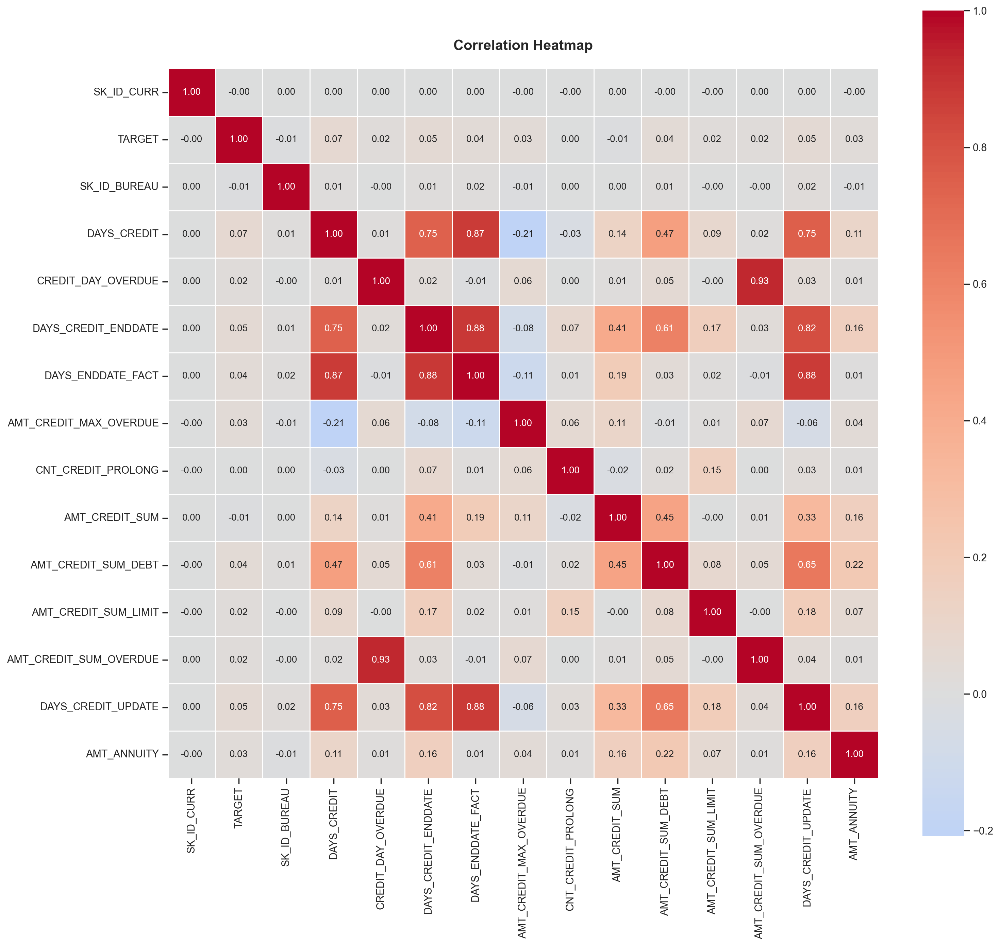


Pasangan fitur dengan korelasi tinggi (>0.7):
DAYS_CREDIT - DAYS_CREDIT_ENDDATE: 0.75
DAYS_CREDIT - DAYS_ENDDATE_FACT: 0.87
DAYS_CREDIT - DAYS_CREDIT_UPDATE: 0.75
CREDIT_DAY_OVERDUE - AMT_CREDIT_SUM_OVERDUE: 0.93
DAYS_CREDIT_ENDDATE - DAYS_ENDDATE_FACT: 0.88
DAYS_CREDIT_ENDDATE - DAYS_CREDIT_UPDATE: 0.82
DAYS_ENDDATE_FACT - DAYS_CREDIT_UPDATE: 0.88


In [102]:
%matplotlib inline
bureau_target = data_final[['SK_ID_CURR', 'TARGET']]
bureau_target = bureau_target.merge(bureau, on='SK_ID_CURR', how='left')

numerical_cols = bureau_target.select_dtypes(['float64', 'int64']).columns
plt.figure(figsize=(15, 15),dpi=200)
correlation_matrix = bureau_target[numerical_cols].corr(method='spearman')
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f', square=True, linewidths=0.5, annot_kws={'size': 10},
            xticklabels=correlation_matrix.columns, yticklabels=correlation_matrix.columns)
plt.title('Correlation Heatmap', pad = 20, fontweight='bold', fontsize = 15)
#plt.tight_layout()
plt.show()
plt.close()

threshold = 0.7
high_corr_features = np.where(np.abs(correlation_matrix) > threshold)
high_corr_features = [(correlation_matrix.index[x], correlation_matrix.columns[y], correlation_matrix.iloc[x,y]) 
                      for x, y in zip(*high_corr_features) if x != y and x < y]

print("\nPasangan fitur dengan korelasi tinggi (>0.7):")
for feat1, feat2, corr in high_corr_features:
    print(f"{feat1} - {feat2}: {corr:.2f}")

Some of features have a high correlation (correlation score > 0.7) between features and there is no correlation between feature with the target on application_train so we suggest to use all of the features.

In [103]:
from scipy.stats import chi2_contingency

def chi_square_test(df, feature, target='TARGET'):
    contingency_table = pd.crosstab(df[feature], df[target])
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    return feature, chi2, p_value, dof

categorical_features = bureau_target.select_dtypes(include=['object']).columns.tolist()
# categorical_features.remove('TARGET')

# Lakukan uji Chi-Square untuk setiap fitur kategorikal
results = []    
for feature in categorical_features:
    results.append(chi_square_test(bureau_target, feature))

# Buat DataFrame dari hasil dan urutkan berdasarkan p-value
results_df = pd.DataFrame(results, columns=['Feature', 'Chi-Square', 'p-value', 'DoF'])
results_df = results_df.sort_values('p-value')

# Tampilkan hasil
print("Chi-Square Test Results for Categorical Features vs TARGET:")
print(results_df.to_string(index=False))

Chi-Square Test Results for Categorical Features vs TARGET:
    Feature      Chi-Square  p-value  DoF
  CREDIT_ACTIVE 2641.242245 0.00000    3 
    CREDIT_TYPE 2981.762487 0.00000   13 
CREDIT_CURRENCY   13.773405 0.00323    3 


As for categorical features, they have p-value under 5%, meaning all of features have a correlation with the TARGET. But, CREDIT_CURRENCY has small chi-square score and will considering to drop it because has small impact to the TARGET and for reducing features.

In [104]:
bureau_select = bureau.drop(columns=['CREDIT_CURRENCY'])

## Handling Null value

In [105]:
def handling_na(data): 
    data = data.copy()

    # Handling missing value by drop the features
    data = data.drop(columns=['AMT_ANNUITY', 'AMT_CREDIT_MAX_OVERDUE'])

    # Handling missing value with median
    columns_fill_median = ['AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_DEBT', 
                           'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_SUM']
    data[columns_fill_median] = data[columns_fill_median].fillna(data[columns_fill_median].median())

    return data

bureau_clean = handling_na(bureau_select)

## Handlling Duplicated Data

In [106]:
bureau_clean.duplicated().sum()

np.int64(0)

There is no duplicated data

## Handling Outliers

In [107]:
bureau_transforms = bureau_clean.copy()

### CREDIT_DAY_OVERDUE

Number of days past due on CB credit at the time of application for related loan in application_train.

In [108]:
bureau_transforms['CREDIT_DAY_OVERDUE'].describe()

count    1.716428e+06
mean     8.181666e-01
std      3.654443e+01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.792000e+03
Name: CREDIT_DAY_OVERDUE, dtype: float64

In [109]:
credit_year_overdue = bureau_transforms['CREDIT_DAY_OVERDUE'] / 365
credit_year_overdue.describe()

count    1.716428e+06
mean     2.241552e-03
std      1.001217e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      7.649315e+00
Name: CREDIT_DAY_OVERDUE, dtype: float64

Looking at the days_overdue, some loan applicants have significant credit payment delays of up to 7 years, which is quite concerning from a credit risk perspective. No anomaly / issue found in this feature.

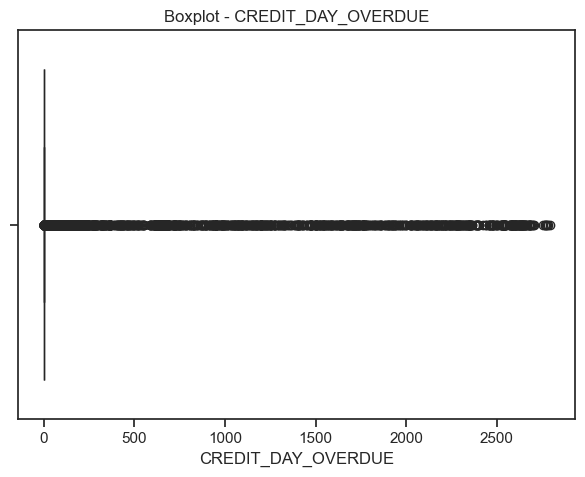

In [110]:
col = 'CREDIT_DAY_OVERDUE'
sns.boxplot((bureau_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

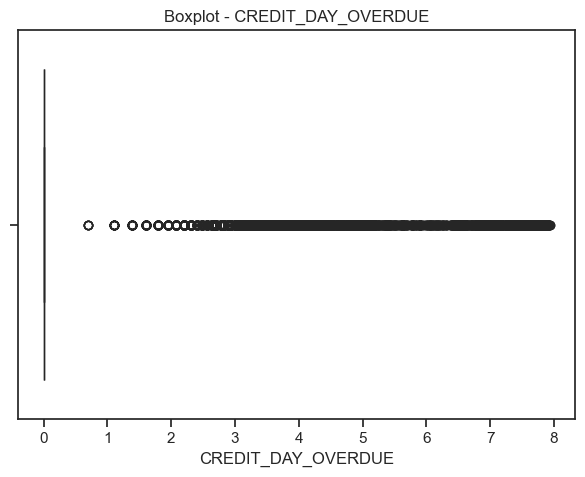

In [111]:
col = 'CREDIT_DAY_OVERDUE'
sns.boxplot(np.log1p(bureau_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

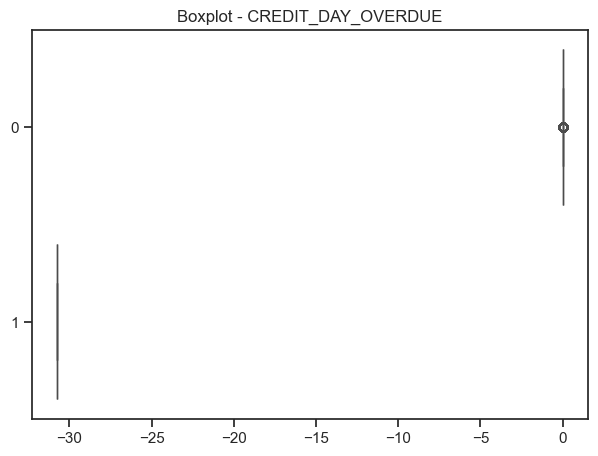

In [112]:
col = 'CREDIT_DAY_OVERDUE'
sns.boxplot(yeojohnson(bureau_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [113]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['CREDIT_DAY_OVERDUE_YEOJOHNSON'] = yeojohnson(data['CREDIT_DAY_OVERDUE'])[0]
    data.drop(columns=['CREDIT_DAY_OVERDUE'], inplace=True)
    return data

bureau_transforms = handling_outliers(bureau_transforms)

### DAYS_CREDIT_ENDDATE

In [114]:
bureau_transforms['DAYS_CREDIT_ENDDATE'].describe()

count    1.716428e+06
mean     4.588291e+02
std      4.842434e+03
min     -4.206000e+04
25%     -1.074000e+03
50%     -3.300000e+02
75%      3.890000e+02
max      3.119900e+04
Name: DAYS_CREDIT_ENDDATE, dtype: float64

In [115]:
year_credit_enddate = bureau_transforms['DAYS_CREDIT_ENDDATE'] / 365
year_credit_enddate.describe()

count    1.716428e+06
mean     1.257066e+00
std      1.326694e+01
min     -1.152329e+02
25%     -2.942466e+00
50%     -9.041096e-01
75%      1.065753e+00
max      8.547671e+01
Name: DAYS_CREDIT_ENDDATE, dtype: float64

In [116]:
print(f'The minimum remaining credit bureau (in years) :{year_credit_enddate.min()}')
print(f'The maximum remaining credit bureau (in years) :{year_credit_enddate.max()}')

print("""
note:
The negative values in DAYS_CREDIT_ENDDATE indicates that the credit bureau has not ended yet.
The positive values in DAYS_CREDIT_ENDDATE indicates that the credit bureau has ended.
      """)

The minimum remaining credit bureau (in years) :-115.23287671232876
The maximum remaining credit bureau (in years) :85.47671232876712

note:
The negative values in DAYS_CREDIT_ENDDATE indicates that the credit bureau has not ended yet.
The positive values in DAYS_CREDIT_ENDDATE indicates that the credit bureau has ended.
      


The minimum value of -115 years indicates that a person appears to have 115 years remaining to repay their loan, which seems like an anomaly due to the excessively long duration. Conversely, the maximum value of 85 years suggests that an individual's credit record ended 85 years ago. We considering that 85 years still acceptable since there are some people who lived more than 80 years.

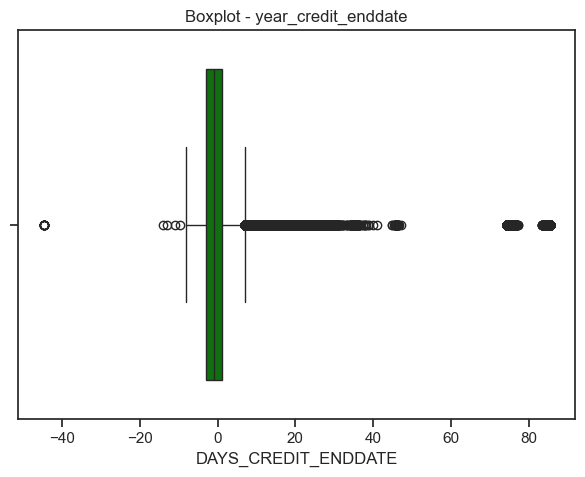

In [117]:
threshold = year_credit_enddate.quantile(0.000078)
data_under_quantile = year_credit_enddate[year_credit_enddate >= threshold]

col = 'year_credit_enddate'
sns.boxplot(data_under_quantile,color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

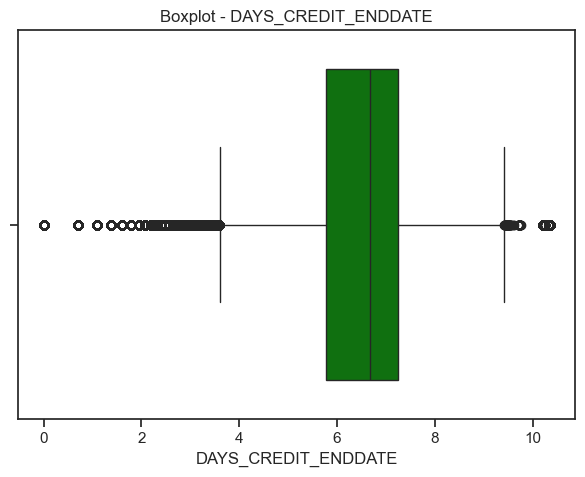

In [118]:
threshold = bureau_transforms['DAYS_CREDIT_ENDDATE'].quantile(0.000078)
data_under_quantile = bureau_transforms[bureau_transforms['DAYS_CREDIT_ENDDATE'] >= threshold]

col = 'DAYS_CREDIT_ENDDATE'
sns.boxplot(np.log1p(data_under_quantile['DAYS_CREDIT_ENDDATE']),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

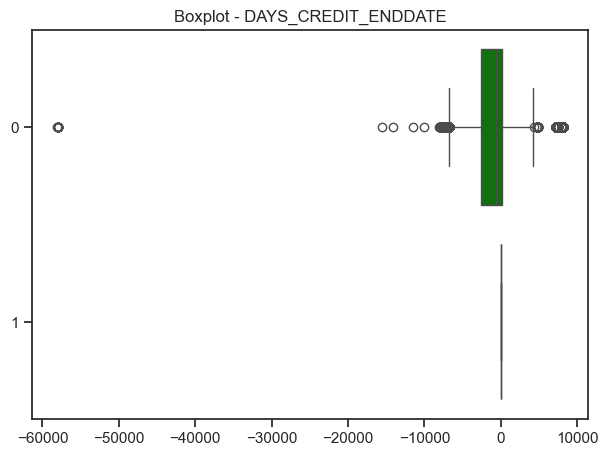

In [119]:
threshold = bureau_transforms['DAYS_CREDIT_ENDDATE'].quantile(0.000078)
data_under_quantile = bureau_transforms[bureau_transforms['DAYS_CREDIT_ENDDATE'] >= threshold]

col = 'DAYS_CREDIT_ENDDATE'
sns.boxplot(yeojohnson(data_under_quantile['DAYS_CREDIT_ENDDATE']),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [120]:
def handling_outliers(data):
    data = data.copy()
    # Drop Outliers
    threshold = data['DAYS_CREDIT_ENDDATE'].quantile(0.000078)
    data = data[data['DAYS_CREDIT_ENDDATE'] >= threshold]
    # Feature Transform
    data['DAYS_CREDIT_ENDDATE_LOG'] = np.log1p(data['DAYS_CREDIT_ENDDATE'])
    data.drop(columns=['DAYS_CREDIT_ENDDATE'], inplace=True)
    return data

bureau_transforms = handling_outliers(bureau_transforms)

Log transformation is better distributed so we choose to use this transform.

### DAYS_ENDDATE_FACT

Days since CB credit ended at the time of application in Home Credit (only for closed credit)

In [121]:
bureau_transforms['DAYS_ENDDATE_FACT'].describe()

count    1.716294e+06
mean    -9.729908e+02
std      5.700816e+02
min     -4.202300e+04
25%     -1.089000e+03
50%     -8.970000e+02
75%     -6.912500e+02
max      0.000000e+00
Name: DAYS_ENDDATE_FACT, dtype: float64

In [122]:
years_enddate_fact = bureau_transforms['DAYS_ENDDATE_FACT'] / 365
years_enddate_fact.describe()

count    1.716294e+06
mean    -2.665728e+00
std      1.561867e+00
min     -1.151315e+02
25%     -2.983562e+00
50%     -2.457534e+00
75%     -1.893836e+00
max      0.000000e+00
Name: DAYS_ENDDATE_FACT, dtype: float64

In [123]:
print(f'The minimum credit bureau end date (in years) :{years_enddate_fact.min()}')
print(f'The maximum credit bureau end date (in years) :{years_enddate_fact.max()}')

The minimum credit bureau end date (in years) :-115.13150684931507
The maximum credit bureau end date (in years) :0.0


The minimum credit bureau end date of -6.39 years suggests that a person's credit record ended 6 years ago, while the maximum value of -0.56 years indicates that the credit bureau has concluded within the last year. No anomaly founded in this feature.

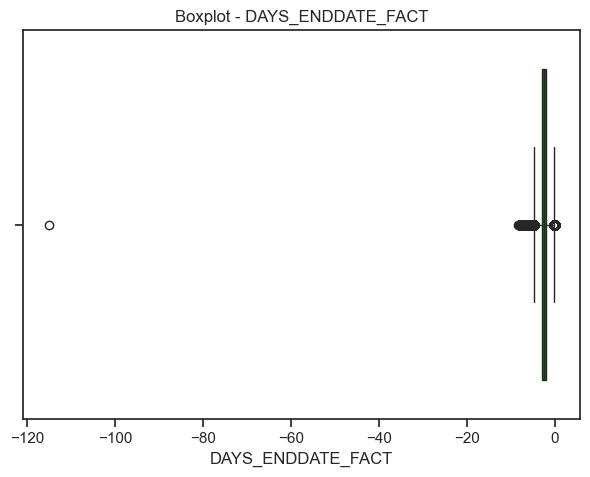

In [124]:
col = 'DAYS_ENDDATE_FACT'
sns.boxplot(years_enddate_fact,color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

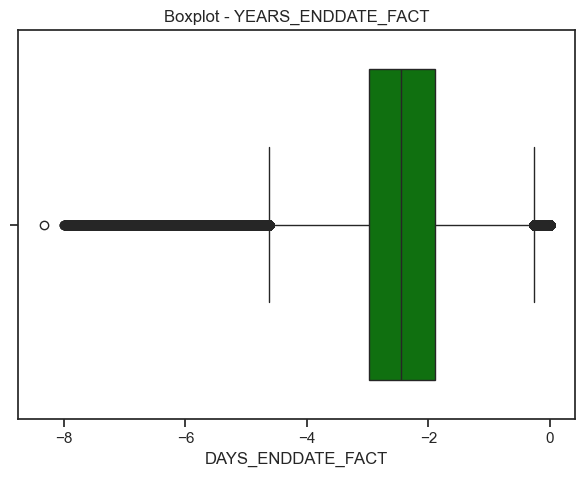

In [125]:
threshold = years_enddate_fact.quantile(1e-10)
data_under_quantile = years_enddate_fact[years_enddate_fact >= threshold]

col = 'YEARS_ENDDATE_FACT'
sns.boxplot(data_under_quantile,color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [126]:
print(f'before drop outliers: {years_enddate_fact.min()}')
print(f'after drop outliers: {data_under_quantile.min()}')

before drop outliers: -115.13150684931507
after drop outliers: -8.334246575342465


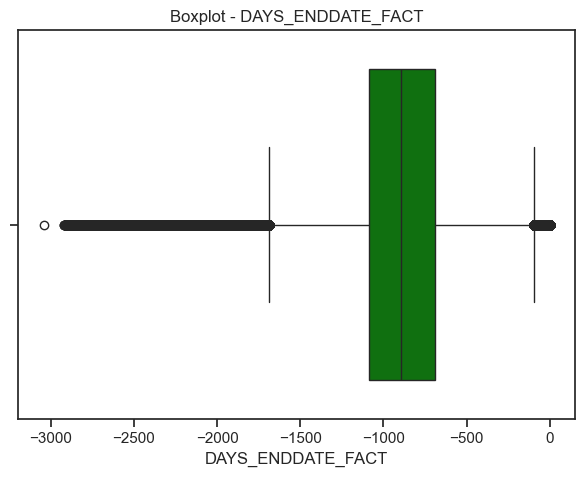

In [127]:
threshold = bureau_transforms['DAYS_ENDDATE_FACT'].quantile(1e-10)
data_under_quantile = bureau_transforms[bureau_transforms['DAYS_ENDDATE_FACT'] >= threshold]

col = 'DAYS_ENDDATE_FACT'
sns.boxplot((data_under_quantile['DAYS_ENDDATE_FACT']),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

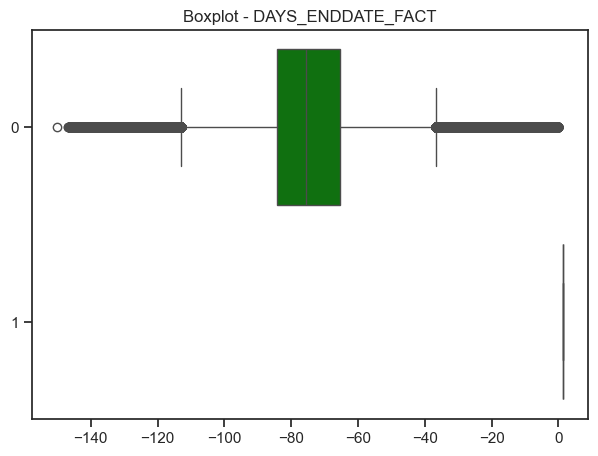

In [128]:
threshold = bureau_transforms['DAYS_ENDDATE_FACT'].quantile(1e-10)
data_under_quantile = bureau_transforms[bureau_transforms['DAYS_ENDDATE_FACT'] >= threshold]

col = 'DAYS_ENDDATE_FACT'
sns.boxplot(yeojohnson(data_under_quantile['DAYS_ENDDATE_FACT']),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [129]:
def handling_outliers(data):
    data = data.copy()
    # Drop Outliers
    threshold = data['DAYS_ENDDATE_FACT'].quantile(1e-10)
    data = data[data['DAYS_ENDDATE_FACT'] >= threshold]
    # Feature Transform
    data['DAYS_ENDDATE_FACT_LOG'] = yeojohnson(data['DAYS_ENDDATE_FACT'])[0]
    data.drop(columns=['DAYS_ENDDATE_FACT'], inplace=True)
    return data

bureau_transforms = handling_outliers(bureau_transforms)

### CNT_CREDIT_PROLONG

How many times was the Credit Bureau credit prolonged

In [130]:
bureau_transforms['CNT_CREDIT_PROLONG'].describe()

count    1.716293e+06
mean     6.410910e-03
std      9.622767e-02
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.000000e+00
Name: CNT_CREDIT_PROLONG, dtype: float64

In [131]:
bureau_transforms['CNT_CREDIT_PROLONG'].value_counts()

CNT_CREDIT_PROLONG
0    1707179
1       7620
2       1222
3        191
4         54
5         21
9          2
6          2
8          1
7          1
Name: count, dtype: int64

No anomaly found this CNT_CREDIT_PROLONG

### AMT_CREDIT_SUM

Current credit amount for the Credit Bureau credit.

In [132]:
bureau_transforms['AMT_CREDIT_SUM'].describe()  

count    1.716293e+06
mean     3.550142e+05
std      1.149848e+06
min      0.000000e+00
25%      5.130000e+04
50%      1.255365e+05
75%      3.150000e+05
max      5.850000e+08
Name: AMT_CREDIT_SUM, dtype: float64

In [133]:
bureau_transforms['AMT_CREDIT_SUM'].value_counts()

AMT_CREDIT_SUM
0.000         66494
225000.000    57597
135000.000    50193
450000.000    37155
90000.000     36938
              ...  
746640.000        1
708024.240        1
402556.500        1
21918.105         1
66342.645         1
Name: count, Length: 236702, dtype: int64

This suggests that most individuals do not have any remaining credit bureau records, while some do, with a high credit amount of 585.000.000 but looks like this is anomaly.

The maximum credit sum :585000000.0


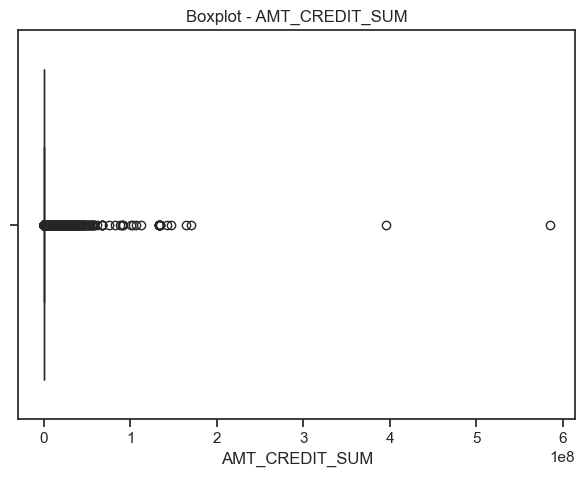

In [134]:
print(f'The maximum credit sum :{bureau_transforms["AMT_CREDIT_SUM"].max()}')
col = 'AMT_CREDIT_SUM'
sns.boxplot(bureau_transforms[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

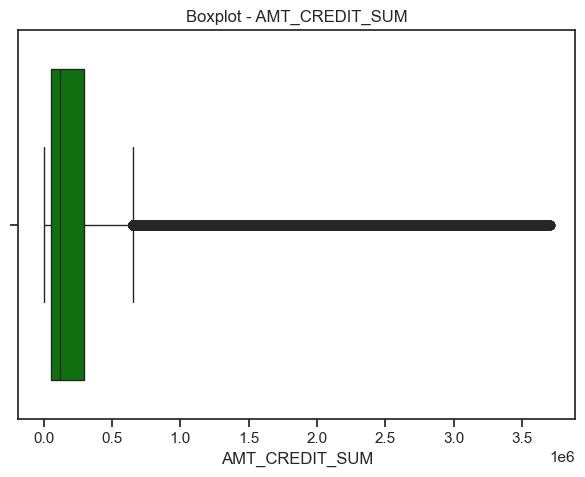

In [135]:
threshold = bureau_transforms['AMT_CREDIT_SUM'].quantile(0.99)
data_under_quantile = bureau_transforms[bureau_transforms['AMT_CREDIT_SUM'] <= threshold]

col = 'AMT_CREDIT_SUM'
sns.boxplot((data_under_quantile['AMT_CREDIT_SUM']),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [136]:
print(f'before drop outliers: {bureau_transforms['AMT_CREDIT_SUM'].max()}')
print(f'after drop outliers: {data_under_quantile['AMT_CREDIT_SUM'].max()}')

before drop outliers: 585000000.0
after drop outliers: 3702915.0


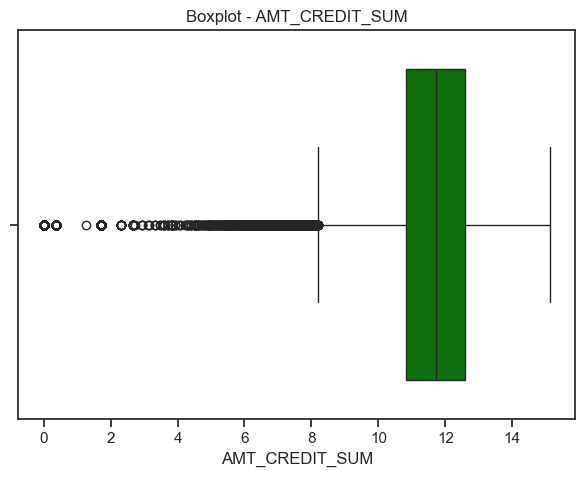

In [137]:
threshold = bureau_transforms['AMT_CREDIT_SUM'].quantile(0.99)
data_under_quantile = bureau_transforms[bureau_transforms['AMT_CREDIT_SUM'] <= threshold]

col = 'AMT_CREDIT_SUM'
sns.boxplot(np.log1p(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

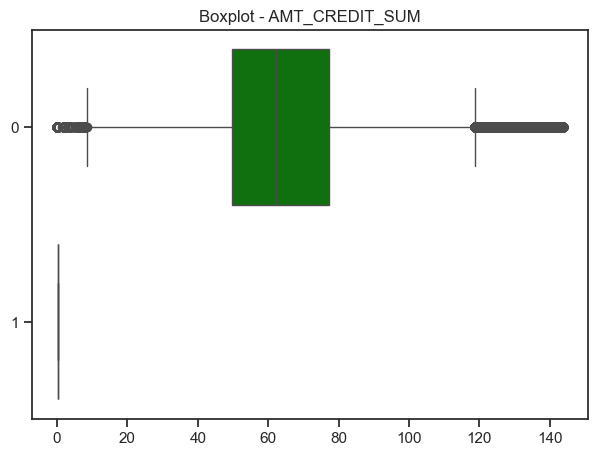

In [138]:
threshold = bureau_transforms['AMT_CREDIT_SUM'].quantile(0.99)
data_under_quantile = bureau_transforms[bureau_transforms['AMT_CREDIT_SUM'] <= threshold]

col = 'AMT_CREDIT_SUM'
sns.boxplot(yeojohnson(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [139]:
def handling_outliers(data):
    data = data.copy()
    # Drop Outliers
    threshold = data['AMT_CREDIT_SUM'].quantile(0.99)
    data = data[data['AMT_CREDIT_SUM'] <= threshold]
    # Feature Transform
    data['AMT_CREDIT_SUM_yeojohnson'] = yeojohnson(data['AMT_CREDIT_SUM'])[0]
    data.drop(columns=['AMT_CREDIT_SUM'], inplace=True)
    return data

bureau_transforms = handling_outliers(bureau_transforms)

### AMT_CREDIT_SUM_DEBT

In [140]:
bureau_transforms['AMT_CREDIT_SUM_DEBT'].describe()

count    1.699131e+06
mean     8.282726e+04
std      2.765075e+05
min     -4.705600e+06
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.195696e+07
Name: AMT_CREDIT_SUM_DEBT, dtype: float64

In [141]:
data_under_quantile['AMT_CREDIT_SUM_DEBT'].describe()

count    1.699131e+06
mean     8.282726e+04
std      2.765075e+05
min     -4.705600e+06
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.195696e+07
Name: AMT_CREDIT_SUM_DEBT, dtype: float64

Credit debt should not be negative, which may indicate an anomaly. Additionally, the maximum value for credit sum debt is quite high; however, we can assume that this person has substantial debt across all their loans, so we will not remove the outliers.

The maximum credit bureau debt :11956963.5


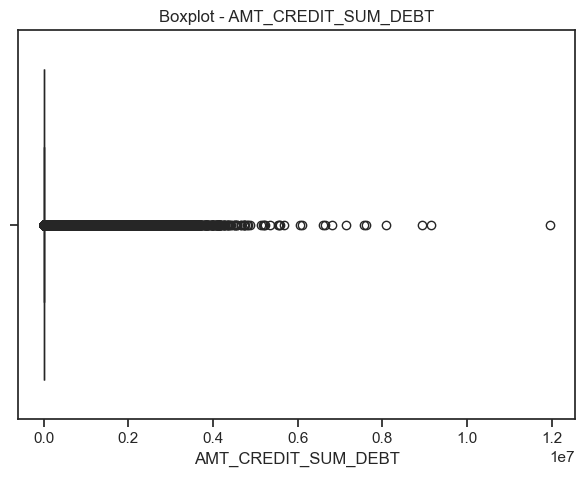

In [142]:
minimum_threshold = bureau_transforms['AMT_CREDIT_SUM_DEBT'].quantile(0.1)
data_under_quantile = bureau_transforms[(bureau_transforms['AMT_CREDIT_SUM_DEBT'] >= minimum_threshold)]

print(f'The maximum credit bureau debt :{data_under_quantile["AMT_CREDIT_SUM_DEBT"].max()}')
col = 'AMT_CREDIT_SUM_DEBT'
sns.boxplot((data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

The maximum credit bureau debt :11956963.5


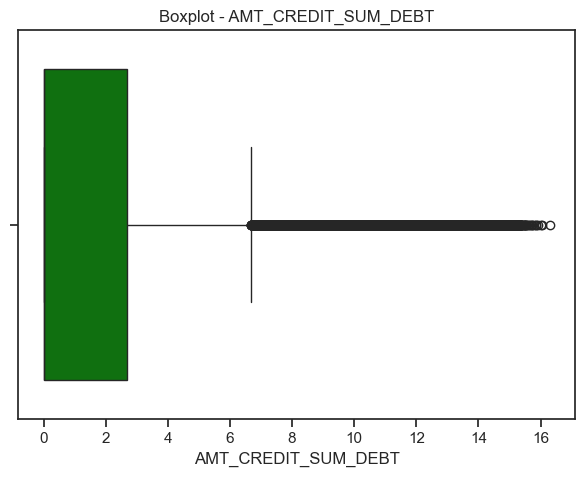

In [143]:
minimum_threshold = bureau_transforms['AMT_CREDIT_SUM_DEBT'].quantile(0.1)
data_under_quantile = bureau_transforms[(bureau_transforms['AMT_CREDIT_SUM_DEBT'] >= minimum_threshold)]

print(f'The maximum credit bureau debt :{data_under_quantile["AMT_CREDIT_SUM_DEBT"].max()}')
col = 'AMT_CREDIT_SUM_DEBT'
sns.boxplot(np.log1p(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

The maximum credit bureau debt :11956963.5


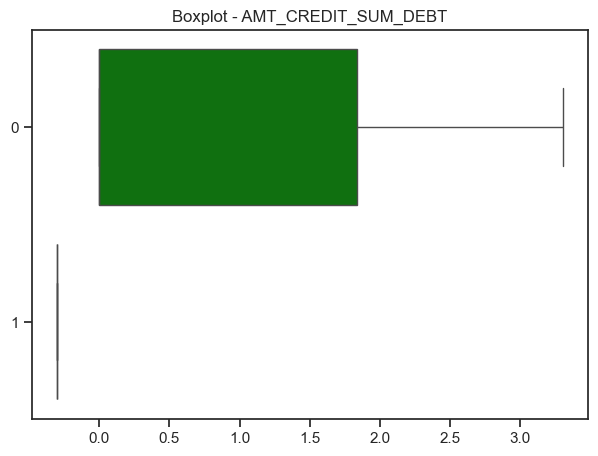

In [144]:
minimum_threshold = bureau_transforms['AMT_CREDIT_SUM_DEBT'].quantile(0.1)
data_under_quantile = bureau_transforms[(bureau_transforms['AMT_CREDIT_SUM_DEBT'] >= minimum_threshold)]

print(f'The maximum credit bureau debt :{data_under_quantile["AMT_CREDIT_SUM_DEBT"].max()}')
col = 'AMT_CREDIT_SUM_DEBT'
sns.boxplot(yeojohnson(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [145]:
def handling_outliers(data):
    data = data.copy()
    threshold = data['AMT_CREDIT_SUM_DEBT'].quantile(0.1)
    data = data[data['AMT_CREDIT_SUM_DEBT'] >= threshold]
    # Feature Transform
    data['AMT_CREDIT_SUM_DEBT_yeojohnson'] = yeojohnson(data['AMT_CREDIT_SUM_DEBT'])[0]
    data.drop(columns=['AMT_CREDIT_SUM_DEBT'], inplace=True)
    return data

bureau_transforms = handling_outliers(bureau_transforms)

### AMT_CREDIT_SUM_LIMIT

In [146]:
bureau_transforms['AMT_CREDIT_SUM_LIMIT'].describe()

count    1.690713e+06
mean     3.618634e+03
std      3.352394e+04
min     -5.864061e+05
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      3.375000e+06
Name: AMT_CREDIT_SUM_LIMIT, dtype: float64

The minimum value is approximately -5.86, which suggests that some entries have negative credit limits. This is unusual since credit limits should logically be zero or a positive number. Negative values could arise from data entry errors, incorrect calculations, or misreporting so we will considering to drop the outliers.

The maximum credit bureau limit :3375000.0


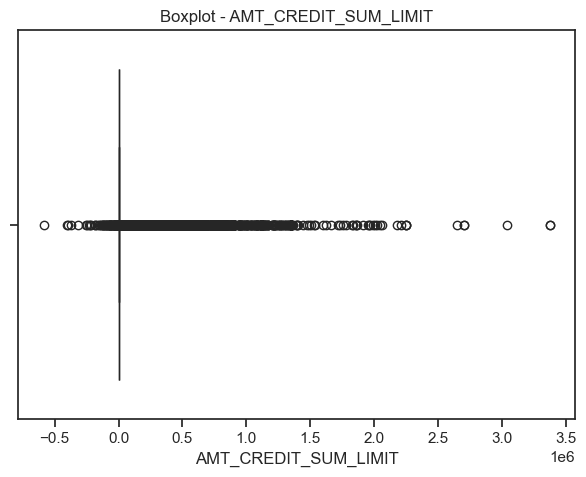

In [147]:
print(f'The maximum credit bureau limit :{bureau_transforms["AMT_CREDIT_SUM_LIMIT"].max()}')
col = 'AMT_CREDIT_SUM_LIMIT'
sns.boxplot(bureau_transforms[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

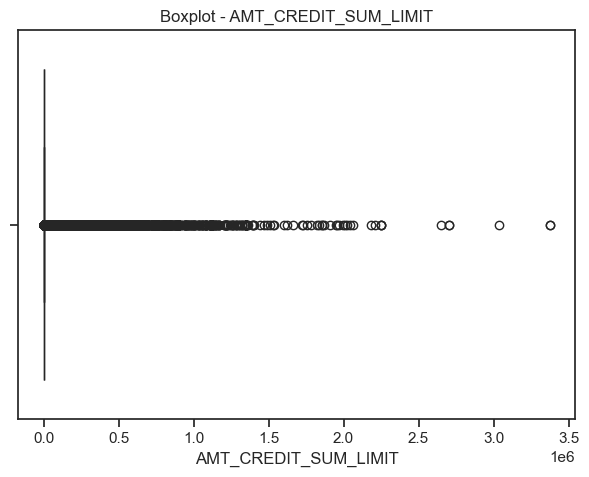

In [148]:
threshold = bureau_transforms['AMT_CREDIT_SUM_LIMIT'].quantile(0.1)
data_under_quantile = bureau_transforms[bureau_transforms['AMT_CREDIT_SUM_LIMIT'] >= threshold]
col = 'AMT_CREDIT_SUM_LIMIT'
sns.boxplot(data_under_quantile[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

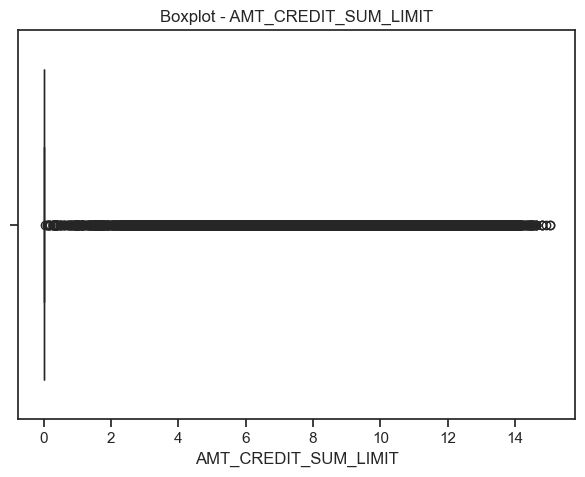

In [149]:
threshold = bureau_transforms['AMT_CREDIT_SUM_LIMIT'].quantile(0.1)
data_under_quantile = bureau_transforms[bureau_transforms['AMT_CREDIT_SUM_LIMIT'] >= threshold]
col = 'AMT_CREDIT_SUM_LIMIT'
sns.boxplot(np.log1p(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

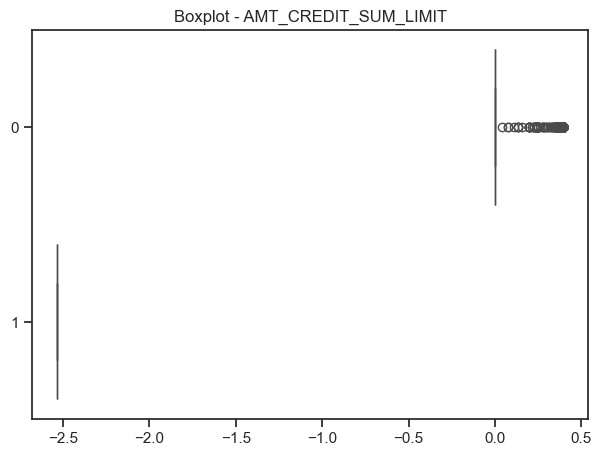

In [150]:
threshold = bureau_transforms['AMT_CREDIT_SUM_LIMIT'].quantile(0.1)
data_under_quantile = bureau_transforms[bureau_transforms['AMT_CREDIT_SUM_LIMIT'] >= threshold]
col = 'AMT_CREDIT_SUM_LIMIT'
sns.boxplot(yeojohnson(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [151]:
def handling_outliers(data):
    data = data.copy()
    threshold = data['AMT_CREDIT_SUM_LIMIT'].quantile(0.1)
    data = data[data['AMT_CREDIT_SUM_LIMIT'] >= threshold]
    # Feature Transform
    data['AMT_CREDIT_SUM_LIMIT_yeojohnson'] = yeojohnson(data['AMT_CREDIT_SUM_LIMIT'])[0]
    data.drop(columns=['AMT_CREDIT_SUM_LIMIT'], inplace=True)
    return data

bureau_transforms = handling_outliers(bureau_transforms)

### AMT_CREDIT_SUM_OVERDUE

Current amount overdue on Credit Bureau credit

In [152]:
bureau_transforms['AMT_CREDIT_SUM_OVERDUE'].describe()  

count    1.690362e+06
mean     3.616213e+01
std      5.881844e+03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      3.756681e+06
Name: AMT_CREDIT_SUM_OVERDUE, dtype: float64

It appears that there are no anomalies when compared to the previous features.

The maximum credit bureau sum overdue :3756681.0


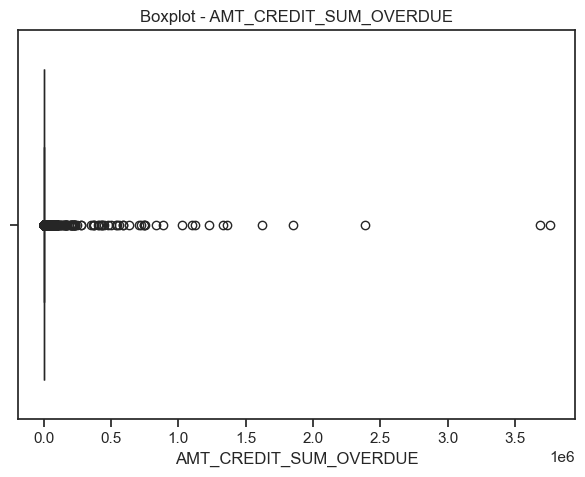

In [153]:
print(f'The maximum credit bureau sum overdue :{bureau_transforms["AMT_CREDIT_SUM_OVERDUE"].max()}')
col = 'AMT_CREDIT_SUM_OVERDUE'
sns.boxplot(bureau_transforms[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

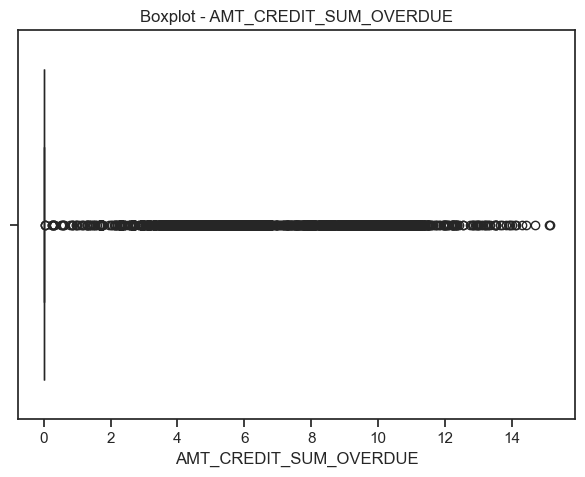

In [154]:
col = 'AMT_CREDIT_SUM_OVERDUE'
sns.boxplot(np.log1p(bureau_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

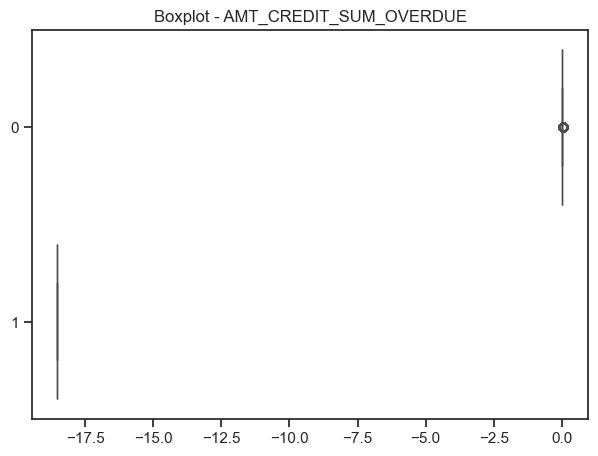

In [155]:
col = 'AMT_CREDIT_SUM_OVERDUE'
sns.boxplot(yeojohnson(bureau_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [156]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['AMT_CREDIT_SUM_OVERDUE_yeojohnson'] = yeojohnson(data['AMT_CREDIT_SUM_OVERDUE'])[0]
    data.drop(columns=['AMT_CREDIT_SUM_OVERDUE'], inplace=True)
    return data

bureau_transforms = handling_outliers(bureau_transforms)

### DAYS_CREDIT_UPDATE

How many days before loan application did last information about the Credit Bureau credit come. This metric indicates the number of days prior to the loan application that the most recent information regarding the individual's Credit Bureau credit was recorded. It helps assess how up-to-date the credit information is in relation to the loan application.

In [157]:
bureau_transforms['DAYS_CREDIT_UPDATE'].describe()

count    1.690362e+06
mean    -5.969018e+02
std      7.235270e+02
min     -4.194700e+04
25%     -9.130000e+02
50%     -3.970000e+02
75%     -3.300000e+01
max      2.300000e+01
Name: DAYS_CREDIT_UPDATE, dtype: float64

In [158]:
years_credit_update = bureau_transforms['DAYS_CREDIT_UPDATE'] / 365
years_credit_update.describe()

count    1.690362e+06
mean    -1.635347e+00
std      1.982266e+00
min     -1.149233e+02
25%     -2.501370e+00
50%     -1.087671e+00
75%     -9.041096e-02
max      6.301370e-02
Name: DAYS_CREDIT_UPDATE, dtype: float64

In [159]:
print(f'The minimum credit bureau update (in years) :{years_credit_update.min()}')
print(f'The maximum credit bureau update (in years) :{years_credit_update.max()}')

The minimum credit bureau update (in years) :-114.92328767123287
The maximum credit bureau update (in years) :0.06301369863013699


It seems that the minimum value is an anomaly, indicating that a person's last update on the credit bureau was approximately 114 years ago.



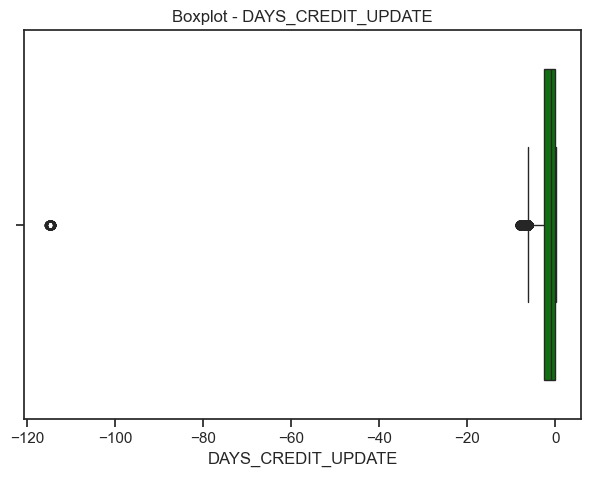

In [160]:
col = 'DAYS_CREDIT_UPDATE'
sns.boxplot(years_credit_update,color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

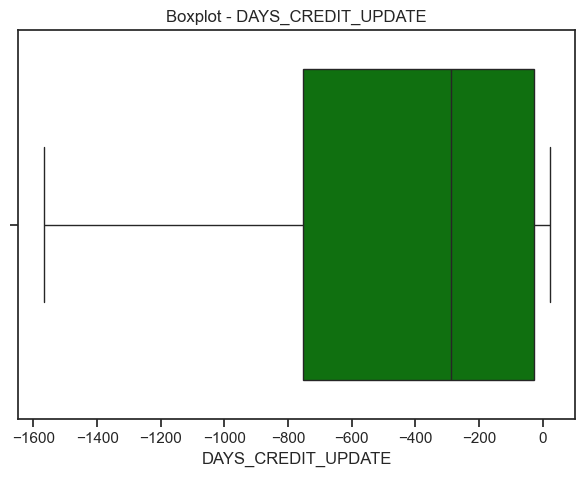

In [161]:
threshold = bureau_transforms['DAYS_CREDIT_UPDATE'].quantile(0.1)
data_above_quantile = bureau_transforms[bureau_transforms['DAYS_CREDIT_UPDATE'] >= threshold]

col = 'DAYS_CREDIT_UPDATE'
sns.boxplot(data_above_quantile[col],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [162]:
print(f'before drop outliers: {bureau_transforms["DAYS_CREDIT_UPDATE"].min()}')
print(f'after drop outliers: {data_above_quantile["DAYS_CREDIT_UPDATE"].min()}')

before drop outliers: -41947
after drop outliers: -1568


After dropping the outliers, the data is normal distributed which is no need for feature transformation.

In [163]:
def handling_outliers(data):
    data = data.copy()
    threshold = data['DAYS_CREDIT_UPDATE'].quantile(0.1)
    data = data[data['DAYS_CREDIT_UPDATE'] >= threshold]

    return data

bureau_transforms = handling_outliers(bureau_transforms)

## Feature Encoding

In [164]:
bureau_encoded = bureau_transforms.copy()

In [165]:
bureau_encoded.select_dtypes(['object']).columns.to_list()

['CREDIT_ACTIVE', 'CREDIT_TYPE']

### CREDIT_ACTIVE
Status of the Credit Bureau (CB) reported credits

In [166]:
bureau_encoded['CREDIT_ACTIVE'].value_counts()

CREDIT_ACTIVE
Closed      914001
Active      603673
Sold          3736
Bad debt        16
Name: count, dtype: int64

In [167]:
def feature_encode(data):
    data = data.copy()
    # One-Hot Encoding
    data = pd.get_dummies(data, columns=['CREDIT_ACTIVE'], prefix='CREDIT_ACTIVE')
    return data

bureau_encoded = feature_encode(bureau_encoded)

### CREDIT_TYPE

Type of Credit Bureau credit (Car, cash,...)

In [168]:
bureau_encoded['CREDIT_TYPE'].value_counts()

CREDIT_TYPE
Consumer credit                                 1098676
Credit card                                      376778
Car loan                                          23648
Microloan                                         12413
Mortgage                                           7063
Loan for business development                      1433
Another type of loan                                831
Loan for working capital replenishment              400
Unknown type of loan                                 99
Cash loan (non-earmarked)                            56
Real estate loan                                     16
Loan for the purchase of equipment                    9
Loan for purchase of shares (margin lending)          3
Interbank credit                                      1
Name: count, dtype: int64

Too many values in CREDIT_TYPE, we will aggregated this category into 4 category.

In [169]:
def label_encode(data):
    data = data.copy()
    # Label Encoding (aggregating the categories)
    data = data.replace({'CREDIT_TYPE': {'Consumer credit': 'Consumer credit', 
                                         'Credit card': 'Credit card', 
                                         'Car loan': 'Car loan', 
                                         'Microloan': 'Other loan',
                                         'Mortgage': 'Other loan',
                                         'Loan for business development': 'Other loan', 
                                         'Another type of loan': 'Other loan',
                                         'Loan for working capital replenishment': 'Other loan', 
                                         'Unknown type of loan': 'Other loan',
                                         'Cash loan (non-earmarked)': 'Other loan',
                                         'Real estate loan': 'Other loan',
                                         'Loan for the purchase of equipment': 'Other loan',
                                         'Loan for purchase of shares (margin lending)': 'Other loan',
                                         'Interbank credit': 'Other loan'}})
    # One Hot Encoding
    data = pd.get_dummies(data, columns=['CREDIT_TYPE'], prefix='CREDIT_TYPE')
    return data

bureau_encoded = label_encode(bureau_encoded)

## Feature Engineering

In [170]:
# Feature Engineering
def bureau_merge_FE(data):
    data = data.copy()
    # The duration a person loans from the bureau
    data['DAYS_DURATION_CREDIT'] = data['DAYS_ENDDATE_FACT_LOG'] - data['DAYS_CREDIT']
    return data

bureau_FE = bureau_merge_FE(bureau_encoded)

In [171]:
pd.DataFrame(bureau_FE.columns.to_list())

,0
0,SK_ID_CURR
1,SK_ID_BUREAU
2,DAYS_CREDIT
3,CNT_CREDIT_PROLONG
4,DAYS_CREDIT_UPDATE
5,CREDIT_DAY_OVERDUE_YEOJOHNSON
6,DAYS_CREDIT_ENDDATE_LOG
7,DAYS_ENDDATE_FACT_LOG
8,AMT_CREDIT_SUM_yeojohnson
9,AMT_CREDIT_SUM_DEBT_yeojohnson


# Merging Dataset Data_Final, Bureau, and Bureau Balance

In [172]:
# Merge the bureau and bureau_balance data

# Aggregating bureau_balance_encoded
bureau_balance_agg = bureau_balance_encoded.groupby('SK_ID_BUREAU').agg({
    'MONTHS_BALANCE': ['min', 'max', 'mean'],
    'STATUS_Closed': 'sum',
    'STATUS_DPD 1-30': 'sum',
    'STATUS_DPD 120+': 'sum',
    'STATUS_DPD 31-60': 'sum',
    'STATUS_DPD 61-90': 'sum',
    'STATUS_DPD 91-120': 'sum',
    'STATUS_No DPD': 'sum',
    'STATUS_Unknown': 'sum'
}).reset_index()

# Flattening the multi-level columns
bureau_balance_agg.columns = ['_'.join(col).strip() if col[1] else col[0] for col in bureau_balance_agg.columns.values]

# Merging the aggregated data into bureau_encoded
data_merge_bureau = bureau_encoded.merge(bureau_balance_agg, on='SK_ID_BUREAU', how='left')

In [173]:
# Merge the data_merge_bureau with Appplication_train data

#  Aggregating data_merge_bureau
bureau_agg = data_merge_bureau.groupby('SK_ID_CURR').agg({
    'SK_ID_BUREAU': 'count',
    'DAYS_CREDIT': ['min', 'max', 'mean'],
    'CNT_CREDIT_PROLONG': 'sum',
    'DAYS_CREDIT_UPDATE': ['min', 'max', 'mean'],
    'CREDIT_DAY_OVERDUE_YEOJOHNSON': 'sum',
    'DAYS_CREDIT_ENDDATE_LOG': ['min', 'max', 'mean'],
    'DAYS_ENDDATE_FACT_LOG': ['min', 'max', 'mean'],
    'AMT_CREDIT_SUM_yeojohnson': 'sum',
    'AMT_CREDIT_SUM_DEBT_yeojohnson': 'sum',
    'AMT_CREDIT_SUM_LIMIT_yeojohnson': 'sum',
    'AMT_CREDIT_SUM_OVERDUE_yeojohnson': 'sum',
    'CREDIT_ACTIVE_Active': 'sum',
    'CREDIT_ACTIVE_Bad debt': 'sum',
    'CREDIT_ACTIVE_Closed': 'sum',
    'CREDIT_ACTIVE_Sold': 'sum',
    'CREDIT_TYPE_Car loan': 'sum',
    'CREDIT_TYPE_Consumer credit': 'sum',
    'CREDIT_TYPE_Credit card': 'sum',
    'CREDIT_TYPE_Other loan': 'sum',
    'MONTHS_BALANCE_min': 'min',
    'MONTHS_BALANCE_max': 'max',
    'MONTHS_BALANCE_mean': 'mean',
    'STATUS_Closed_sum': 'sum',
    'STATUS_DPD 1-30_sum': 'sum',
    'STATUS_DPD 120+_sum': 'sum',
    'STATUS_DPD 31-60_sum': 'sum',
    'STATUS_DPD 61-90_sum': 'sum',
    'STATUS_DPD 91-120_sum': 'sum',
    'STATUS_No DPD_sum': 'sum',
    'STATUS_Unknown_sum': 'sum'
})

#  Flattening the multi-level columns
bureau_agg.columns = ['BUR_' + '_'.join(col).strip() for col in bureau_agg.columns.values]
bureau_agg = bureau_agg.reset_index()

#  Left join to data_final
data_merge_1 = data_final.merge(bureau_agg, on='SK_ID_CURR', how='left')


In [174]:
data_merge_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303976 entries, 0 to 303975
Data columns (total 93 columns):
 #   Column                                            Non-Null Count   Dtype  
---  ------                                            --------------   -----  
 0   SK_ID_CURR                                        303976 non-null  int64  
 1   TARGET                                            303976 non-null  int64  
 2   CODE_GENDER                                       303976 non-null  int64  
 3   NAME_EDUCATION_TYPE                               303976 non-null  int64  
 4   REGION_POPULATION_RELATIVE                        303976 non-null  float64
 5   DAYS_ID_PUBLISH                                   303976 non-null  int64  
 6   FLAG_MOBIL                                        303976 non-null  int64  
 7   FLAG_WORK_PHONE                                   303976 non-null  int64  
 8   FLAG_CONT_MOBILE                                  303976 non-null  int64  
 9   FLAG

# Installment

In [175]:
instalments_payments = pd.read_csv(r'C:\Users\aldiv\Downloads\Data Analyst\Project based intern\Home Credit\Final Tasks\installments_payments.csv')

In [176]:
instalments_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [177]:
instalments_payments.describe()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360250e+07,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,8.566373e-01,1.887090e+01,-1.042270e+03,-1.051114e+03,1.705091e+04,1.723822e+04
std,5.362029e+05,1.027183e+05,1.035216e+00,2.666407e+01,8.009463e+02,8.005859e+02,5.057025e+04,5.473578e+04
min,1.000001e+06,1.000010e+05,0.000000e+00,1.000000e+00,-2.922000e+03,-4.921000e+03,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.000000e+00,4.000000e+00,-1.654000e+03,-1.662000e+03,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.000000e+00,8.000000e+00,-8.180000e+02,-8.270000e+02,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.000000e+00,1.900000e+01,-3.610000e+02,-3.700000e+02,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,1.780000e+02,2.770000e+02,-1.000000e+00,-1.000000e+00,3.771488e+06,3.771488e+06


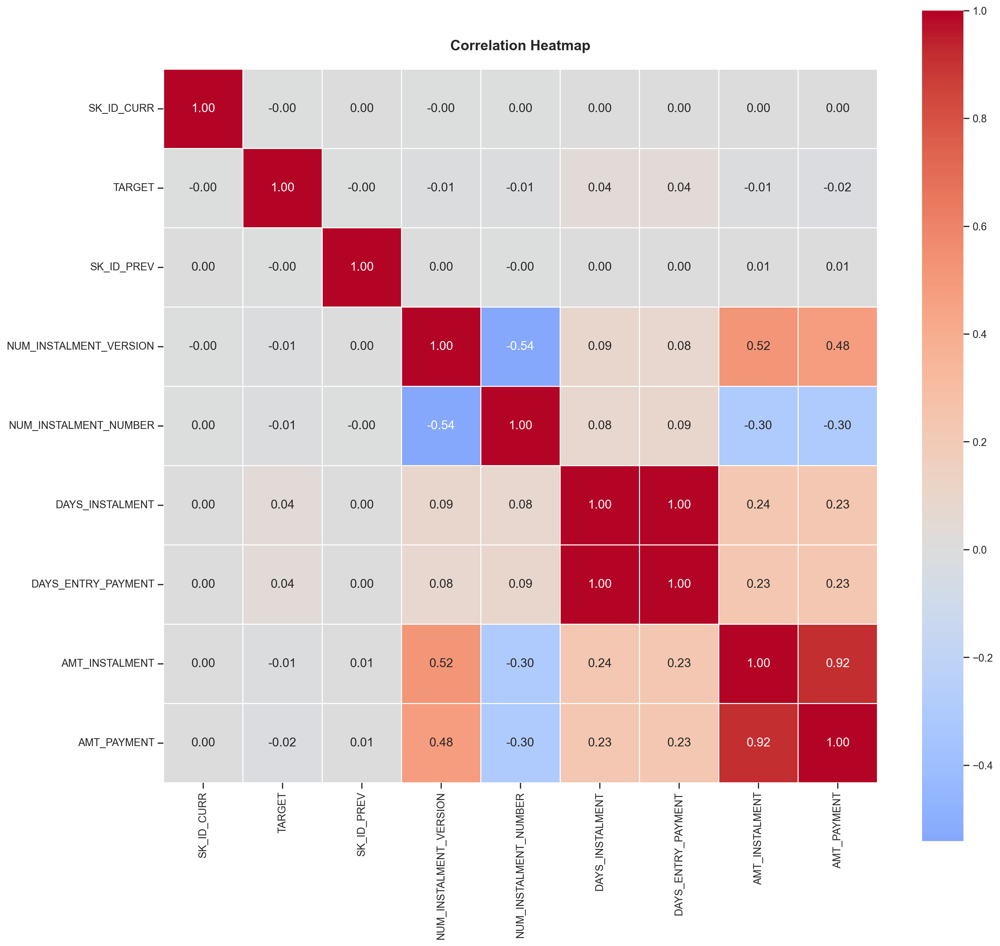


Pasangan fitur dengan korelasi tinggi (>0.7):
DAYS_INSTALMENT - DAYS_ENTRY_PAYMENT: 1.00
AMT_INSTALMENT - AMT_PAYMENT: 0.92


In [178]:
%matplotlib inline
instalments_target = data_final[['SK_ID_CURR', 'TARGET']]
instalments_target = instalments_target.merge(instalments_payments, on='SK_ID_CURR', how='left')

numerical_cols = instalments_target.select_dtypes(['float64', 'int64']).columns
plt.figure(figsize=(15, 15),dpi=200)
correlation_matrix = instalments_target[numerical_cols].corr(method='spearman')
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f', square=True, linewidths=0.5, annot_kws={'size': 13},
            xticklabels=correlation_matrix.columns, yticklabels=correlation_matrix.columns)
plt.title('Correlation Heatmap', pad = 20, fontweight='bold', fontsize = 15)
#plt.tight_layout()
plt.show()
plt.close()

threshold = 0.7
high_corr_features = np.where(np.abs(correlation_matrix) > threshold)
high_corr_features = [(correlation_matrix.index[x], correlation_matrix.columns[y], correlation_matrix.iloc[x,y]) 
                      for x, y in zip(*high_corr_features) if x != y and x < y]

print("\nPasangan fitur dengan korelasi tinggi (>0.7):")
for feat1, feat2, corr in high_corr_features:
    print(f"{feat1} - {feat2}: {corr:.2f}")

Some of features have a high correlation (correlation score > 0.7) between features and there is no correlation between feature with the target on application_train so we will determined which features that has impact for TARGET.

In [179]:
from autoviz import data_cleaning_suggestions
data_cleaning_suggestions(instalments_payments)


    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_PREV,int64,0.000000,7,1000001.000000,2843499.000000,No issue
SK_ID_CURR,int64,0.000000,2,100001.000000,456255.000000,No issue
NUM_INSTALMENT_VERSION,float64,0.000000,NA,0.000000,178.000000,Column has 417616 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
NUM_INSTALMENT_NUMBER,int64,0.000000,0,1.000000,277.000000,Column has 1886320 outliers greater than upper bound (41.50) or lower than lower bound(-18.50). Cap them or remove them.
DAYS_INSTALMENT,float64,0.000000,NA,-2922.000000,-1.000000,No issue
DAYS_ENTRY_PAYMENT,float64,0.021352,NA,-4921.000000,-1.000000,"2905 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 1 outliers greater than upper bound (1568.00) or lower than lower bound(-3600.00). Cap them or remove them., Column has a high correlation with ['DAYS_INSTALMENT']. Consider dropping one of them."
AMT_INSTALMENT,float64,0.000000,NA,0.000000,3771487.845000,Column has 1120800 outliers greater than upper bound (35436.40) or lower than lower bound(-14500.10). Cap them or remove them.
AMT_PAYMENT,float64,0.021352,NA,0.000000,3771487.845000,"2905 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 1130094 outliers greater than upper bound (35173.66) or lower than lower bound(-15666.97). Cap them or remove them., Column has a high correlation with ['AMT_INSTALMENT']. Consider dropping one of them."


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_PREV,int64,0.000000,7,1000001.0,2843499.000,No issue
SK_ID_CURR,int64,0.000000,2,100001.0,456255.000,No issue
NUM_INSTALMENT_VERSION,float64,0.000000,NA,0.0,178.000,Column has 417616 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
NUM_INSTALMENT_NUMBER,int64,0.000000,0,1.0,277.000,Column has 1886320 outliers greater than upper bound (41.50) or lower than lower bound(-18.50). Cap them or remove them.
DAYS_INSTALMENT,float64,0.000000,NA,-2922.0,-1.000,No issue
DAYS_ENTRY_PAYMENT,float64,0.021352,NA,-4921.0,-1.000,"2905 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 1 outliers greater than upper bound (1568.00) or lower than lower bound(-3600.00). Cap them or remove them., Column has a high correlation with ['DAYS_INSTALMENT']. Consider dropping one of them."
AMT_INSTALMENT,float64,0.000000,NA,0.0,3771487.845,Column has 1120800 outliers greater than upper bound (35436.40) or lower than lower bound(-14500.10). Cap them or remove them.
AMT_PAYMENT,float64,0.021352,NA,0.0,3771487.845,"2905 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 1130094 outliers greater than upper bound (35173.66) or lower than lower bound(-15666.97). Cap them or remove them., Column has a high correlation with ['AMT_INSTALMENT']. Consider dropping one of them."


The dataset instalment doesn't look like have a messy data but we will cleaning the dataset that can be used on model machine learning later.

## Handling Null Value

In [180]:
# List of common missing value strings
missing_values_set = [
    'NA', 'N/A', 'null', 'NaN','nan', 'XNA', 'None', 'empty', 'undefined', 'unknown', 'Unknown',
    '--', 'not available', '',' ','  ','   ', 'missing', 'unavailable', 'not applicable',
    'not found', 'no data', 'no value', 'n/a', 'none', 'null value', 'unknown value', 'blank', 'invalid', 'error',
    'unassigned', 'uninitialized', 'void', 'undisclosed', 'unreported', 'empty string',
    'na', 'not recorded', 'unanswered', 'not specified', 'unobserved', 'unpopulated',
    'none of the above', 'does not apply', 'ignored', 'unspecified', 'unfilled', 'inapplicable',
    'unavailable value', 'not entered', 'missing value', 'data not available', 'data missing',
    'not inputted', 'not given', 'unrecorded', 'unfurnished', 'undocumented', 'not listed',
    'unsupplied', 'empty field', 'unfilled field', 'unanswered question', 'no response',
    'not provided', 'not reported', 'unanswered', 'unacknowledged', 'no information',
    'no response recorded', 'no submission', 'no entry', 'not logged', 'unverified',
    'unobserved value', 'data absent', 'absence', 'unfilled cell', 'undefined data',
    'does not exist', 'not found', 'missing data', 'no answer', 'unavailable information',
    'no input', 'data error', 'unseen', 'unviewed', 'not selected', 'irrelevant',
    'skipped', 'no response given', 'no feedback', 'failed', 'discarded', 'no record',
    'unfetched', 'not completed', 'not finished', 'not updated', 'forgotten', 'rejected',
    'unsupplied data', 'data void', 'undetermined', 'not checked', 'not applicable here',
    'unattended', 'data missing', 'nonexistent', 'unsubscribed', 'denied', 'unaccepted',
    'unwitnessed', 'discarded entry', 'rejected data', 'unapplicable', 'non-populated',
    'unapplicable field', 'lost', 'absent data', 'no match', 'no result'
]

# Optimized function to replace missing-like values with NaN
def replace_missing_with_null(df, missing_values_set):
    # Select object type columns
    df_object_columns = df.select_dtypes(include=['object'])

    # Replace missing-like values with NaN
    for col in df_object_columns.columns:
        # Vectorized replacement of missing-like values with NaN
        df[col] = df[col].apply(lambda x: np.nan if str(x).strip() in missing_values_set else x)

    return df

bureau = replace_missing_with_null(instalments_payments, missing_values_set)

In [181]:
# Function untuk mengecek persentase null value

def check_null_percentage(df):
    # Hitung total rows
    total_rows = len(df)

    # Hitung null values dan persentasenya
    null_counts = df.isnull().sum()
    null_percentage = (null_counts / total_rows * 100).round(2)

    # Buat dataframe hasil
    null_df = pd.DataFrame({
        'Total_Null': null_counts,
        'Null_Percentage': null_percentage
    })

    # Sorting berdasarkan persentase null terbesar
    null_df = null_df.sort_values('Null_Percentage', ascending=False)

    # Filter hanya kolom yang memiliki null values
    null_df = null_df[null_df['Total_Null'] > 0]

    return null_df

# # Check null value (data) after handling null value
null_analysis = check_null_percentage(instalments_payments)
print("Total rows in dataset:", len(instalments_payments))
print("\nNull Value Analysis:")
print(null_analysis)

Total rows in dataset: 13605401

Null Value Analysis:
                    Total_Null  Null_Percentage
AMT_PAYMENT            2905          0.02      
DAYS_ENTRY_PAYMENT     2905          0.02      


In [182]:
instalment_clean = instalments_payments.fillna(instalments_payments.median())

Handling missing value by filling them with median because median is robust with outliers.

## Handling Duplicated Data

In [183]:
print(f'Total duplicated rows in instalments_payments: {instalment_clean.duplicated().sum()}')

Total duplicated rows in instalments_payments: 0


It appears there is no duplicated data on instalments_payments

## Handling Outliers

In [184]:
instalment_transforms = instalment_clean.copy()

### NUM_INSTALMENT_VERSION

Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed. For example, a change might occur if the payment terms, amounts, or due dates have been adjusted. A value of 0 typically denotes a credit card installment. 

We considering to use this feature because the more people change they payment terms, amounts, or else we can considering there might be something to that people.

In [185]:
instalment_clean['NUM_INSTALMENT_VERSION'].unique()

array([  1.,   0.,   2.,   4.,   3.,   5.,   7.,   8.,   6.,  13.,   9.,
        21.,  22.,  12.,  17.,  18.,  11.,  14.,  34.,  33.,  19.,  16.,
        15.,  10.,  26.,  27.,  20.,  25.,  23.,  24.,  31.,  32.,  28.,
        35.,  29.,  30.,  43.,  39.,  40.,  36.,  41.,  42.,  37.,  38.,
        68.,  44.,  45.,  46., 178.,  52.,  51.,  53.,  54.,  49.,  50.,
        58.,  57.,  55.,  56.,  48.,  47.,  72.,  59.,  73.,  61.])

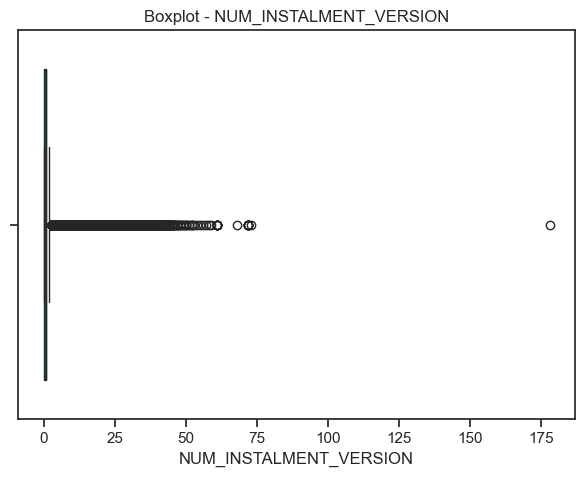

In [186]:
col = 'NUM_INSTALMENT_VERSION'
sns.boxplot((instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

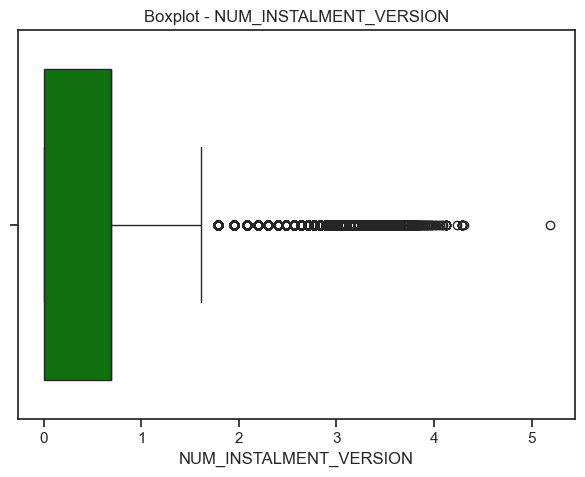

In [187]:
col = 'NUM_INSTALMENT_VERSION'
sns.boxplot(np.log1p(instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

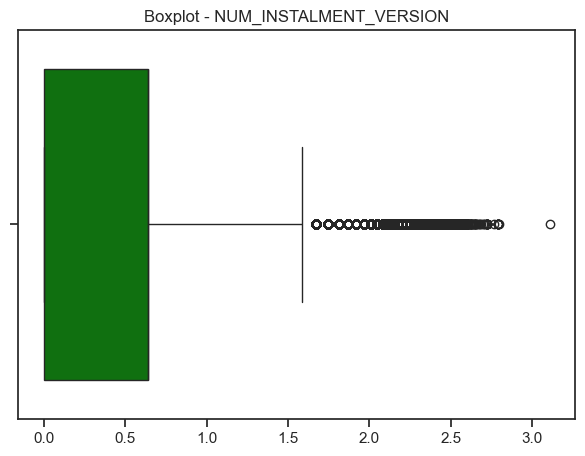

In [188]:
col = 'NUM_INSTALMENT_VERSION'
sns.boxplot(yeojohnson(instalment_transforms[col])[0],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [189]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['NUM_INSTALMENT_VERSION_yeojohnson'] = yeojohnson(data['NUM_INSTALMENT_VERSION'])[0]
    return data

instalment_transforms = handling_outliers(instalment_transforms)

### NUM_INSTALMENT_NUMBER

indicates the specific installment number being observed for payment. It refers to the sequence of payments within the installment schedule.

In [190]:
instalment_transforms['NUM_INSTALMENT_NUMBER'].unique()

array([  6,  34,   1,   3,   2,  12,  11,   4,  14,   8,  20,  56,   7,
        23,  38, 116,   5,  46, 106,   9, 105,  88,  30,  16,  65,  19,
        15,  57,  10,  41,  84,  49,  59, 107,  17,  94,  64,  28,  24,
       140,  43,  99,  69,  13,  22,  85,  29,  83,  73, 139,  39,  18,
        26,  25,  21,  44,  27,  31,  37,  63,  45,  78,  53,  92, 112,
        36,  93, 114,  58,  32,  67,  47,  68,  40,  81,  61, 117,  60,
        75, 149,  35,  48,  82,  79,  71,  51,  72,  80, 156,  42,  50,
       148,  33,  55, 103,  54, 180,  86, 113,  87,  62, 102, 115, 142,
       164, 162, 101,  91,  96, 100, 104, 121,  66, 123,  52,  89,  70,
       124,  76,  97, 134, 165, 135,  77, 128, 125, 118, 122, 153,  95,
       109, 158, 132, 120, 111, 151, 133, 119, 129,  98, 173, 127,  90,
       168, 138,  74, 150, 108, 145, 147, 152, 130, 146, 154, 196, 210,
       110, 144, 136, 170, 190, 126, 191, 171, 131, 178, 155, 157, 181,
       183, 169, 137, 207, 143, 163, 159, 195, 200, 177, 176, 18

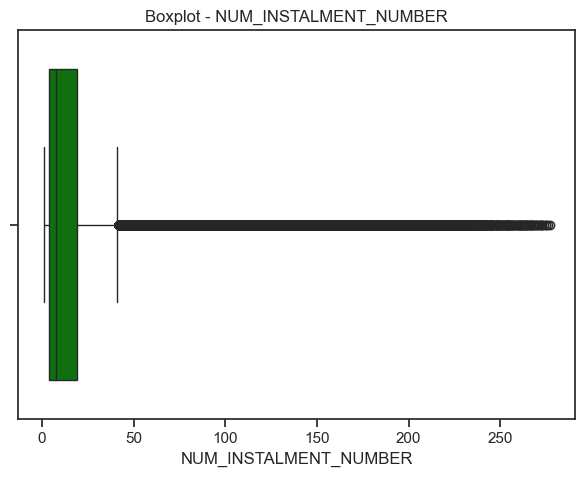

In [191]:
col = 'NUM_INSTALMENT_NUMBER'
sns.boxplot((instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

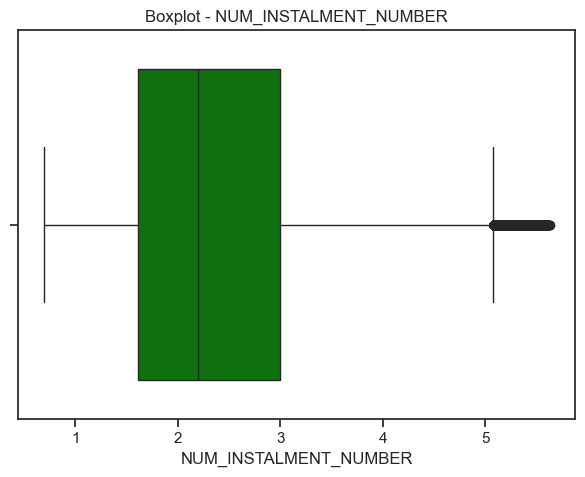

In [192]:
col = 'NUM_INSTALMENT_NUMBER'
sns.boxplot(np.log1p(instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

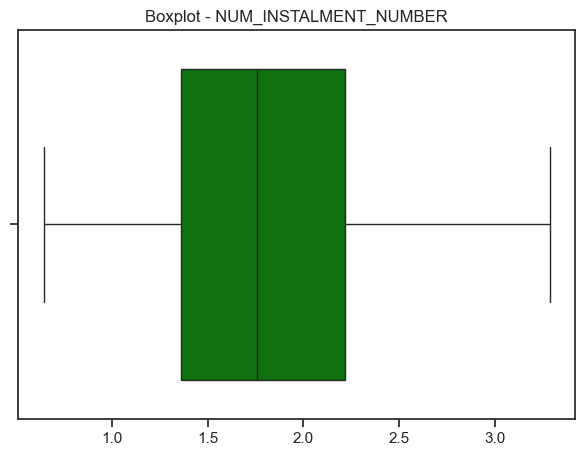

In [193]:
col = 'NUM_INSTALMENT_NUMBER'
sns.boxplot(yeojohnson(instalment_transforms[col])[0],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [194]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['NUM_INSTALMENT_NUMBER_yeojohnson'] = yeojohnson(data['NUM_INSTALMENT_NUMBER'])[0]
    data.drop(columns=['NUM_INSTALMENT_NUMBER'], inplace=True)
    return data

instalment_transforms = handling_outliers(instalment_transforms)

### DAYS_INSTALMENT

Represents the number of days when a previous credit installment was supposed to be paid, relative to the application date of the current loan. A negative value means the installment was due before the current loan application date, while a positive value indicates it was due after. This feature helps in analyzing payment schedules and potential overlaps with current loan applications.

In [195]:
instalment_transforms['DAYS_INSTALMENT'].describe()

count    1.360540e+07
mean    -1.042270e+03
std      8.009463e+02
min     -2.922000e+03
25%     -1.654000e+03
50%     -8.180000e+02
75%     -3.610000e+02
max     -1.000000e+00
Name: DAYS_INSTALMENT, dtype: float64

In [196]:
years_instalment = instalment_transforms['DAYS_INSTALMENT'] / 365
years_instalment.describe()

count    1.360540e+07
mean    -2.855534e+00
std      2.194373e+00
min     -8.005479e+00
25%     -4.531507e+00
50%     -2.241096e+00
75%     -9.890411e-01
max     -2.739726e-03
Name: DAYS_INSTALMENT, dtype: float64

In [197]:
print(f'The minimum instalment days (in years) :{years_instalment.min()}')
print(f'The maximum instalment days (in years) :{years_instalment.max()}')

print("""
The lower bound of the data is negative, which indicates that the instalment has not been paid yet. """)

The minimum instalment days (in years) :-8.005479452054795
The maximum instalment days (in years) :-0.0027397260273972603

The lower bound of the data is negative, which indicates that the instalment has not been paid yet. 


The minimum installment days show -8 years, indicating that this person has previous loans that were overdue at the time of the current application.

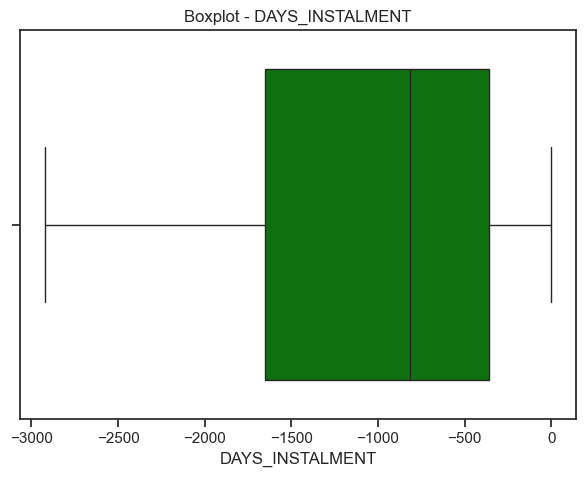

In [198]:
col = 'DAYS_INSTALMENT'
sns.boxplot((instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

No outliers found, meaning we do nothing in transforming this features.

### DAYS_ENTRY_PAYMENT

Indicates when was the installments of previous credit paid actually (relative to application date of current loan).

In [199]:
instalment_transforms['DAYS_ENTRY_PAYMENT'].describe()

count    1.360540e+07
mean    -1.051066e+03
std      8.005071e+02
min     -4.921000e+03
25%     -1.662000e+03
50%     -8.270000e+02
75%     -3.700000e+02
max     -1.000000e+00
Name: DAYS_ENTRY_PAYMENT, dtype: float64

In [200]:
years_entry_payment = instalment_transforms['DAYS_ENTRY_PAYMENT'] / 365
years_entry_payment.describe()

count    1.360540e+07
mean    -2.879632e+00
std      2.193170e+00
min     -1.348219e+01
25%     -4.553425e+00
50%     -2.265753e+00
75%     -1.013699e+00
max     -2.739726e-03
Name: DAYS_ENTRY_PAYMENT, dtype: float64

In [201]:
print(f'The minimum entry payment days (in years) :{years_entry_payment.min()}')
print(f'The maximum entry payment days (in years) :{years_entry_payment.max()}')

print("""
Negative values indicate the number of days before the application date of the current loan when the installments of a previous credit were actually paid. """)

The minimum entry payment days (in years) :-13.482191780821918
The maximum entry payment days (in years) :-0.0027397260273972603

Negative values indicate the number of days before the application date of the current loan when the installments of a previous credit were actually paid. 


The lower bound is -13, meaning the installment was paid 13 years ago. This information helps in understanding the timing of previous credit payments relative to the current loan application.

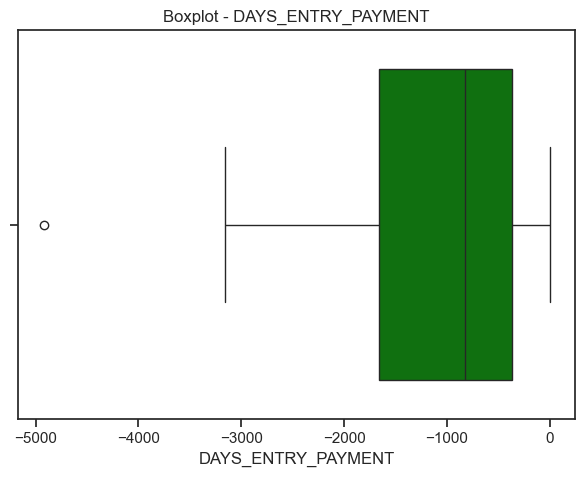

In [202]:
col = 'DAYS_ENTRY_PAYMENT'
sns.boxplot((instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

Even there is a single dot in box plot, no need to handle the outliers.

### AMT_INSTALMENT

What was the prescribed installment amount of previous credit on this installment

In [203]:
instalment_transforms['AMT_INSTALMENT'].describe()

count    1.360540e+07
mean     1.705091e+04
std      5.057025e+04
min      0.000000e+00
25%      4.226085e+03
50%      8.884080e+03
75%      1.671021e+04
max      3.771488e+06
Name: AMT_INSTALMENT, dtype: float64

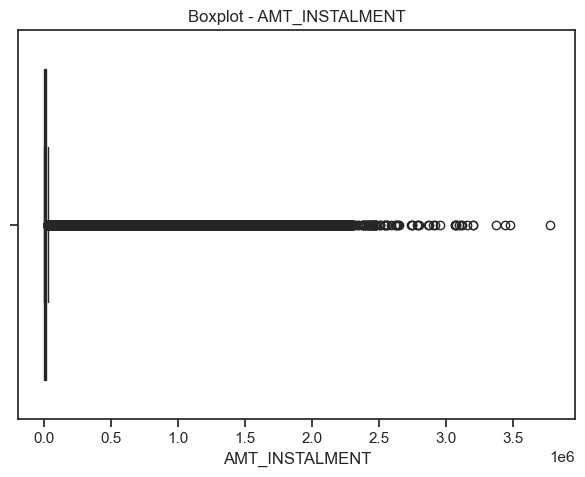

In [204]:
col = 'AMT_INSTALMENT'
sns.boxplot((instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

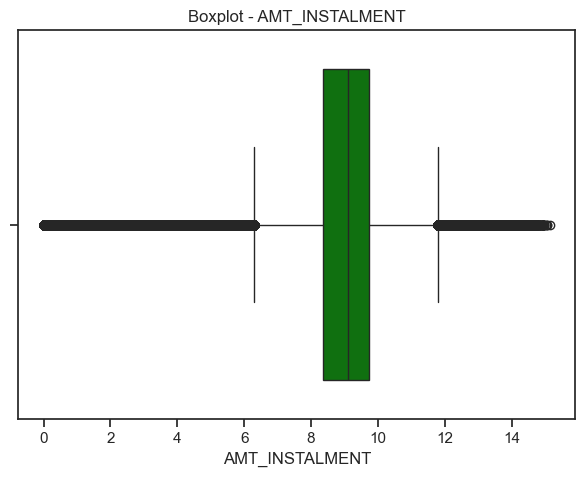

In [205]:
col = 'AMT_INSTALMENT'
sns.boxplot(np.log1p(instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

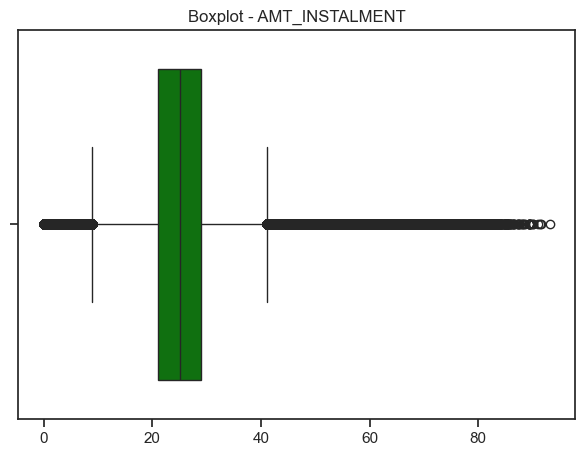

In [206]:
col = 'AMT_INSTALMENT'
sns.boxplot(yeojohnson(instalment_transforms[col])[0],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

The log transformation has less positive skewed than yeojohnson (by looking the dots in box plot) so we will use log transformation.

In [207]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['AMT_INSTALMENT_LOG'] = np.log1p(data['AMT_INSTALMENT']) 
    data.drop(columns=['AMT_INSTALMENT'], inplace=True)
    return data

instalment_transforms = handling_outliers(instalment_transforms)

### AMT_PAYMENT
What the client actually paid on previous credit on this installment

In [208]:
instalment_transforms['AMT_PAYMENT'].describe()

count    1.360540e+07
mean     1.723628e+04
std      5.473010e+04
min      0.000000e+00
25%      3.399300e+03
50%      8.125515e+03
75%      1.610591e+04
max      3.771488e+06
Name: AMT_PAYMENT, dtype: float64

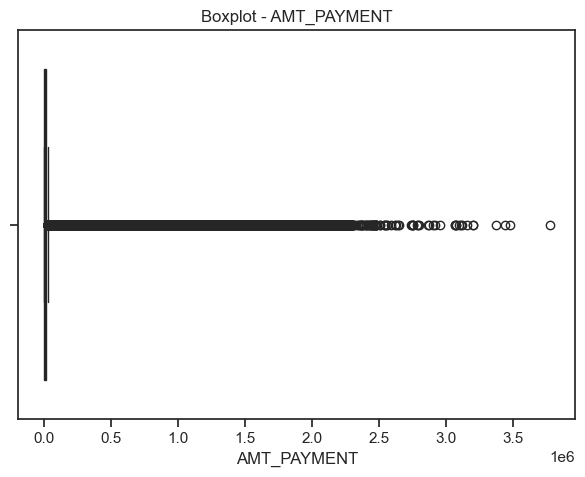

In [209]:
col = 'AMT_PAYMENT'
sns.boxplot((instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

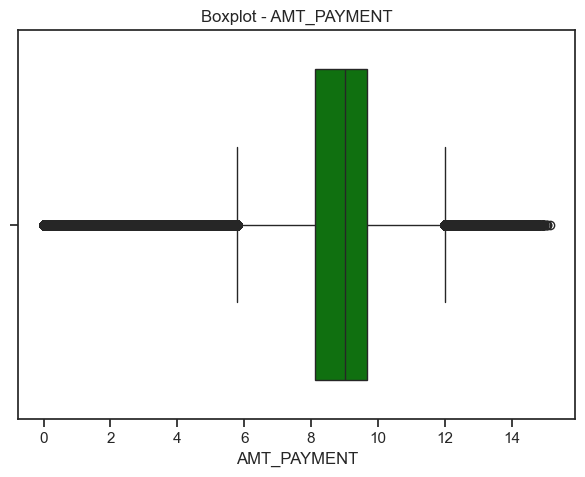

In [210]:
col = 'AMT_PAYMENT'
sns.boxplot(np.log1p(instalment_transforms[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

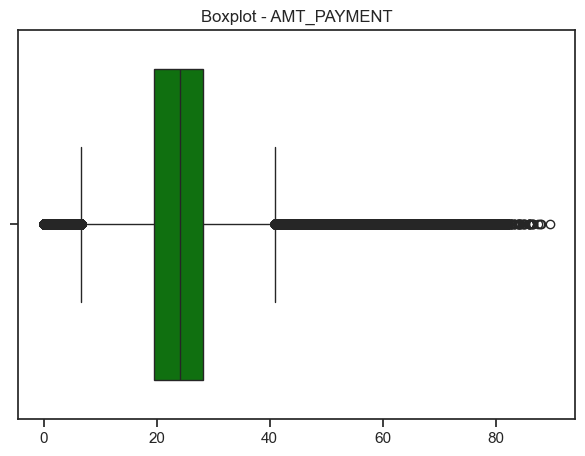

In [211]:
col = 'AMT_PAYMENT'
sns.boxplot(yeojohnson(instalment_transforms[col])[0],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [212]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['AMT_PAYMENT_LOG'] = np.log1p(data['AMT_PAYMENT']) 
    data.drop(columns=['AMT_PAYMENT'], inplace=True)
    return data

instalment_transforms = handling_outliers(instalment_transforms)

## Feature Engineering

In [213]:
# Feature Engineering
def installment_FE(data):
    # Late Payment
    data['DAYS_LATE'] = data['DAYS_ENTRY_PAYMENT'] - data['DAYS_INSTALMENT'] # Positive values indicate late payment

    # Ratio of Payment
    data['PAYMENT_RATIO'] = data['AMT_PAYMENT_LOG']/data['AMT_INSTALMENT_LOG'] # values less than 1 indicate underpayment

    # Payment Difference
    data['PAYMENT_DIFF'] = data['AMT_INSTALMENT_LOG'] - data['AMT_PAYMENT_LOG'] # If positive, it indicates underpayment

    # Time Features
    data['MONTH_INSTALMENT'] = round(data['DAYS_INSTALMENT'] / 12)
    data['MONTH_ENTRY_PAYMENT'] = round(data['DAYS_ENTRY_PAYMENT'] / 12)
    data['YEAR_INSTALLMENT'] = round(data['DAYS_INSTALMENT'] / 365)
    data['YEAR_ENTRY_PAYMENT'] = round(data['DAYS_ENTRY_PAYMENT'] / 365)

    # Flag
    data['FLAG_LATE_PAYMENT'] = (data['DAYS_LATE'] > 0).astype(int) # if positive, it indicates late payment
    data['FLAG_UNDERPAYMENT'] = (data['PAYMENT_RATIO'] > 1).astype(int) # if greater than 1, it indicates underpayment

    return data

instalment_FE = installment_FE(instalment_transforms)

In [214]:
instalment_FE.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 18 columns):
 #   Column                             Non-Null Count     Dtype  
---  ------                             --------------     -----  
 0   SK_ID_PREV                         13605401 non-null  int64  
 1   SK_ID_CURR                         13605401 non-null  int64  
 2   NUM_INSTALMENT_VERSION             13605401 non-null  float64
 3   DAYS_INSTALMENT                    13605401 non-null  float64
 4   DAYS_ENTRY_PAYMENT                 13605401 non-null  float64
 5   NUM_INSTALMENT_VERSION_yeojohnson  13605401 non-null  float64
 6   NUM_INSTALMENT_NUMBER_yeojohnson   13605401 non-null  float64
 7   AMT_INSTALMENT_LOG                 13605401 non-null  float64
 8   AMT_PAYMENT_LOG                    13605401 non-null  float64
 9   DAYS_LATE                          13605401 non-null  float64
 10  PAYMENT_RATIO                      13605399 non-null  float64
 11  PAYMENT_D

# Previous Application

In [215]:
previous_application = pd.read_csv(r'C:\Users\aldiv\Downloads\Data Analyst\Project based intern\Home Credit\Final Tasks\previous_application.csv')

In [216]:
previous_application.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [217]:
previous_application.describe()


,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115833,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [218]:
data_cleaning_suggestions(previous_application)


    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_PREV,int64,0.000000,100,1000001.000000,2845382.000000,Possible ID column: drop before modeling step.
SK_ID_CURR,int64,0.000000,20,100001.000000,456255.000000,No issue
NAME_CONTRACT_TYPE,object,0.000000,0,,,1 rare categories: ['XNA']. Group them into a single category or drop the categories.
AMT_ANNUITY,float64,22.286665,NA,0.000000,418058.145000,"372235 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 82762 outliers greater than upper bound (42163.38) or lower than lower bound(-15183.18). Cap them or remove them."
AMT_APPLICATION,float64,0.000000,NA,0.000000,6905160.000000,"Column has 208019 outliers greater than upper bound (422820.00) or lower than lower bound(-223740.00). Cap them or remove them., Column has a high correlation with ['AMT_ANNUITY']. Consider dropping one of them."
AMT_CREDIT,float64,0.000060,NA,0.000000,6905160.000000,"1 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 179989 outliers greater than upper bound (504805.50) or lower than lower bound(-264226.50). Cap them or remove them., Column has a high correlation with ['AMT_ANNUITY', 'AMT_APPLICATION']. Consider dropping one of them."
AMT_DOWN_PAYMENT,float64,53.636480,NA,-0.900000,3060045.000000,"895844 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 64402 outliers greater than upper bound (19350.00) or lower than lower bound(-11610.00). Cap them or remove them."
AMT_GOODS_PRICE,float64,23.081773,NA,0.000000,6905160.000000,"385515 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 145715 outliers greater than upper bound (508738.50) or lower than lower bound(-223897.50). Cap them or remove them., Column has a high correlation with ['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT']. Consider dropping one of them."
WEEKDAY_APPR_PROCESS_START,object,0.000000,0,,,No issue
HOUR_APPR_PROCESS_START,int64,0.000000,0,0.000000,23.000000,Column has 1639 outliers greater than upper bound (22.50) or lower than lower bound(2.50). Cap them or remove them.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
SK_ID_PREV,int64,0.000000,100,1000001.0,2845382.0,Possible ID column: drop before modeling step.
SK_ID_CURR,int64,0.000000,20,100001.0,456255.0,No issue
NAME_CONTRACT_TYPE,object,0.000000,0,,,1 rare categories: ['XNA']. Group them into a single category or drop the categories.
AMT_ANNUITY,float64,22.286665,NA,0.0,418058.145,"372235 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 82762 outliers greater than upper bound (42163.38) or lower than lower bound(-15183.18). Cap them or remove them."
AMT_APPLICATION,float64,0.000000,NA,0.0,6905160.0,"Column has 208019 outliers greater than upper bound (422820.00) or lower than lower bound(-223740.00). Cap them or remove them., Column has a high correlation with ['AMT_ANNUITY']. Consider dropping one of them."
AMT_CREDIT,float64,0.000060,NA,0.0,6905160.0,"1 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 179989 outliers greater than upper bound (504805.50) or lower than lower bound(-264226.50). Cap them or remove them., Column has a high correlation with ['AMT_ANNUITY', 'AMT_APPLICATION']. Consider dropping one of them."
AMT_DOWN_PAYMENT,float64,53.636480,NA,-0.9,3060045.0,"895844 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 64402 outliers greater than upper bound (19350.00) or lower than lower bound(-11610.00). Cap them or remove them."
AMT_GOODS_PRICE,float64,23.081773,NA,0.0,6905160.0,"385515 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 145715 outliers greater than upper bound (508738.50) or lower than lower bound(-223897.50). Cap them or remove them., Column has a high correlation with ['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT']. Consider dropping one of them."
WEEKDAY_APPR_PROCESS_START,object,0.000000,0,,,No issue
HOUR_APPR_PROCESS_START,int64,0.000000,0,0.0,23.0,Column has 1639 outliers greater than upper bound (22.50) or lower than lower bound(2.50). Cap them or remove them.


## Feature Selection

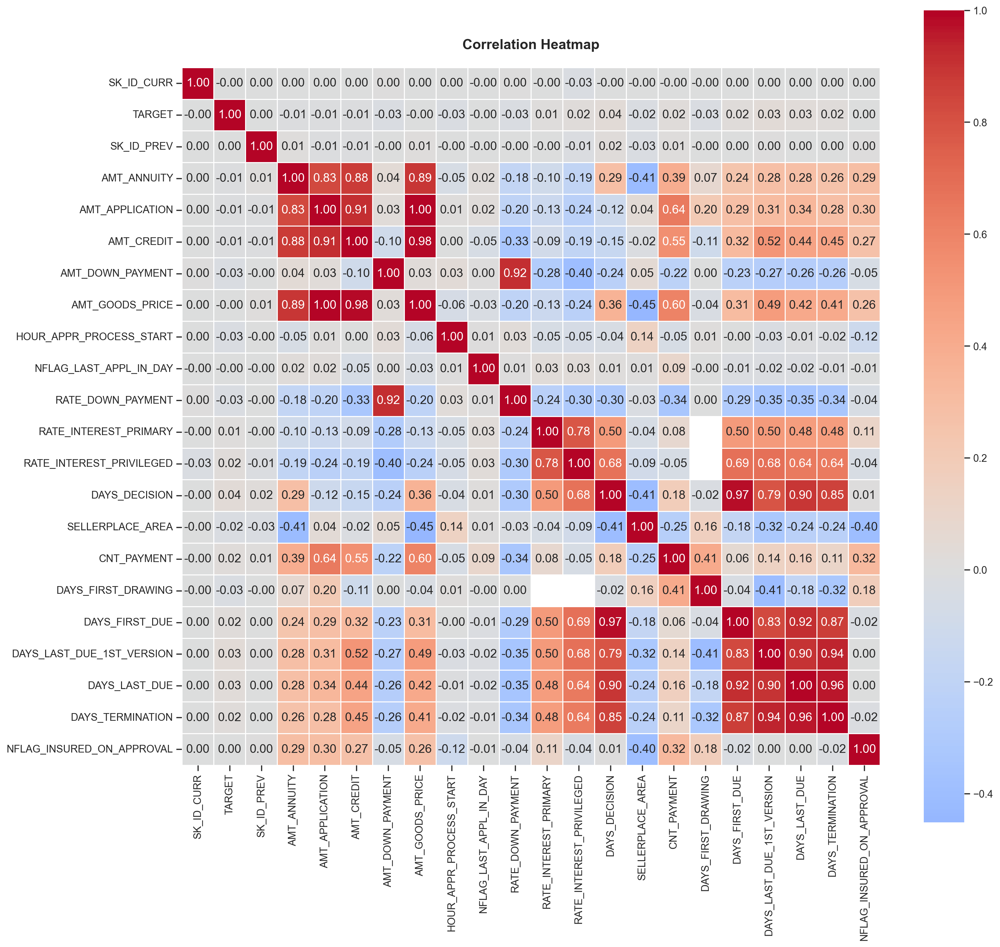


Pasangan fitur dengan korelasi tinggi (>0.7):
AMT_ANNUITY - AMT_APPLICATION: 0.83
AMT_ANNUITY - AMT_CREDIT: 0.88
AMT_ANNUITY - AMT_GOODS_PRICE: 0.89
AMT_APPLICATION - AMT_CREDIT: 0.91
AMT_APPLICATION - AMT_GOODS_PRICE: 1.00
AMT_CREDIT - AMT_GOODS_PRICE: 0.98
AMT_DOWN_PAYMENT - RATE_DOWN_PAYMENT: 0.92
RATE_INTEREST_PRIMARY - RATE_INTEREST_PRIVILEGED: 0.78
DAYS_DECISION - DAYS_FIRST_DUE: 0.97
DAYS_DECISION - DAYS_LAST_DUE_1ST_VERSION: 0.79
DAYS_DECISION - DAYS_LAST_DUE: 0.90
DAYS_DECISION - DAYS_TERMINATION: 0.85
DAYS_FIRST_DUE - DAYS_LAST_DUE_1ST_VERSION: 0.83
DAYS_FIRST_DUE - DAYS_LAST_DUE: 0.92
DAYS_FIRST_DUE - DAYS_TERMINATION: 0.87
DAYS_LAST_DUE_1ST_VERSION - DAYS_LAST_DUE: 0.90
DAYS_LAST_DUE_1ST_VERSION - DAYS_TERMINATION: 0.94
DAYS_LAST_DUE - DAYS_TERMINATION: 0.96


In [219]:
%matplotlib inline
previous_target = data_final[['SK_ID_CURR', 'TARGET']]
previous_target = previous_target.merge(previous_application, on='SK_ID_CURR', how='left')

numerical_cols = previous_target.select_dtypes(['float64', 'int64']).columns
plt.figure(figsize=(15, 15),dpi=200)
correlation_matrix = previous_target[numerical_cols].corr(method='spearman')
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f', square=True, linewidths=0.5, annot_kws={'size': 13},
            xticklabels=correlation_matrix.columns, yticklabels=correlation_matrix.columns)
plt.title('Correlation Heatmap', pad = 20, fontweight='bold', fontsize = 15)
#plt.tight_layout()
plt.show()
plt.close()

threshold = 0.7
high_corr_features = np.where(np.abs(correlation_matrix) > threshold)
high_corr_features = [(correlation_matrix.index[x], correlation_matrix.columns[y], correlation_matrix.iloc[x,y]) 
                      for x, y in zip(*high_corr_features) if x != y and x < y]

print("\nPasangan fitur dengan korelasi tinggi (>0.7):")
for feat1, feat2, corr in high_corr_features:
    print(f"{feat1} - {feat2}: {corr:.2f}")

No features has good correlation with the TARGET but some features has a correlation and multicollinearity on other features. We will considering to drop multicollinearity features for Logistic Regression models and to reducing number of features.

In [220]:
previous_application_select = previous_application.drop(columns=['AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'DAYS_LAST_DUE_1ST_VERSION'])

In [221]:
from scipy.stats import chi2_contingency

def chi_square_test(df, feature, target='TARGET'):
    contingency_table = pd.crosstab(df[feature], df[target])
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    return feature, chi2, p_value, dof

categorical_features = previous_target.select_dtypes(include=['object']).columns.tolist()
# categorical_features.remove('TARGET')

# Lakukan uji Chi-Square untuk setiap fitur kategorikal
results = []    
for feature in categorical_features:
    results.append(chi_square_test(previous_target, feature))

# Buat DataFrame dari hasil dan urutkan berdasarkan p-value
results_df = pd.DataFrame(results, columns=['Feature', 'Chi-Square', 'p-value', 'DoF'])
results_df = results_df.sort_values('p-value')

# Tampilkan hasil
print("Chi-Square Test Results for Categorical Features vs TARGET:")
print(results_df.to_string(index=False))

Chi-Square Test Results for Categorical Features vs TARGET:
          Feature            Chi-Square     p-value    DoF
         NAME_CONTRACT_TYPE 1592.910514  0.000000e+00   3 
     NAME_CASH_LOAN_PURPOSE 1725.381473  0.000000e+00  24 
         CODE_REJECT_REASON 5522.266810  0.000000e+00   8 
       NAME_CONTRACT_STATUS 4774.600557  0.000000e+00   3 
               CHANNEL_TYPE 2004.884072  0.000000e+00   7 
          NAME_PRODUCT_TYPE 2604.932176  0.000000e+00   2 
             NAME_PORTFOLIO 1598.568100  0.000000e+00   4 
        NAME_GOODS_CATEGORY 1931.364855  0.000000e+00  26 
           NAME_YIELD_GROUP 2501.736858  0.000000e+00   4 
       NAME_SELLER_INDUSTRY 1863.468644  0.000000e+00  10 
        PRODUCT_COMBINATION 4608.799417  0.000000e+00  16 
          NAME_PAYMENT_TYPE  973.431648 1.043618e-210   3 
           NAME_CLIENT_TYPE  291.852611  5.767839e-63   3 
            NAME_TYPE_SUITE  236.007140  3.997804e-48   6 
 WEEKDAY_APPR_PROCESS_START  117.003534  6.936779e-23  

All of categorical features has p-value under 5%, meaning they have correaltion with the TARGET but since the features are so many, we will drop some features with Chi-squared score under 1.000 (NAME_PAYMENT_TYPE, NAME_CLIENT_TYPE, WEEKDAY_APPR_PROCESS_START, and FLAG_LAST_APPL_PER_CONTRACT). Some features has high DoF and we will considering to drop PRODUCT_COMBINATION and aggregating values of NAME_CASH_LOAN_PURPOSE, NAME_GOODS_CATEGORY, and NAME_SELLER_INDUSTRY.

In [222]:
previous_application_select = previous_application_select.drop(columns=['NAME_PAYMENT_TYPE', 'NAME_CLIENT_TYPE', 
                                                                        'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT'])

## handling Null Value

In [223]:
previous_clean = previous_application_select.copy() 

In [224]:
# List of common missing value strings
missing_values_set = [
    'NA', 'N/A', 'null', 'NaN','nan', 'XNA', 'None', 'empty', 'undefined', 'unknown', 'Unknown',
    '--', 'not available', '',' ','  ','   ', 'missing', 'unavailable', 'not applicable',
    'not found', 'no data', 'no value', 'n/a', 'none', 'null value', 'unknown value', 'blank', 'invalid', 'error',
    'unassigned', 'uninitialized', 'void', 'undisclosed', 'unreported', 'empty string',
    'na', 'not recorded', 'unanswered', 'not specified', 'unobserved', 'unpopulated',
    'none of the above', 'does not apply', 'ignored', 'unspecified', 'unfilled', 'inapplicable',
    'unavailable value', 'not entered', 'missing value', 'data not available', 'data missing',
    'not inputted', 'not given', 'unrecorded', 'unfurnished', 'undocumented', 'not listed',
    'unsupplied', 'empty field', 'unfilled field', 'unanswered question', 'no response',
    'not provided', 'not reported', 'unanswered', 'unacknowledged', 'no information',
    'no response recorded', 'no submission', 'no entry', 'not logged', 'unverified',
    'unobserved value', 'data absent', 'absence', 'unfilled cell', 'undefined data',
    'does not exist', 'not found', 'missing data', 'no answer', 'unavailable information',
    'no input', 'data error', 'unseen', 'unviewed', 'not selected', 'irrelevant',
    'skipped', 'no response given', 'no feedback', 'failed', 'discarded', 'no record',
    'unfetched', 'not completed', 'not finished', 'not updated', 'forgotten', 'rejected',
    'unsupplied data', 'data void', 'undetermined', 'not checked', 'not applicable here',
    'unattended', 'data missing', 'nonexistent', 'unsubscribed', 'denied', 'unaccepted',
    'unwitnessed', 'discarded entry', 'rejected data', 'unapplicable', 'non-populated',
    'unapplicable field', 'lost', 'absent data', 'no match', 'no result'
]

# Optimized function to replace missing-like values with NaN
def replace_missing_with_null(df, missing_values_set):
    # Select object type columns
    df_object_columns = df.select_dtypes(include=['object'])

    # Replace missing-like values with NaN
    for col in df_object_columns.columns:
        # Vectorized replacement of missing-like values with NaN
        df[col] = df[col].apply(lambda x: np.nan if str(x).strip() in missing_values_set else x)

    return df

bureau = replace_missing_with_null(previous_clean, missing_values_set)

In [225]:
# # Check null value (data) after handling null value
null_analysis = check_null_percentage(previous_clean)
print("Total rows in dataset:", len(previous_clean))
print("\nNull Value Analysis:")
print(null_analysis)

Total rows in dataset: 1670214

Null Value Analysis:
                           Total_Null  Null_Percentage
RATE_INTEREST_PRIMARY        1664263        99.64     
RATE_INTEREST_PRIVILEGED     1664263        99.64     
NAME_PRODUCT_TYPE            1063666        63.68     
NAME_GOODS_CATEGORY           950809        56.93     
RATE_DOWN_PAYMENT             895844        53.64     
AMT_DOWN_PAYMENT              895844        53.64     
NAME_SELLER_INDUSTRY          855720        51.23     
NAME_TYPE_SUITE               820405        49.12     
NAME_CASH_LOAN_PURPOSE        677918        40.59     
DAYS_FIRST_DRAWING            673065        40.30     
DAYS_TERMINATION              673065        40.30     
DAYS_LAST_DUE                 673065        40.30     
DAYS_FIRST_DUE                673065        40.30     
NFLAG_INSURED_ON_APPROVAL     673065        40.30     
NAME_YIELD_GROUP              517215        30.97     
CNT_PAYMENT                   372230        22.29     
NAME_PORTFOL

Some features have more than 60% missing values. Instead of filling these with the median or zero, which might distort the data and lead to misinterpretation, we will remove these features. For features with missing values between 20% and 60%, we will fill the gaps with zeros to avoid losing too much data but for some categorical data will be analyzed further on step feature encoding. For those with less than 20% missing values, we will drop the rows to streamline the dataset. Specifically, we plan to drop rows for the features AMT_ANNUITY, NAME_PORTFOLIO, and CNT_PAYMENT.

In [226]:
def handling_na(data):
    data = data.copy()
    # Drop features with high missing values
    data = data.drop(columns=['RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'NAME_PRODUCT_TYPE'])

    # Fill missing values with zero
    columns_fill_zero = ['AMT_DOWN_PAYMENT', 'RATE_DOWN_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_TERMINATION', 
                         'DAYS_LAST_DUE', 'DAYS_FIRST_DUE', 'NFLAG_INSURED_ON_APPROVAL']
    data[columns_fill_zero] = data[columns_fill_zero].fillna(0)

    # Drop rows under 20% missing values
    data = data.dropna(subset=['CNT_PAYMENT', 'NAME_PORTFOLIO', 'AMT_ANNUITY', 'CODE_REJECT_REASON', 'NAME_CONTRACT_TYPE', 'PRODUCT_COMBINATION', 'AMT_CREDIT'])
    return data

previous_clean = handling_na(previous_clean)

In [227]:
# # Check null value (data) after handling null value
null_analysis = check_null_percentage(previous_clean)
print("Total rows in dataset:", len(previous_clean))
print("\nNull Value Analysis:")
print(null_analysis)

Total rows in dataset: 1294598

Null Value Analysis:
                        Total_Null  Null_Percentage
NAME_GOODS_CATEGORY       611841         47.26     
NAME_SELLER_INDUSTRY      520758         40.23     
NAME_TYPE_SUITE           456920         35.29     
NAME_CASH_LOAN_PURPOSE    391036         30.21     
NAME_YIELD_GROUP          143588         11.09     


The remaining features will be handled on step Feature Encoding.

## Handling Duplicated Data

In [228]:
print(f'Total duplicated rows in previous_application: {previous_clean.duplicated().sum()}')

Total duplicated rows in previous_application: 0


There is no duplicated data.

## Handling Outliers

In [229]:
previous_transform = previous_clean.copy()

### AMT_ANNUITY

Annuity of previous application


In [230]:
previous_transform['AMT_ANNUITY'].describe()

count    1.294598e+06
mean     1.594826e+04
std      1.477845e+04
min      0.000000e+00
25%      6.320835e+03
50%      1.125000e+04
75%      2.064690e+04
max      4.180581e+05
Name: AMT_ANNUITY, dtype: float64

In [231]:
previous_transform.sort_values(by=['AMT_ANNUITY'], ascending=False).head(5)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,RATE_DOWN_PAYMENT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
516560,2501351,238970,Cash loans,418058.145,2250000.0,2369070.0,0.0,0.000000,Repairs,Refused,-1399,HC,Unaccompanied,NaN,Cash,Credit and cash offices,-1,NaN,6.0,low_action,Cash Street: low,0.0,0.0,0.0,0.0,0.0
911948,1225459,365299,Cash loans,418058.145,2250000.0,2369070.0,0.0,0.000000,Repairs,Refused,-1554,HC,Unaccompanied,NaN,Cash,Credit and cash offices,-1,NaN,6.0,low_action,Cash Street: low,0.0,0.0,0.0,0.0,0.0
79406,1065968,406936,Cash loans,417927.645,2250000.0,2369070.0,0.0,0.000000,Other,Refused,-1639,HC,Unaccompanied,NaN,Cash,Credit and cash offices,-1,NaN,6.0,low_action,Cash Street: low,0.0,0.0,0.0,0.0,0.0
557857,1314599,327696,Cash loans,417927.645,2250000.0,2369070.0,0.0,0.000000,Repairs,Refused,-1344,HC,Unaccompanied,NaN,Cash,Credit and cash offices,-1,NaN,6.0,low_action,Cash Street: low,0.0,0.0,0.0,0.0,0.0
1041292,1439030,291908,Consumer loans,393868.665,3066853.5,2176551.0,920056.5,0.323588,XAP,Approved,-428,XAP,Unaccompanied,Furniture,POS,Stone,100,Furniture,6.0,low_normal,POS industry with interest,365243.0,-397.0,-247.0,-239.0,0.0


By looking at the AMT_CREDIT, it is reasonable if AMT_ANNUITY is high. Meaning, no need to drop the outliers

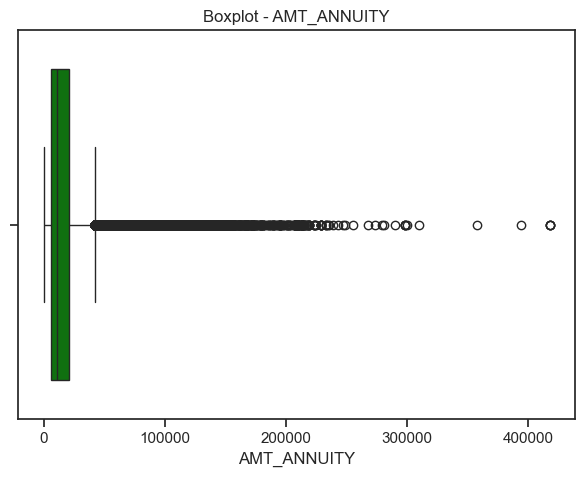

In [232]:
col = 'AMT_ANNUITY'
sns.boxplot((previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

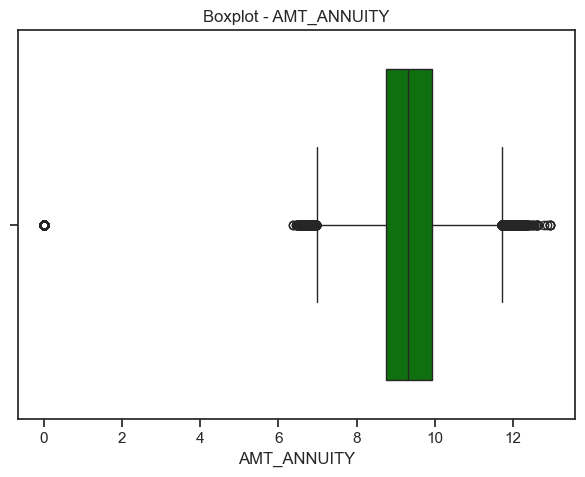

In [233]:
col = 'AMT_ANNUITY'
sns.boxplot(np.log1p(previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

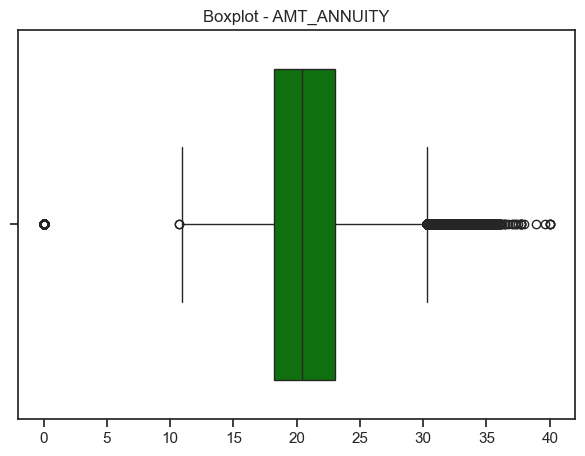

In [234]:
col = 'AMT_ANNUITY'
sns.boxplot(yeojohnson(previous_transform[col])[0],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [235]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['AMT_ANNUITY_LOG'] = np.log1p(data['AMT_ANNUITY']) 
    data.drop(columns=['AMT_ANNUITY'], inplace=True)
    return data

previous_transform = handling_outliers(previous_transform)

### AMT_APPLICATION

For how much credit did client ask on the previous application

In [236]:
previous_transform['AMT_APPLICATION'].describe()

count    1.294598e+06
mean     2.229713e+05
std      3.150136e+05
min      0.000000e+00
25%      4.536450e+04
50%      1.079100e+05
75%      2.295000e+05
max      5.850000e+06
Name: AMT_APPLICATION, dtype: float64

In [237]:
previous_clean.sort_values(by=['AMT_APPLICATION'], ascending=False).head(5)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,RATE_DOWN_PAYMENT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1058067,1227516,346243,Consumer loans,103498.650,5850000.0,4095000.0,1755000.0,0.326727,XAP,Approved,-2475,XAP,NaN,NaN,Cars,Car dealer,754,Industry,60.0,low_action,POS industry with interest,0.0,0.0,0.0,0.0,0.0
1163698,1942241,346243,Consumer loans,113979.690,5850000.0,4509688.5,1755000.0,0.305100,XAP,Approved,-2474,XAP,NaN,NaN,Cars,Car dealer,754,Industry,60.0,low_action,POS industry with interest,365243.0,-2443.0,-1513.0,-1505.0,1.0
1348406,1305961,324681,Consumer loans,83707.830,5085000.0,3051000.0,2034000.0,0.435636,XAP,Approved,-2629,XAP,NaN,NaN,Cars,Car dealer,2048,Industry,72.0,low_normal,POS industry with interest,365243.0,-2598.0,-2598.0,-2591.0,0.0
1245539,1178152,173326,Consumer loans,119443.005,4455000.0,4009500.0,445500.0,0.108909,XAP,Refused,-992,VERIF,NaN,NaN,Cars,Car dealer,250,Industry,48.0,low_action,POS industry with interest,0.0,0.0,0.0,0.0,0.0
412254,2214469,285405,Consumer loans,82672.830,4237875.0,2293753.5,2118937.5,0.522972,XAP,Approved,-2556,XAP,NaN,NaN,Cars,Car dealer,200,Industry,36.0,low_action,POS industry with interest,365243.0,-2524.0,-1534.0,-1530.0,0.0


Judging by AMT_CREDIT, the gap is not too wide so this outliers is not an anomaly.

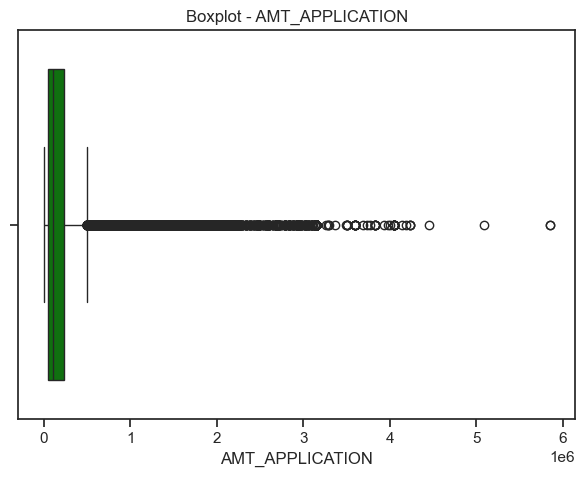

In [238]:
col = 'AMT_APPLICATION'
sns.boxplot((previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

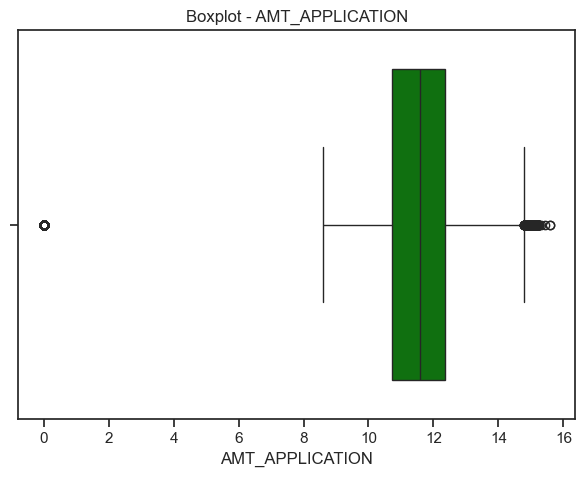

In [239]:
col = 'AMT_APPLICATION'
sns.boxplot(np.log1p(previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [240]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['AMT_APPLICATION_LOG'] = np.log1p(data['AMT_APPLICATION']) 
    data.drop(columns=['AMT_APPLICATION'], inplace=True)
    return data

previous_transform = handling_outliers(previous_transform)

### AMT_CREDIT

In [241]:
previous_transform['AMT_CREDIT'].describe()

count    1.294598e+06
mean     2.496825e+05
std      3.416713e+05
min      0.000000e+00
25%      5.276700e+04
50%      1.199043e+05
75%      2.720880e+05
max      4.509688e+06
Name: AMT_CREDIT, dtype: float64

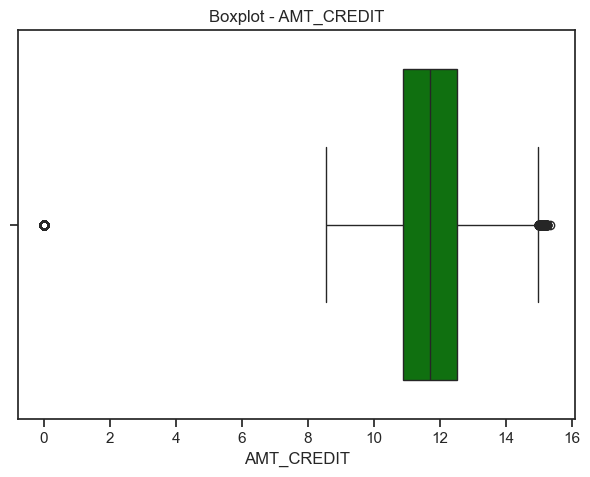

In [242]:
col = 'AMT_CREDIT'
sns.boxplot(np.log1p(previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [243]:
def handling_outliers(data):
    data = data.copy()
    # Feature Transform
    data['AMT_CREDIT_LOG'] = np.log1p(data['AMT_CREDIT']) 
    data.drop(columns=['AMT_CREDIT'], inplace=True)
    return data

previous_transform = handling_outliers(previous_transform)

### AMT_DOWN_PAYMENT

Down payment on the previous application

In [244]:
previous_transform['AMT_DOWN_PAYMENT'].describe()

count    1.294598e+06
mean     4.003976e+03
std      1.650490e+04
min     -9.000000e-01
25%      0.000000e+00
50%      0.000000e+00
75%      3.375000e+03
max      3.060045e+06
Name: AMT_DOWN_PAYMENT, dtype: float64

In [245]:
previous_clean.sort_values(by=['AMT_DOWN_PAYMENT'], ascending=True).head(5)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,RATE_DOWN_PAYMENT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
368107,1284109,350530,Consumer loans,7866.090,71580.60,71581.5,-0.90,-0.000014,XAP,Approved,-508,XAP,NaN,Mobile,POS,Country-wide,45,Connectivity,10.0,low_normal,POS mobile without interest,365243.0,-459.0,-189.0,-185.0,0.0
1519595,1817983,133068,Consumer loans,3595.545,32719.05,32719.5,-0.45,-0.000015,XAP,Approved,-478,XAP,NaN,Mobile,POS,Country-wide,45,Connectivity,10.0,low_normal,POS mobile without interest,365243.0,-430.0,-430.0,-415.0,0.0
85,1981960,306707,Cash loans,10678.005,225000.00,269550.0,0.00,0.000000,Building a house or an annex,Refused,-13,SCOFR,Unaccompanied,NaN,Cash,Credit and cash offices,-1,NaN,36.0,low_normal,Cash Street: low,0.0,0.0,0.0,0.0,0.0
87,1009986,360684,Consumer loans,11451.735,57600.00,60642.0,0.00,0.000000,XAP,Approved,-693,XAP,Unaccompanied,Furniture,POS,Stone,95,Furniture,6.0,middle,POS industry with interest,365243.0,-662.0,-512.0,-506.0,0.0
93,2522811,120854,Revolving loans,33750.000,0.00,675000.0,0.00,0.000000,XAP,Approved,-879,XAP,NaN,NaN,Cards,Credit and cash offices,-1,NaN,0.0,NaN,Card X-Sell,-332.0,-297.0,365243.0,365243.0,0.0


In [246]:
threshold = previous_transform['AMT_DOWN_PAYMENT'].quantile(1e-5)
data_under_quantile = previous_transform[(previous_transform['AMT_DOWN_PAYMENT'] <= threshold)]
data_under_quantile['AMT_DOWN_PAYMENT'].sort_values(ascending=False)

1670213    0.00
0          0.00
1          0.00
2          0.00
3          0.00
           ... 
17         0.00
18         0.00
19         0.00
1519595   -0.45
368107    -0.90
Name: AMT_DOWN_PAYMENT, Length: 890182, dtype: float64

The amount of Down Payment is supposed not in negative values so this might be an anomaly that must be handled (Although the negative value can be considered as refund but we choose to claim this is an anomaly).

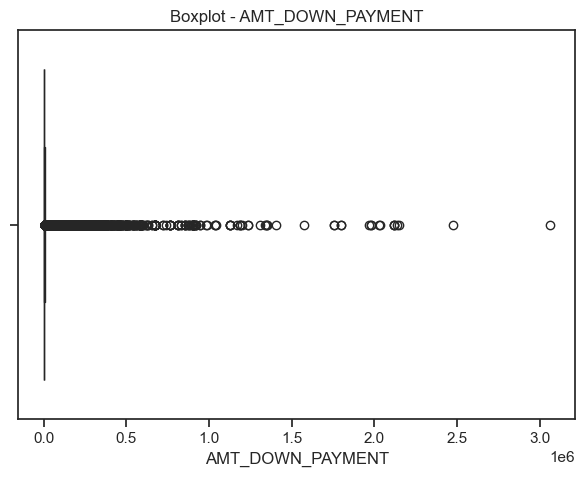

In [247]:
threshold = previous_transform['AMT_DOWN_PAYMENT'].quantile(1e-6)
data_under_quantile = previous_transform[(previous_transform['AMT_DOWN_PAYMENT'] > threshold)]

col = 'AMT_DOWN_PAYMENT'
sns.boxplot((data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

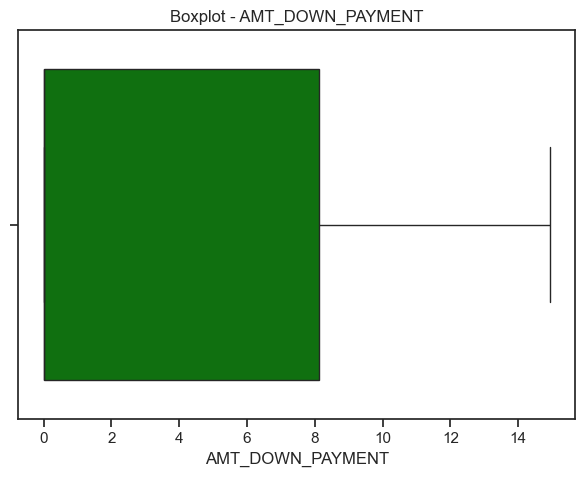

In [248]:
threshold = previous_transform['AMT_DOWN_PAYMENT'].quantile(1e-6)
data_under_quantile = previous_transform[(previous_transform['AMT_DOWN_PAYMENT'] > threshold)]

col = 'AMT_DOWN_PAYMENT'
sns.boxplot(np.log1p(data_under_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [249]:
def handling_outliers(data):
    data = data.copy()
    threshold = data['AMT_DOWN_PAYMENT'].quantile(1e-6)
    data = data[data['AMT_DOWN_PAYMENT'] > threshold]
    
    # Feature Transform
    data['AMT_DOWN_PAYMENT_LOG'] = np.log1p(data['AMT_DOWN_PAYMENT']) 
    data.drop(columns=['AMT_DOWN_PAYMENT'], inplace=True)
    return data

previous_transform = handling_outliers(previous_transform)

### RATE_DOWN_PAYMENT

Down payment rate normalized on previous credit

In [250]:
previous_transform['RATE_DOWN_PAYMENT'].describe()

count    1.294596e+06
mean     4.762289e-02
std      9.206976e-02
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      1.000219e-01
max      1.000000e+00
Name: RATE_DOWN_PAYMENT, dtype: float64

The values are not strange which is no outliers in this data

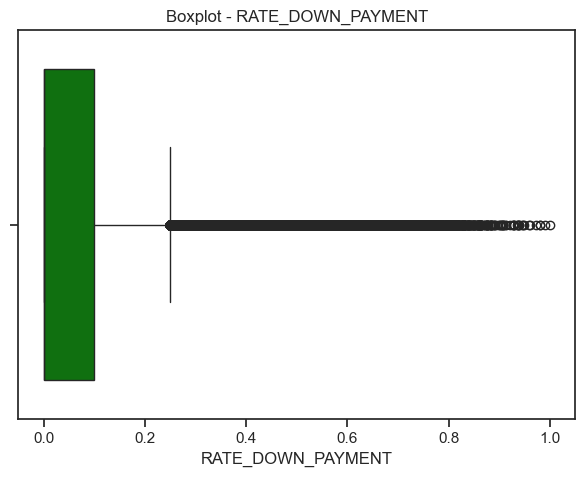

In [251]:
col = 'RATE_DOWN_PAYMENT'
sns.boxplot((previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

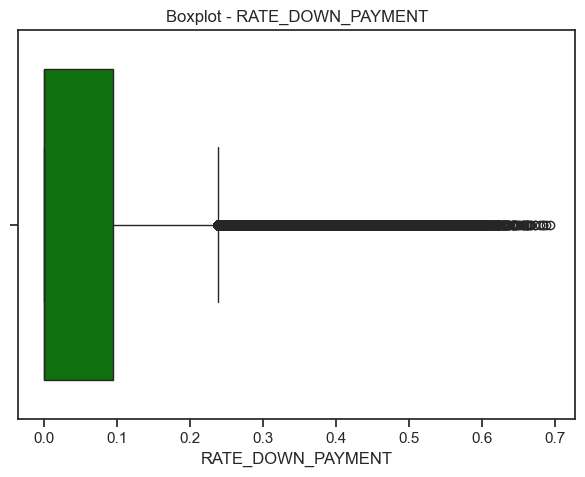

In [252]:
col = 'RATE_DOWN_PAYMENT'
sns.boxplot(np.log1p(previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

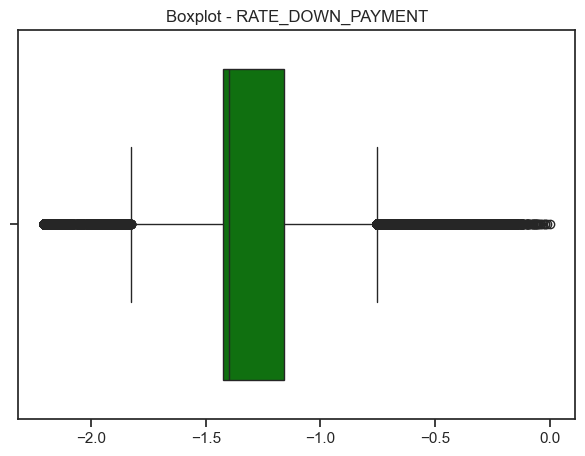

In [253]:
from scipy.stats import boxcox

col = 'RATE_DOWN_PAYMENT'
positive_data = previous_transform[previous_transform[col] > 0][col]
sns.boxplot(boxcox(positive_data)[0], color='green', orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [254]:
from scipy.stats import boxcox

def handling_outliers(data):
    data = data.copy()
    
    # Check if 'RATE_DOWN_PAYMENT' column exists
    if 'RATE_DOWN_PAYMENT' in data.columns:
        # Feature Transform
        positive_data = data[data['RATE_DOWN_PAYMENT'] > 0]['RATE_DOWN_PAYMENT']
        transformed_data, _ = boxcox(positive_data)
        data.loc[data['RATE_DOWN_PAYMENT'] > 0, 'RATE_DOWN_PAYMENT_boxcox'] = transformed_data
        data.drop(columns=['RATE_DOWN_PAYMENT'], inplace=True)
    else:
        print("Column 'RATE_DOWN_PAYMENT' does not exist in the DataFrame.")
    
    return data

previous_transform = handling_outliers(previous_transform)

### DAYS_DECISION

Relative to current application when was the decision about previous application made

In [255]:
previous_transform['DAYS_DECISION'].describe()

count    1.294596e+06
mean    -1.042267e+03
std      7.949034e+02
min     -2.922000e+03
25%     -1.560000e+03
50%     -7.860000e+02
75%     -3.990000e+02
max     -1.000000e+00
Name: DAYS_DECISION, dtype: float64

In [256]:
years_decision = previous_transform['DAYS_DECISION'] / 365
years_decision.describe()

count    1.294596e+06
mean    -2.855525e+00
std      2.177818e+00
min     -8.005479e+00
25%     -4.273973e+00
50%     -2.153425e+00
75%     -1.093151e+00
max     -2.739726e-03
Name: DAYS_DECISION, dtype: float64

In [257]:
print(f'The minimum decision days (in years) :{years_decision.min()}')
print(f'The maximum decision days (in years) :{years_decision.max()}')

The minimum decision days (in years) :-8.005479452054795
The maximum decision days (in years) :-0.0027397260273972603


The minimum values shows that this person submitted a loan application 8 years ago which is no anomaly found in DAYS_DECISION.

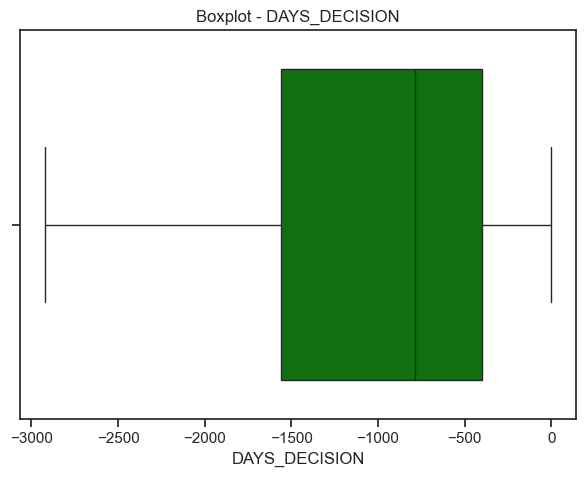

In [258]:
col = 'DAYS_DECISION'
sns.boxplot((previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

The data is normal distributed so no need feature transformation.

### SELLERPLACE_AREA

Selling area of seller place of the previous application.

In [ ]:
previous_transform['SELLERPLACE_AREA'].describe()

count    1.294596e+06
mean     3.970072e+02
std      8.092187e+03
min     -1.000000e+00
25%     -1.000000e+00
50%      2.500000e+01
75%      1.420000e+02
max      4.000000e+06
Name: SELLERPLACE_AREA, dtype: float64

SELERPLACE_AREA should be a code of area for seller, meaning these integers value is categorical, not numerical.

### CNT_PAYMENT

Term of previous credit at application of the previous application

In [260]:
previous_transform['CNT_PAYMENT'].describe()

count    1.294596e+06
mean     1.603930e+01
std      1.453377e+01
min      0.000000e+00
25%      6.000000e+00
50%      1.200000e+01
75%      2.400000e+01
max      8.400000e+01
Name: CNT_PAYMENT, dtype: float64

In [261]:
previous_transform['CNT_PAYMENT'].unique()

array([12., 36., 24., 18., 54., 30.,  8.,  3.,  6.,  0., 48., 10., 60.,
       42.,  4.,  5., 16., 20.,  7., 14.,  9., 22., 15., 11., 13., 17.,
       26., 23., 38., 33., 72., 59., 84., 28., 41., 66., 29., 32., 44.,
       39., 40., 46., 35., 19., 47., 45., 21., 53., 34.])

In [262]:
previous_clean.sort_values(by=['CNT_PAYMENT'], ascending=False).head(5)


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,RATE_DOWN_PAYMENT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1088844,1341440,145047,Cash loans,28547.460,1287000.00,1287000.00,0.0,0.0,NaN,Refused,-6,VERIF,Unaccompanied,NaN,Cash,Credit and cash offices,0,NaN,84.0,low_action,Cash X-Sell: low,0.0,0.0,0.0,0.0,0.0
535941,1478237,275886,Cash loans,25020.495,873639.99,873639.99,0.0,0.0,NaN,Refused,-188,VERIF,Family,NaN,Cash,Credit and cash offices,-1,NaN,84.0,low_normal,Cash Street: low,0.0,0.0,0.0,0.0,0.0
836801,1608977,172132,Cash loans,23051.520,1044000.00,1044000.00,0.0,0.0,NaN,Refused,-26,HC,Unaccompanied,NaN,Cash,Credit and cash offices,-1,NaN,84.0,low_action,Cash X-Sell: low,0.0,0.0,0.0,0.0,0.0
1346418,1089416,232520,Cash loans,44166.555,1381500.00,1381500.00,0.0,0.0,NaN,Refused,-3,VERIF,Unaccompanied,NaN,Cash,Credit and cash offices,-1,NaN,84.0,middle,Cash X-Sell: middle,0.0,0.0,0.0,0.0,0.0
1103196,1068582,190560,Cash loans,26538.435,931500.00,931500.00,0.0,0.0,NaN,Refused,-8,VERIF,Unaccompanied,NaN,Cash,Credit and cash offices,-1,NaN,84.0,low_normal,Cash X-Sell: low,0.0,0.0,0.0,0.0,0.0


We think there is no anomaly in this features. The maximum values is 84, meaning the person has loan with term 84 months. By looking at the amount of credit dan annuity, this person loan with credit 1.287.000 with annuity 2.8547,460 and the total payment that home credit will receive is 2.8547,460 * 84 = 2.397.986,64

In [263]:
initial_value = 1287000
final_value = 2397986.64

percentage_increase = ((final_value - initial_value) / initial_value) * 100
print(f'The Home Credit Profit is {percentage_increase:.2f}%')

The Home Credit Profit is 86.32%


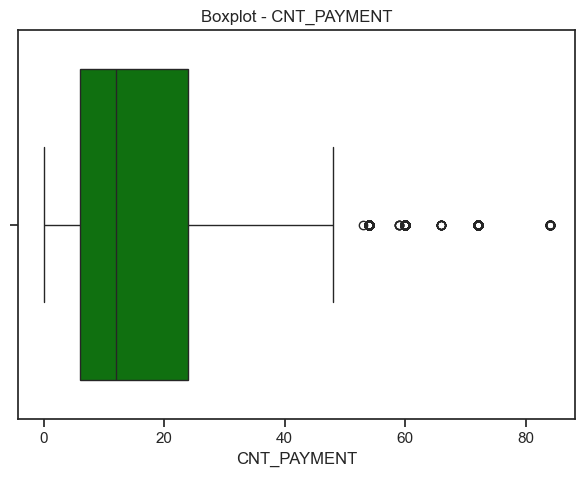

In [264]:
col = 'CNT_PAYMENT'
sns.boxplot((previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

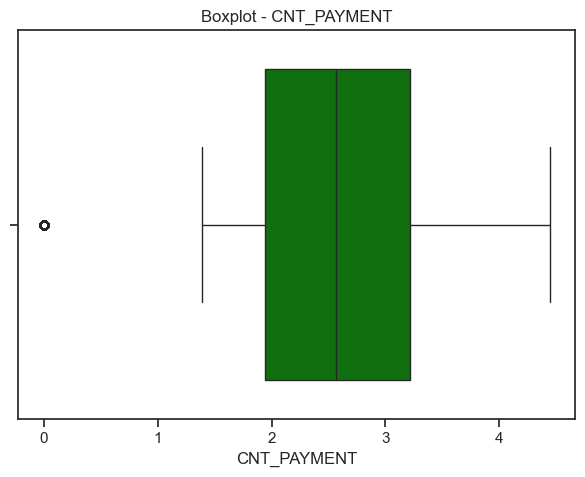

In [265]:
col = 'CNT_PAYMENT'
sns.boxplot(np.log1p(previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [266]:
def handling_outliers(data):
    data = data.copy()
    
    # Feature Transform
    data['CNT_PAYMENT_LOG'] = np.log1p(data['CNT_PAYMENT']) 
    data.drop(columns=['CNT_PAYMENT'], inplace=True)
    return data

previous_transform = handling_outliers(previous_transform)

### DAYS_FIRST_DRAWING

Relative to application date of current application when was the first disbursement of the previous application. Essentially, it's asking how long it took for the borrower to receive the funds from the previous loan after applying.

In [267]:
previous_transform['DAYS_FIRST_DRAWING'].describe()

count    1.294596e+06
mean     2.635796e+05
std      1.637523e+05
min     -2.922000e+03
25%      0.000000e+00
50%      3.652430e+05
75%      3.652430e+05
max      3.652430e+05
Name: DAYS_FIRST_DRAWING, dtype: float64

In [268]:
previous_transform['DAYS_FIRST_DRAWING'].value_counts()

DAYS_FIRST_DRAWING
 365243.0    934430
 0.0         297461
-228.0          123
-212.0          121
-224.0          121
              ...  
-1941.0           1
-1842.0           1
-1611.0           1
-1770.0           1
-1879.0           1
Name: count, Length: 2839, dtype: int64

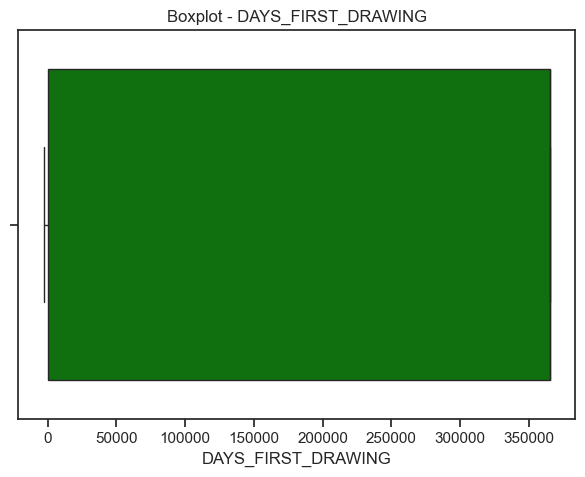

In [269]:
col = 'DAYS_FIRST_DRAWING'
sns.boxplot((previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

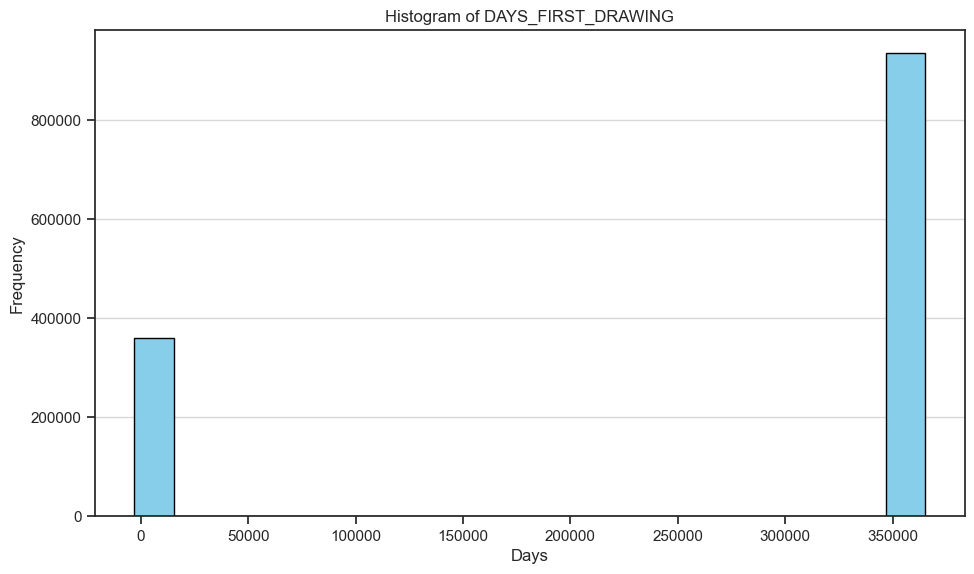

In [270]:
# Filter out extreme values if necessary
#filtered_data = previous_transform['DAYS_FIRST_DRAWING'].loc[previous_transform['DAYS_FIRST_DRAWING'] < 10000]

plt.figure(figsize=(10, 6))
plt.hist(previous_clean['DAYS_FIRST_DRAWING'], bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of DAYS_FIRST_DRAWING')
plt.xlabel('Days')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()


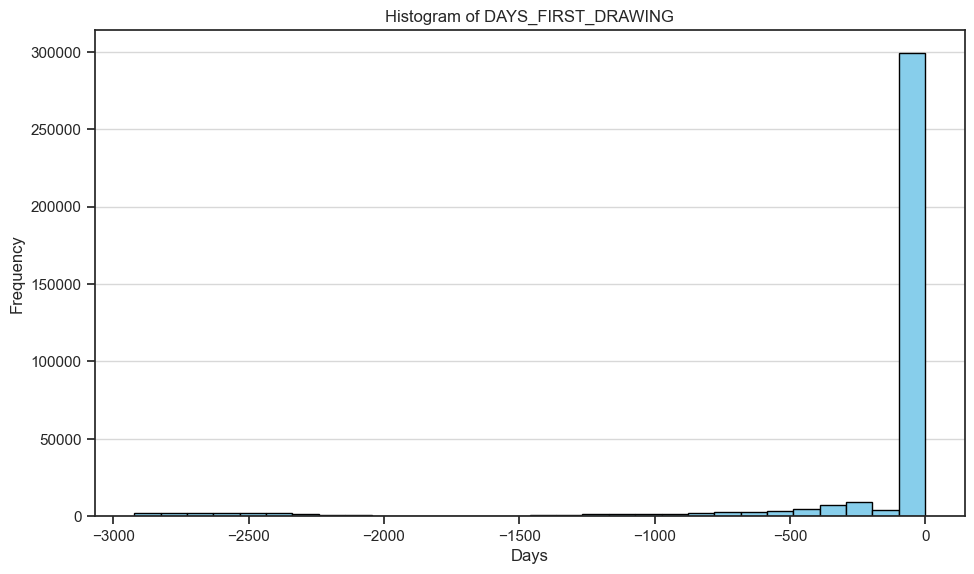

In [271]:
# Filter out extreme values if necessary
filtered_data = previous_transform['DAYS_FIRST_DRAWING'].loc[previous_transform['DAYS_FIRST_DRAWING'] < 10000]

plt.figure(figsize=(10, 6))
plt.hist(filtered_data, bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of DAYS_FIRST_DRAWING')
plt.xlabel('Days')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()


In [272]:
years_first_drawing = previous_transform['DAYS_FIRST_DRAWING'] / 365
years_first_drawing.describe()

count    1.294596e+06
mean     7.221359e+02
std      4.486365e+02
min     -8.005479e+00
25%      0.000000e+00
50%      1.000666e+03
75%      1.000666e+03
max      1.000666e+03
Name: DAYS_FIRST_DRAWING, dtype: float64

In [273]:
print(f'The minimum first drawing days (in years) :{years_first_drawing.min()}')
print(f'The maximum first drawing days (in years) :{years_first_drawing.max()}')

print("negative values indicate that the first drawing was made before the application date of the current loan")

The minimum first drawing days (in years) :-8.005479452054795
The maximum first drawing days (in years) :1000.6657534246575
negative values indicate that the first drawing was made before the application date of the current loan


There are some anomalies in this data. Mostly the first drawing (in the first application) is the same like the current application. We think a large number of entries at 0 days might be default value (missing value that filled with zero). As for the maximum values, there is no way people will received their first drawing in 1.000 years which is anomaly and we will drop this anomaly.

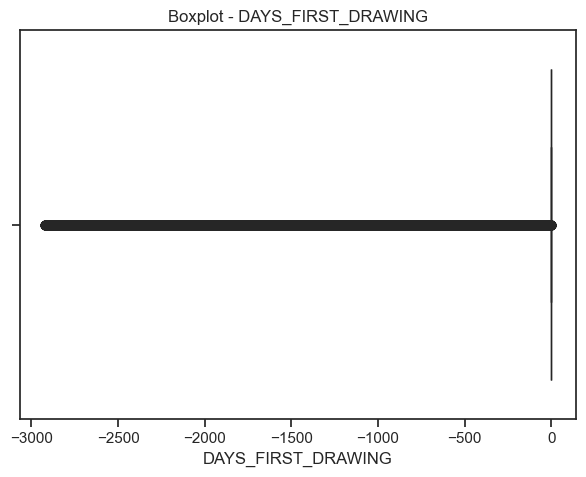

In [274]:
threshold = previous_transform['DAYS_FIRST_DRAWING'].quantile(0.50)
data_above_quantile = previous_transform[previous_transform['DAYS_FIRST_DRAWING'] < threshold]
sns.boxplot((data_above_quantile['DAYS_FIRST_DRAWING']),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

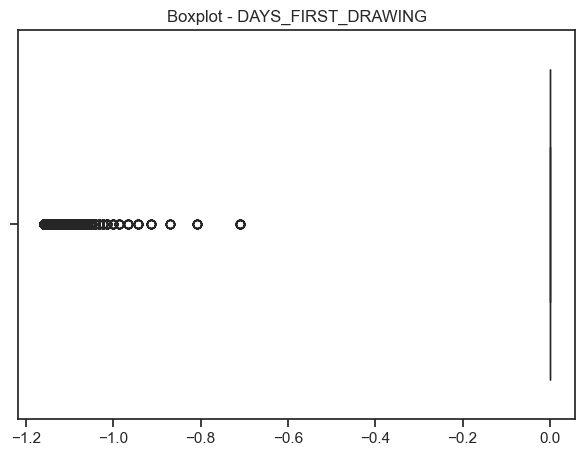

In [275]:
threshold = previous_transform['DAYS_FIRST_DRAWING'].quantile(0.50)
data_above_quantile = previous_transform[previous_transform['DAYS_FIRST_DRAWING'] < threshold]
sns.boxplot(yeojohnson(data_above_quantile['DAYS_FIRST_DRAWING'])[0],color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [276]:
(data_above_quantile['DAYS_FIRST_DRAWING']/365).describe()

count    360166.000000
mean         -0.493799
std           1.506428
min          -8.005479
25%           0.000000
50%           0.000000
75%           0.000000
max           0.000000
Name: DAYS_FIRST_DRAWING, dtype: float64

If we choose to keep this features, we will lost too many data by dropping the outliers and the values dominated by zero (missing value), so we will drop this feature instead because this feature doesn't give much information.

In [277]:
previous_transform.drop(columns=['DAYS_FIRST_DRAWING'], inplace=True)

### DAYS_FIRST_DUE

Relative to application date of current application when was the first due supposed to be of the previous application 

In [278]:
previous_transform['DAYS_FIRST_DUE'].describe()

count    1.294596e+06
mean     1.064954e+04
std      6.384549e+04
min     -2.892000e+03
25%     -1.330000e+03
50%     -5.710000e+02
75%      0.000000e+00
max      3.652430e+05
Name: DAYS_FIRST_DUE, dtype: float64

In [279]:
years_first_due = previous_transform['DAYS_FIRST_DUE'] / 365
years_first_due.describe()  

count    1.294596e+06
mean     2.917683e+01
std      1.749191e+02
min     -7.923288e+00
25%     -3.643836e+00
50%     -1.564384e+00
75%      0.000000e+00
max      1.000666e+03
Name: DAYS_FIRST_DUE, dtype: float64

The value is dominated with 0 that are missing values while there is an outliers with max value 1.000 years, so we will drop this outliers

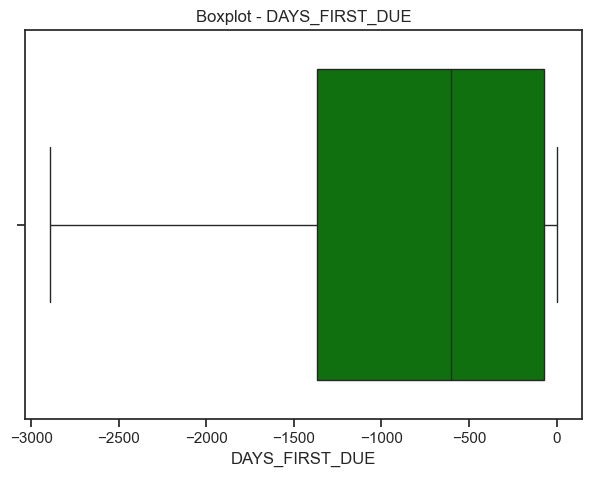

In [280]:
threshold = previous_transform['DAYS_FIRST_DUE'].quantile(0.99)
data_above_quantile = previous_transform[previous_transform['DAYS_FIRST_DUE'] < threshold]

col = 'DAYS_FIRST_DUE'
sns.boxplot((data_above_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [281]:
data_above_quantile['DAYS_FIRST_DUE'].describe()

count    1.253951e+06
mean    -8.440887e+02
std      8.357499e+02
min     -2.892000e+03
25%     -1.369000e+03
50%     -6.050000e+02
75%     -7.400000e+01
max      0.000000e+00
Name: DAYS_FIRST_DUE, dtype: float64

Same with DAYS_FIRST_DRAWING, we considering to drop this feature

In [282]:
def handling_outliers(data):
    data = data.copy()
    threshold = data['DAYS_FIRST_DUE'].quantile(0.99)
    data = data[data['DAYS_FIRST_DUE'] < threshold]
    return data

previous_transform = handling_outliers(previous_transform)

### DAYS_LAST_DUE

Relative to application date of current application when was the last due date of the previous application 


In [283]:
previous_transform['DAYS_LAST_DUE'].describe()

count    1.253951e+06
mean     4.905936e+04
std      1.254624e+05
min     -2.889000e+03
25%     -1.057000e+03
50%     -2.860000e+02
75%      0.000000e+00
max      3.652430e+05
Name: DAYS_LAST_DUE, dtype: float64

In [284]:
years_last_due = previous_transform['DAYS_LAST_DUE'] / 365
years_last_due.describe()

count    1.253951e+06
mean     1.344092e+02
std      3.437325e+02
min     -7.915068e+00
25%     -2.895890e+00
50%     -7.835616e-01
75%      0.000000e+00
max      1.000666e+03
Name: DAYS_LAST_DUE, dtype: float64

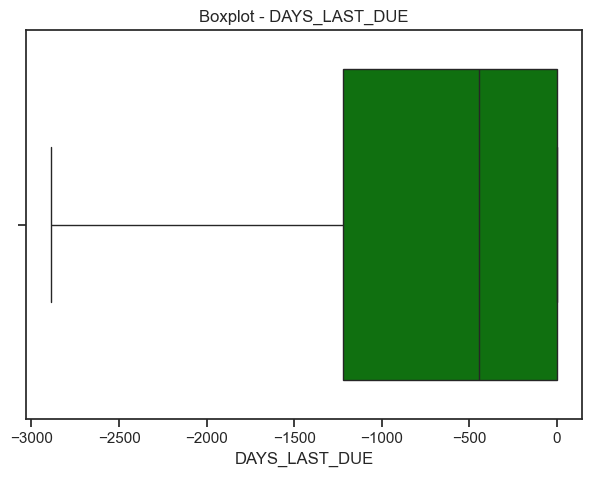

In [285]:
threshold = previous_transform['DAYS_LAST_DUE'].quantile(0.99)
data_above_quantile = previous_transform[previous_transform['DAYS_LAST_DUE'] < threshold]
col = 'DAYS_LAST_DUE'
sns.boxplot((data_above_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [ ]:
data_above_quantile['DAYS_LAST_DUE'].describe()

count    1.083377e+06
mean    -7.226688e+02
std      7.801714e+02
min     -2.889000e+03
25%     -1.221000e+03
50%     -4.450000e+02
75%      0.000000e+00
max      0.000000e+00
Name: DAYS_LAST_DUE, dtype: float64

In [287]:
def handling_outliers(data):
    data = data.copy()
    threshold = data['DAYS_LAST_DUE'].quantile(0.99)
    data = data[data['DAYS_LAST_DUE'] < threshold]
    return data

previous_transform = handling_outliers(previous_transform)
previous_transform['DAYS_LAST_DUE'].describe()

count    1.083377e+06
mean    -7.226688e+02
std      7.801714e+02
min     -2.889000e+03
25%     -1.221000e+03
50%     -4.450000e+02
75%      0.000000e+00
max      0.000000e+00
Name: DAYS_LAST_DUE, dtype: float64

### DAYS_TERMINATION

Relative to application date of current application when was the expected termination (end) of the previous application. We can know wether the previous loans is still active or closed and when it will ended.

In [288]:
previous_transform['DAYS_TERMINATION'].describe()

count    1.083377e+06
mean     5.980990e+03
std      4.902949e+04
min     -2.874000e+03
25%     -1.178000e+03
50%     -4.060000e+02
75%      0.000000e+00
max      3.652430e+05
Name: DAYS_TERMINATION, dtype: float64

In [289]:
years_termination = previous_transform['DAYS_TERMINATION'] / 365
years_termination.describe()    

count    1.083377e+06
mean     1.638627e+01
std      1.343274e+02
min     -7.873973e+00
25%     -3.227397e+00
50%     -1.112329e+00
75%      0.000000e+00
max      1.000666e+03
Name: DAYS_TERMINATION, dtype: float64

There is outliers that shows the max values i 100 years, meaning not realistic so we drop this outliers

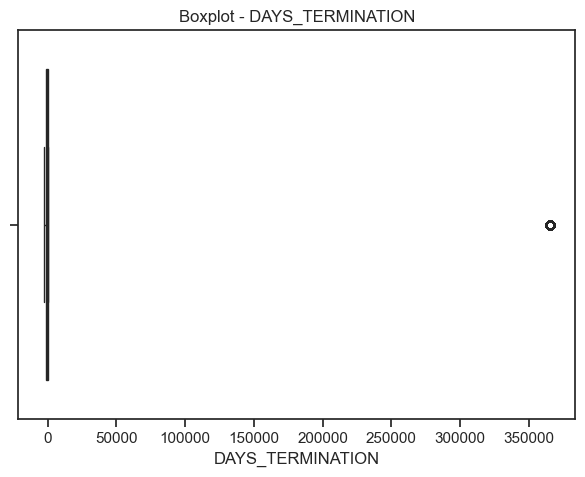

In [290]:
col = 'DAYS_TERMINATION'
sns.boxplot((previous_transform[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

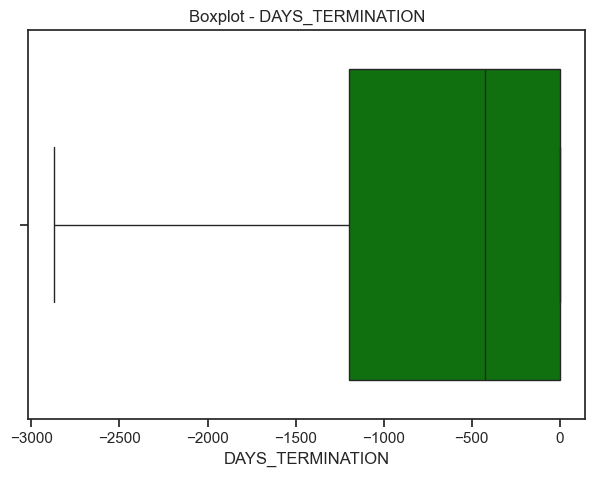

In [291]:
threshold = previous_transform['DAYS_TERMINATION'].quantile(0.99)
data_above_quantile = previous_transform[previous_transform['DAYS_TERMINATION'] < threshold]
col = 'DAYS_TERMINATION'
sns.boxplot((data_above_quantile[col]),color='green',orient='h')
plt.title(f'Boxplot - {col}')
plt.show()

In [292]:
def handling_outliers(data):
    data = data.copy()
    threshold = data['DAYS_TERMINATION'].quantile(0.99)
    data = data[data['DAYS_TERMINATION'] < threshold]
    return data

previous_transform = handling_outliers(previous_transform)

In [293]:
previous_transform.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1063573 entries, 0 to 1670213
Data columns (total 25 columns):
 #   Column                     Non-Null Count    Dtype  
---  ------                     --------------    -----  
 0   SK_ID_PREV                 1063573 non-null  int64  
 1   SK_ID_CURR                 1063573 non-null  int64  
 2   NAME_CONTRACT_TYPE         1063573 non-null  object 
 3   NAME_CASH_LOAN_PURPOSE     738280 non-null   object 
 4   NAME_CONTRACT_STATUS       1063573 non-null  object 
 5   DAYS_DECISION              1063573 non-null  int64  
 6   CODE_REJECT_REASON         1063573 non-null  object 
 7   NAME_TYPE_SUITE            710975 non-null   object 
 8   NAME_GOODS_CATEGORY        608220 non-null   object 
 9   NAME_PORTFOLIO             1063573 non-null  object 
 10  CHANNEL_TYPE               1063573 non-null  object 
 11  SELLERPLACE_AREA           1063573 non-null  int64  
 12  NAME_SELLER_INDUSTRY       671342 non-null   object 
 13  NAME_YIELD_GROUP 

## Feature Encoding

In [294]:
previous_encoding = previous_transform.copy()

In [295]:
previous_encoding.select_dtypes(include=['object']).columns

Index(['NAME_CONTRACT_TYPE', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY',
       'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

### NAME_CONTRACT_TYPE

Contract product type (Cash loan, consumer loan [POS] ,...) of the previous application

In [296]:
previous_encoding['NAME_CONTRACT_TYPE'].value_counts()

NAME_CONTRACT_TYPE
Consumer loans     616922
Cash loans         389011
Revolving loans     57640
Name: count, dtype: int64

We should use one-hot encoding because these values are not ordinal. If we use label encoding, it could lead to misinterpretation.



In [297]:
# One-Hot Encoding
previous_encoding = pd.get_dummies(previous_encoding, columns=['NAME_CONTRACT_TYPE'], prefix='NAME_CONTRACT_TYPE', drop_first=False)

### NAME_CASH_LOAN_PURPOSE

The purpose of the cash loans

In [298]:
previous_encoding['NAME_CASH_LOAN_PURPOSE'].value_counts() / len(previous_encoding['NAME_CASH_LOAN_PURPOSE']) * 100

NAME_CASH_LOAN_PURPOSE
XAP                                 63.424137
Repairs                              2.024685
Other                                1.355619
Urgent needs                         0.711658
Buying a used car                    0.249724
Building a house or an annex         0.233364
Everyday expenses                    0.215500
Medicine                             0.189174
Payments on other loans              0.171968
Education                            0.137461
Journey                              0.105870
Purchase of electronic equipment     0.093082
Buying a new car                     0.089698
Wedding / gift / holiday             0.077851
Buying a home                        0.076534
Car repairs                          0.068166
Furniture                            0.062149
Buying a holiday home / land         0.046071
Business development                 0.037703
Gasification / water supply          0.025198
Buying a garage                      0.011471
Hobby      

We found there are 63% NAME_CAS_LOAN_PURPOSE are XAP, meaning 63% in this feature is missing / unknown. We considering to drop this feature because we think this feature doesn't provide a useful information and since the values category are too many, it will posibly give curse of dimensionality if we choose to do ONE HOT ENCODING.

In [299]:
previous_encoding.drop(columns=['NAME_CASH_LOAN_PURPOSE'], inplace=True)

### NAME_CONTRACT_STATUS

Contract status (approved, cancelled, ...) of previous application

In [300]:
previous_encoding['NAME_CONTRACT_STATUS'].value_counts()

NAME_CONTRACT_STATUS
Approved        805739
Refused         246408
Canceled         10514
Unused offer       912
Name: count, dtype: int64

In [301]:
# One-Hot Encoding
previous_encoding = pd.get_dummies(previous_encoding, columns=['NAME_CONTRACT_STATUS'], prefix='NAME_CONTRACT_STATUS', drop_first=False)

### CODE_REJECT_REASON

Why was the previous application rejected. Although we still lack of information about the code.

In [302]:
previous_encoding['CODE_REJECT_REASON'].value_counts() / len(previous_encoding['CODE_REJECT_REASON']) * 100

CODE_REJECT_REASON
XAP       76.746401
HC        13.791813
LIMIT      4.799012
SCO        3.371278
SCOFR      0.814519
VERIF      0.329644
CLIENT     0.085749
SYSTEM     0.061585
Name: count, dtype: float64

About 76% is XAP, meaning missing value or unknown. Since we do not have more information about the code reject reason and the value is dominantly with XAP, we choose to drop this feature.

In [303]:
previous_encoding.drop(columns=['CODE_REJECT_REASON'], inplace=True)

### NAME_TYPE_SUITE

Who accompanied client when applying for the previous application

In [304]:
previous_encoding['NAME_TYPE_SUITE'].value_counts()

NAME_TYPE_SUITE
Unaccompanied      414722
Family             182777
Spouse, partner     59016
Children            28570
Other_B             15729
Other_A              8182
Group of people      1979
Name: count, dtype: int64

Based on chi-squared test early, we said we will drop chi-squared score under 1.000 but will check the feature first. We found that this feature doesn't give much information, as well as the NAME_TYPE_SUITE score in application_train, so we will just drop this feature and to reduced curse of dimensionality too.

In [305]:
previous_encoding.drop(columns=['NAME_TYPE_SUITE'], inplace=True)

### NAME_GOODS_CATEGORY

What kind of goods did the client apply for in the previous application

In [306]:
previous_encoding['NAME_GOODS_CATEGORY'].value_counts()

NAME_GOODS_CATEGORY
Mobile                      184734
Consumer Electronics        106655
Computers                    88170
Audio/Video                  87160
Furniture                    46368
Photo / Cinema Equipment     22100
Construction Materials       21507
Clothing and Accessories     19284
Auto Accessories              5961
Jewelry                       4511
Homewares                     3809
Medical Supplies              2760
Vehicles                      2634
Sport and Leisure             2550
Other                         2545
Gardening                     2225
Office Appliances             2122
Tourism                       1349
Medicine                      1153
Direct Sales                   162
Fitness                        148
Additional Service             120
Education                       72
Weapon                          65
Insurance                       54
Animals                          1
House Construction               1
Name: count, dtype: int64

This will give us information about the behavior people who loan to Home Credit. Most of people loan for Mobile and Consumer Electronics, if we look up on NAME_CASH_LOAN_PURPOSE, we know the second top is "repair" so we can assume most people apply loan for repairing their electronic. We will to ONE HOT ENCODING for this feature but there are too many categories, our solution is aggregating the categories.

In [307]:
# Label Encoding
def label_encoding(data):
    data = data.copy()
    data['NAME_GOODS_CATEGORY'] = data['NAME_GOODS_CATEGORY'].map({
                                                                        # Electronics group
                                                                        'Mobile': 'Electronics',
                                                                        'Consumer Electronics': 'Electronics',
                                                                        'Computers': 'Electronics',
                                                                        'Audio/Video': 'Electronics',
                                                                        'Photo / Cinema Equipment': 'Electronics',
                                                                        'Office Appliances': 'Electronics',
                                                                        
                                                                        # Home and Living group
                                                                        'Furniture': 'Home and Living',
                                                                        'Construction Materials': 'Home and Living',
                                                                        'Homewares': 'Home and Living',
                                                                        'Gardening': 'Home and Living',
                                                                        'House Construction': 'Home and Living',
                                                                        
                                                                        # Fashion and Accessories group
                                                                        'Clothing and Accessories': 'Fashion',
                                                                        'Jewelry': 'Fashion',
                                                                        
                                                                        # Auto and Transport group
                                                                        'Auto Accessories': 'Auto and Transport',
                                                                        'Vehicles': 'Auto and Transport',
                                                                        
                                                                        # Health and Wellness group
                                                                        'Medical Supplies': 'Health and Wellness',
                                                                        'Medicine': 'Health and Wellness',
                                                                        'Fitness': 'Health and Wellness',
                                                                        'Sport and Leisure': 'Health and Wellness',
                                                                        
                                                                        # Services group
                                                                        'Tourism': 'Services',
                                                                        'Direct Sales': 'Services',
                                                                        'Additional Service': 'Services',
                                                                        'Education': 'Services',
                                                                        'Insurance': 'Services',
                                                                        
                                                                        # Others
                                                                        'Other': 'Other',
                                                                        'unknown': 'Other',
                                                                        'Animals': 'Other',
                                                                        'Weapon': 'Other'
                                                                    })
    return data

In [308]:
previous_encoding = label_encoding(previous_encoding)

In [309]:
previous_encoding['NAME_GOODS_CATEGORY'].value_counts()

NAME_GOODS_CATEGORY
Electronics            490941
Home and Living         73910
Fashion                 23795
Auto and Transport       8595
Health and Wellness      6611
Other                    2611
Services                 1757
Name: count, dtype: int64

In [310]:
previous_encoding = pd.get_dummies(previous_encoding, columns=['NAME_GOODS_CATEGORY'], prefix='NAME_GOODS_CATEGORY', drop_first=False)

### NAME_PORTFOLIO

Was the previous application for CASH, POS, or CAR

1. POS (Point of Sale):
  - Credit in store merchant
  - e.g.: smartphone credit, tv credit, etc.
  - Characteristic:
    * Fast process
    * Amount of credit same as amount of goods price
    * Short term

2. Cars:
  - Vehicles credit
  - Characteristic:
    * there is a loan guarantee
    * Long term

3. Cash:
  - Cash loan / personal laon
  - Characteristic:
    * No loan guarantee
    * More flexible in use
    * High risk (because there is no loan guarantee)

4. Cards:
  - Credit Card
  - Characteristic:
    * Revolving credit (Can use over and over up to a certain limit)
    * Limit can be used repeatedly

In [311]:
previous_encoding['NAME_PORTFOLIO'].value_counts()

NAME_PORTFOLIO
POS      616505
Cash     389011
Cards     57640
Cars        417
Name: count, dtype: int64

In [312]:
# One hot encoding
previous_encoding = pd.get_dummies(previous_encoding, columns=['NAME_PORTFOLIO'], prefix='NAME_PORTFOLIO', drop_first=False)

### CHANNEL_TYPE

Through which channel we acquired the client on the previous application

In [313]:
previous_encoding['CHANNEL_TYPE'].value_counts()

CHANNEL_TYPE
Country-wide                  396540
Credit and cash offices       315913
Stone                         186085
Regional / Local               89473
AP+ (Cash loan)                38685
Contact center                 31793
Channel of corporate sales      4644
Car dealer                       440
Name: count, dtype: int64

Country-wide and Credit and cash offices are top 2 with highest numbers instead of the others so we will make only 3 channel type.

In [314]:
# Feature Encoding
def feature_encoding_prev(data):
    data = data.copy()
    data['CHANNEL_TYPE'] = data['CHANNEL_TYPE'].map({'Country-wide': 'Country-wide', 'Credit and cash offices': 'Credit and cash offices',
                                                     'Stone': 'Other', 'Regional / Local': 'Other', 'AP+ (Cash loan)': 'Other',
                                                    'Contact center': 'Other', 'Channel of corporate sales': 'Other', 'Car dealer': 'Other'})
    data = pd.get_dummies(data, columns=['CHANNEL_TYPE'], prefix='CHANNEL_TYPE', drop_first=False) 
    return data

previous_encoding = feature_encoding_prev(previous_encoding)

### NAME_SELLER_INDUSTRY

The industry of the seller

In [315]:
previous_encoding['NAME_SELLER_INDUSTRY'].value_counts()

NAME_SELLER_INDUSTRY
Consumer electronics    338230
Connectivity            217562
Furniture                48888
Construction             25085
Clothing                 19402
Industry                 17060
Auto technology           3192
Jewelry                   1238
MLM partners               397
Tourism                    288
Name: count, dtype: int64

Consumer electronics and connectivity have the highest numbers, while the others are below 50,000. Therefore, we'll aggregate them to reduce the number of features used.

In [316]:
# Feature Encoding
def feature_encoding_prev(data):
    data = data.copy()
    data['NAME_SELLER_INDUSTRY'] = data['NAME_SELLER_INDUSTRY'].map({'Connectivity': 'Connectivity', 'Consumer electronics': 'Consumer electronics',
                                                                     'Furniture': 'Other', 'Construction': 'Other', 'Clothing': 'Other',
                                                                    'Industry': 'Others', 'Auto technology': 'Other', 'Jewelry': 'Other',
                                                                    'MLM partners': 'Other', 'Tourism': 'Other'})
    data = pd.get_dummies(data, columns=['NAME_SELLER_INDUSTRY'], prefix='NAME_SELLER_INDUSTRY', drop_first=False)
    return data

previous_encoding = feature_encoding_prev(previous_encoding)

### NAME_YIELD_GROUP

Grouped interest rate into small medium and high of the previous application

In [317]:
previous_encoding['NAME_YIELD_GROUP'].value_counts()

NAME_YIELD_GROUP
high          338001
middle        334530
low_normal    262148
low_action     71254
Name: count, dtype: int64

In [318]:
def label_encode(data):
    data['NAME_YIELD_GROUP'] = data['NAME_YIELD_GROUP'].map({'low_action': 1, 'low_normal': 2, 'middle': 3, 'high': 4})
    return data

previous_encoding = label_encode(previous_encoding)

### PRODUCT_COMBINATION

Detailed product combination of the previous application


In [319]:
previous_encoding['PRODUCT_COMBINATION'].value_counts()

PRODUCT_COMBINATION
POS household with interest       234928
POS mobile with interest          178393
Cash X-Sell: middle               120582
Cash X-Sell: low                   94024
POS industry with interest         84394
POS household without interest     70484
Cash Street: high                  57490
Cash X-Sell: high                  54341
Cash Street: middle                32065
Cash Street: low                   30509
Card Street                        29000
Card X-Sell                        28640
POS mobile without interest        18619
POS other with interest            18334
POS industry without interest      10152
POS others without interest         1618
Name: count, dtype: int64

We are considering to drop this feature because too many categories.

In [320]:
previous_encoding.drop(columns=['PRODUCT_COMBINATION'], inplace=True)

In [321]:
previous_final = previous_encoding.copy()

# Merge Data_merge_1 with previous Application and Installment

In [322]:
import pandas as pd

# Assuming instalment_FE is your DataFrame with the listed columns
# Group by 'SK_ID_PREV' and aggregate with various functions
instalment_agg = instalment_FE.groupby('SK_ID_PREV').agg({
    'NUM_INSTALMENT_VERSION': ['mean', 'min', 'max'],
    'DAYS_INSTALMENT': ['mean', 'min', 'max'],
    'DAYS_ENTRY_PAYMENT': ['mean', 'min', 'max'],
    'NUM_INSTALMENT_VERSION_yeojohnson': ['mean', 'min', 'max'],
    'NUM_INSTALMENT_NUMBER_yeojohnson': ['mean', 'min', 'max'],
    'AMT_INSTALMENT_LOG': ['mean', 'min', 'max', 'sum'],
    'AMT_PAYMENT_LOG': ['mean', 'min', 'max', 'sum'],
    'DAYS_LATE': ['mean', 'min', 'max'],
    'PAYMENT_RATIO': ['mean', 'min', 'max'],
    'PAYMENT_DIFF': ['mean', 'min', 'max'],
    'MONTH_INSTALMENT': ['mean', 'min', 'max'],
    'MONTH_ENTRY_PAYMENT': ['mean', 'min', 'max'],
    'YEAR_INSTALLMENT': ['mean', 'min', 'max'],
    'YEAR_ENTRY_PAYMENT': ['mean', 'min', 'max'],
    'FLAG_LATE_PAYMENT': 'sum',
    'FLAG_UNDERPAYMENT': 'sum'
})

# Flatten the MultiIndex columns
instalment_agg.columns = ['INS_' + '_'.join(col).strip() for col in instalment_agg.columns.values]

# Reset index to make 'SK_ID_PREV' a column
instalment_agg.reset_index(inplace=True)

# Merge with previous_final on 'SK_ID_PREV'
data_merge_prev = pd.merge(previous_final, instalment_agg, on='SK_ID_PREV', how='left')


In [323]:
data_agg = data_merge_prev.groupby('SK_ID_CURR').agg({
    # Count of previous applications
    'SK_ID_PREV': 'count',
    
    # Mean values for numeric columns
    'DAYS_DECISION': ['mean', 'min', 'max'],
    'SELLERPLACE_AREA': 'mean',
    'DAYS_FIRST_DUE': ['mean', 'min'],
    'DAYS_LAST_DUE': ['mean', 'max'],
    'DAYS_TERMINATION': 'mean',
    'NFLAG_INSURED_ON_APPROVAL': 'mean',
    
    # Mean for log-transformed amounts
    'AMT_ANNUITY_LOG': 'mean',
    'AMT_APPLICATION_LOG': ['mean', 'sum'],
    'AMT_CREDIT_LOG': ['mean', 'sum'],
    'AMT_DOWN_PAYMENT_LOG': 'mean',
    'RATE_DOWN_PAYMENT_boxcox': 'mean',
    'CNT_PAYMENT_LOG': ['mean', 'sum'],
    
    # Sum for categorical columns (they appear to be dummy variables)
    'NAME_CONTRACT_TYPE_Cash loans': 'sum',
    'NAME_CONTRACT_TYPE_Consumer loans': 'sum',
    'NAME_CONTRACT_TYPE_Revolving loans': 'sum',
    'NAME_CONTRACT_STATUS_Approved': 'sum',
    'NAME_CONTRACT_STATUS_Canceled': 'sum',
    'NAME_CONTRACT_STATUS_Refused': 'sum',
    'NAME_CONTRACT_STATUS_Unused offer': 'sum',
    'NAME_GOODS_CATEGORY_Auto and Transport': 'sum',
    'NAME_GOODS_CATEGORY_Electronics': 'sum',
    'NAME_GOODS_CATEGORY_Fashion': 'sum',
    'NAME_GOODS_CATEGORY_Health and Wellness': 'sum',
    'NAME_GOODS_CATEGORY_Home and Living': 'sum',
    'NAME_GOODS_CATEGORY_Other': 'sum',
    'NAME_GOODS_CATEGORY_Services': 'sum',
    'NAME_PORTFOLIO_Cards': 'sum',
    'NAME_PORTFOLIO_Cars': 'sum',
    'NAME_PORTFOLIO_Cash': 'sum',
    'NAME_PORTFOLIO_POS': 'sum',
    'CHANNEL_TYPE_Country-wide': 'sum',
    'CHANNEL_TYPE_Credit and cash offices': 'sum',
    'CHANNEL_TYPE_Other': 'sum',
    'NAME_SELLER_INDUSTRY_Connectivity': 'sum',
    'NAME_SELLER_INDUSTRY_Consumer electronics': 'sum',
    'NAME_SELLER_INDUSTRY_Others': 'sum',
    
    # Mean for installment-related features
    'INS_NUM_INSTALMENT_VERSION_mean': 'mean',
    'INS_NUM_INSTALMENT_VERSION_min': 'min',
    'INS_NUM_INSTALMENT_VERSION_max': 'max',
    'INS_DAYS_INSTALMENT_mean': 'mean',
    'INS_DAYS_INSTALMENT_min': 'min',
    'INS_DAYS_INSTALMENT_max': 'max',
    'INS_DAYS_ENTRY_PAYMENT_mean': 'mean',
    'INS_DAYS_ENTRY_PAYMENT_min': 'min',
    'INS_DAYS_ENTRY_PAYMENT_max': 'max',
    
    # Mean for transformed installment features
    'INS_NUM_INSTALMENT_VERSION_yeojohnson_mean': 'mean',
    'INS_NUM_INSTALMENT_VERSION_yeojohnson_min': 'min',
    'INS_NUM_INSTALMENT_VERSION_yeojohnson_max': 'max',
    'INS_NUM_INSTALMENT_NUMBER_yeojohnson_mean': 'mean',
    'INS_NUM_INSTALMENT_NUMBER_yeojohnson_min': 'min',
    'INS_NUM_INSTALMENT_NUMBER_yeojohnson_max': 'max',
    
    # Mean and sum for log-transformed amounts
    'INS_AMT_INSTALMENT_LOG_mean': 'mean',
    'INS_AMT_INSTALMENT_LOG_min': 'min',
    'INS_AMT_INSTALMENT_LOG_max': 'max',
    'INS_AMT_INSTALMENT_LOG_sum': 'sum',
    'INS_AMT_PAYMENT_LOG_mean': 'mean',
    'INS_AMT_PAYMENT_LOG_min': 'min',
    'INS_AMT_PAYMENT_LOG_max': 'max',
    'INS_AMT_PAYMENT_LOG_sum': 'sum',
    
    # Statistics for payment-related features
    'INS_DAYS_LATE_mean': 'mean',
    'INS_DAYS_LATE_min': 'min',
    'INS_DAYS_LATE_max': 'max',
    'INS_PAYMENT_RATIO_mean': 'mean',
    'INS_PAYMENT_RATIO_min': 'min',
    'INS_PAYMENT_RATIO_max': 'max',
    'INS_PAYMENT_DIFF_mean': 'mean',
    'INS_PAYMENT_DIFF_min': 'min',
    'INS_PAYMENT_DIFF_max': 'max',
    
    # Time-related features
    'INS_MONTH_INSTALMENT_mean': 'mean',
    'INS_MONTH_INSTALMENT_min': 'min',
    'INS_MONTH_INSTALMENT_max': 'max',
    'INS_MONTH_ENTRY_PAYMENT_mean': 'mean',
    'INS_MONTH_ENTRY_PAYMENT_min': 'min',
    'INS_MONTH_ENTRY_PAYMENT_max': 'max',
    'INS_YEAR_INSTALLMENT_mean': 'mean',
    'INS_YEAR_INSTALLMENT_min': 'min',
    'INS_YEAR_INSTALLMENT_max': 'max',
    'INS_YEAR_ENTRY_PAYMENT_mean': 'mean',
    'INS_YEAR_ENTRY_PAYMENT_min': 'min',
    'INS_YEAR_ENTRY_PAYMENT_max': 'max',
    
    # Sum for flag columns
    'INS_FLAG_LATE_PAYMENT_sum': 'sum',
    'INS_FLAG_UNDERPAYMENT_sum': 'sum'
})


# Flatten the MultiIndex columns
data_agg.columns = ['PREV_' + '_'.join(col).strip() for col in data_agg.columns.values]

# Reset index to make 'SK_ID_PREV' a column
data_agg.reset_index(inplace=True)

# Merge with previous_final on 'SK_ID_PREV'
df_final  = pd.merge(data_merge_1, data_agg, on='SK_ID_CURR', how='left')

In [324]:
df_final.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303976 entries, 0 to 303975
Data columns (total 183 columns):
 #    Column                                                Non-Null Count   Dtype  
---   ------                                                --------------   -----  
 0    SK_ID_CURR                                            303976 non-null  int64  
 1    TARGET                                                303976 non-null  int64  
 2    CODE_GENDER                                           303976 non-null  int64  
 3    NAME_EDUCATION_TYPE                                   303976 non-null  int64  
 4    REGION_POPULATION_RELATIVE                            303976 non-null  float64
 5    DAYS_ID_PUBLISH                                       303976 non-null  int64  
 6    FLAG_MOBIL                                            303976 non-null  int64  
 7    FLAG_WORK_PHONE                                       303976 non-null  int64  
 8    FLAG_CONT_MOBILE                

# Cleaning the merger Data

In [325]:
# df_final
df_final.drop(columns=['SK_ID_CURR'], inplace=True)

In [326]:
replace_missing_with_null(df_final, missing_values_set)

,TARGET,CODE_GENDER,NAME_EDUCATION_TYPE,REGION_POPULATION_RELATIVE,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_INCOME_TOTAL_LOG,AMT_ANNUITY_LOG,DAYS_REGISTRATION_YEOJOHNSON,CNT_FAM_MEMBERS_LOG,EXT_SOURCE_3_YEOJOHNSON,NAME_INCOME_TYPE_Employed,NAME_INCOME_TYPE_Retired,NAME_INCOME_TYPE_Unemployed,NAME_FAMILY_STATUS_Previously Married,NAME_FAMILY_STATUS_Single,HOUSING_TYPE_Living with Family,HOUSING_TYPE_Owned Housing,OCCUPATION_TYPE_Administrative and Core,OCCUPATION_TYPE_Healthcare and Security,OCCUPATION_TYPE_Management,OCCUPATION_TYPE_Manual Labor,OCCUPATION_TYPE_Sales and Service,OCCUPATION_TYPE_Technical and IT,ORGANIZATION_TYPE_Business Entities,ORGANIZATION_TYPE_Construction and Industry,ORGANIZATION_TYPE_Government and Public Services,ORGANIZATION_TYPE_Healthcare and Education,ORGANIZATION_TYPE_Others,ORGANIZATION_TYPE_Self-Employed,DEBT_TO_INCOME_RATIO,ANNUITY_TO_INCOME,AGE,TENURE,EXT_SOURCE_MEAN,BUR_SK_ID_BUREAU_count,BUR_DAYS_CREDIT_min,BUR_DAYS_CREDIT_max,BUR_DAYS_CREDIT_mean,BUR_CNT_CREDIT_PROLONG_sum,BUR_DAYS_CREDIT_UPDATE_min,BUR_DAYS_CREDIT_UPDATE_max,BUR_DAYS_CREDIT_UPDATE_mean,BUR_CREDIT_DAY_OVERDUE_YEOJOHNSON_sum,BUR_DAYS_CREDIT_ENDDATE_LOG_min,BUR_DAYS_CREDIT_ENDDATE_LOG_max,BUR_DAYS_CREDIT_ENDDATE_LOG_mean,BUR_DAYS_ENDDATE_FACT_LOG_min,BUR_DAYS_ENDDATE_FACT_LOG_max,BUR_DAYS_ENDDATE_FACT_LOG_mean,BUR_AMT_CREDIT_SUM_yeojohnson_sum,BUR_AMT_CREDIT_SUM_DEBT_yeojohnson_sum,BUR_AMT_CREDIT_SUM_LIMIT_yeojohnson_sum,BUR_AMT_CREDIT_SUM_OVERDUE_yeojohnson_sum,BUR_CREDIT_ACTIVE_Active_sum,BUR_CREDIT_ACTIVE_Bad debt_sum,BUR_CREDIT_ACTIVE_Closed_sum,BUR_CREDIT_ACTIVE_Sold_sum,BUR_CREDIT_TYPE_Car loan_sum,BUR_CREDIT_TYPE_Consumer credit_sum,BUR_CREDIT_TYPE_Credit card_sum,BUR_CREDIT_TYPE_Other loan_sum,BUR_MONTHS_BALANCE_min_min,BUR_MONTHS_BALANCE_max_max,BUR_MONTHS_BALANCE_mean_mean,BUR_STATUS_Closed_sum_sum,BUR_STATUS_DPD 1-30_sum_sum,BUR_STATUS_DPD 120+_sum_sum,BUR_STATUS_DPD 31-60_sum_sum,BUR_STATUS_DPD 61-90_sum_sum,BUR_STATUS_DPD 91-120_sum_sum,BUR_STATUS_No DPD_sum_sum,BUR_STATUS_Unknown_sum_sum,PREV_SK_ID_PREV_count,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_min,PREV_DAYS_DECISION_max,PREV_SELLERPLACE_AREA_mean,PREV_DAYS_FIRST_DUE_mean,PREV_DAYS_FIRST_DUE_min,PREV_DAYS_LAST_DUE_mean,PREV_DAYS_LAST_DUE_max,PREV_DAYS_TERMINATION_mean,PREV_NFLAG_INSURED_ON_APPROVAL_mean,PREV_AMT_ANNUITY_LOG_mean,PREV_AMT_APPLICATION_LOG_mean,PREV_AMT_APPLICATION_LOG_sum,PREV_AMT_CREDIT_LOG_mean,PREV_AMT_CREDIT_LOG_sum,PREV_AMT_DOWN_PAYMENT_LOG_mean,PREV_RATE_DOWN_PAYMENT_boxcox_mean,PREV_CNT_PAYMENT_LOG_mean,PREV_CNT_PAYMENT_LOG_sum,PREV_NAME_CONTRACT_TYPE_Cash loans_sum,PREV_NAME_CONTRACT_TYPE_Consumer loans_sum,PREV_NAME_CONTRACT_TYPE_Revolving loans_sum,PREV_NAME_CONTRACT_STATUS_Approved_sum,PREV_NAME_CONTRACT_STATUS_Canceled_sum,PREV_NAME_CONTRACT_STATUS_Refused_sum,PREV_NAME_CONTRACT_STATUS_Unused offer_sum,PREV_NAME_GOODS_CATEGORY_Auto and Transport_sum,PREV_NAME_GOODS_CATEGORY_Electronics_sum,PREV_NAME_GOODS_CATEGORY_Fashion_sum,PREV_NAME_GOODS_CATEGORY_Health and Wellness_sum,PREV_NAME_GOODS_CATEGORY_Home and Living_sum,PREV_NAME_GOODS_CATEGORY_Other_sum,PREV_NAME_GOODS_CATEGORY_Services_sum,PREV_NAME_PORTFOLIO_Cards_sum,PREV_NAME_PORTFOLIO_Cars_sum,PREV_NAME_PORTFOLIO_Cash_sum,PREV_NAME_PORTFOLIO_POS_sum,PREV_CHANNEL_TYPE_Country-wide_sum,PREV_CHANNEL_TYPE_Credit and cash offices_sum,PREV_CHANNEL_TYPE_Other_sum,PREV_NAME_SELLER_INDUSTRY_Connectivity_sum,PREV_NAME_SELLER_INDUSTRY_Consumer electronics_sum,PREV_NAME_SELLER_INDUSTRY_Others_sum,PREV_INS_NUM_INSTALMENT_VERSION_mean_mean,PREV_INS_NUM_INSTALMENT_VERSION_min_min,PREV_INS_NUM_INSTALMENT

In [327]:
# Check null value (data) after handling null value
null_analysis = check_null_percentage(df_final)
print("Total rows in dataset:", len(df_final))
print("\nNull Value Analysis:")
print(null_analysis)

Total rows in dataset: 303976

Null Value Analysis:
                                                      Total_Null  \
BUR_MONTHS_BALANCE_min_min                              214241     
BUR_MONTHS_BALANCE_mean_mean                            214241     
BUR_MONTHS_BALANCE_max_max                              214241     
PREV_RATE_DOWN_PAYMENT_boxcox_mean                      116387     
BUR_DAYS_CREDIT_ENDDATE_LOG_mean                        102759     
BUR_DAYS_CREDIT_ENDDATE_LOG_min                         102759     
BUR_DAYS_CREDIT_ENDDATE_LOG_max                         102759     
BUR_SK_ID_BUREAU_count                                   48472     
BUR_DAYS_CREDIT_min                                      48472     
BUR_DAYS_ENDDATE_FACT_LOG_min                            48472     
BUR_CREDIT_DAY_OVERDUE_YEOJOHNSON_sum                    48472     
BUR_DAYS_CREDIT_UPDATE_min                               48472     
BUR_DAYS_CREDIT_UPDATE_max                               48472  

BUR_MONTS_BALANCE seems have a high missing value while the other are belom 40%. So, to make it fast we will drop BUR_MONTHS_BALANCE and the rest will drop rows data to make training data a bit more faster. But, we will make two scenario where one dataset is fill it with median while other drop the data rows

In [328]:
print(f'Total duplicated rows in df_final: {df_final.duplicated().sum()}')

Total duplicated rows in df_final: 0


In [344]:
# Handling missing values
df_final_1 = df_final.copy()

def handling_na_scen_1(data):
    data = data.copy()
    # Drop features with high missing values
    data.drop(columns=['BUR_MONTHS_BALANCE_min_min', 'BUR_MONTHS_BALANCE_mean_mean', 'BUR_MONTHS_BALANCE_max_max'], inplace=True)

    # Drop missing values
    data = data.dropna()

    return data

df_final_1 = handling_na_scen_1(df_final_1)

In [345]:
# Handling missing values
df_final_2 = df_final.copy()

def handling_na_scen_2(data):
    data = data.copy()
    # Drop features with high missing values
    data.drop(columns=['BUR_MONTHS_BALANCE_min_min', 'BUR_MONTHS_BALANCE_mean_mean', 'BUR_MONTHS_BALANCE_max_max'], inplace=True)

    # Drop missing values
    data = data.fillna(data.median())

    return data

df_final_2 = handling_na_scen_2(df_final_2)

In [346]:
# Remove infinite values
df_final_1 = pd.DataFrame(np.nan_to_num(df_final_1, nan=0, posinf=0, neginf=0), columns=df_final_1.columns)
df_final_2 = pd.DataFrame(np.nan_to_num(df_final_2, nan=0, posinf=0, neginf=0), columns=df_final_2.columns)

In [347]:
print(f'df_final_1 shape: {df_final_1.shape}')
print(f'df_final_2 shape: {df_final_2.shape}')

df_final_1 shape: (126216, 179)
df_final_2 shape: (303976, 179)


In [349]:
df_final_1.to_csv('df_final_1_v1.1.csv.gz', index=False, compression='gzip')
df_final_2.to_csv('df_final_2_v1.1.csv.gz', index=False, compression='gzip')